## Self Organizing Maps

Self-organizing map (SOM) is a form of artificial neural network. It is trained by using
unsupervised learning to generate a two-dimensional presentation of the input metrics.
Therefore, SOM is one algorithm can realize dimensionality reduction. SOM is an appro-
priate tool for visualizing low-dimensional graphs of high-dimensional input data for its
function of preserving the topological properties of the input data space.

## Experiments

Regarding the SOM, we intended to explore the influence of changing inherent variables
of the algorithm. In the first experiment, the number of iterations were set as 500,
1000, and 2000 and the other parameters were fixed as following: OP learning rate =
1.0; Tuning phase (TP) learning rate = 1; TP Neighborhood distance = 1; and Map size
= 20x20. In the second experiment, the number of iterations was fixed as 500, and the
Neighbourhood distance was fixed at 1. While the Map size were set as 10×10, 20×20,
30×30. In the third experiment, the OP steps were fixed in 500 iterations and the TP
Neighborhood distances were set as 1, 10 and 20, while the other variables were not mod-
ified.

## Results

SOM neighborhood weight distance graph, which indicates the distances between neighboring neurons.

## Running a hybrid approach with SOM and FKMEANS

In [1]:
import matplotlib.pylab as plt
import pandas as pd
import numpy as np
from time import time
import sompy

backend module://ipykernel.pylab.backend_inline version unknown


## Dealing with Actual Data

In [2]:
data_location = '/home/sarai/Documents/UPE/tcc/hybrid-approach/5_gait_symmetry_ratios_and_2_kinematic_features_from_180_samples2.csv'
data = pd.read_csv(data_location)
# data = data.drop(['Number', 'Gender', 'Age'], axis=1)
print(data.head())

data = data.values

      Rst     Rsw    RssR    RssL      Rs  ACT[s]  Cadence
0  1.0547  1.0581  1.4835  1.4884  0.9967  0.7080   2.8249
1  1.3552  0.9913  1.7594  1.2870  1.3671  0.7633   2.6201
2  1.0082  1.0353  1.3977  1.4353  0.9738  0.6920   2.8902
3  0.9524  0.9363  1.5200  1.4944  1.0171  0.6893   2.9014
4  0.8895  1.1240  1.3190  1.6667  0.7914  0.7307   2.7372


In [3]:
group_0_10 = data[:30]
group_10_19 = data[30:60]
group_20_29 = data[60:90]
group_30_39 = data[90:120]
group_40_49 = data[120:150]
group_over_50 = data[150:]

In [4]:
def plot_data(som, plot1=True, plot2=True, plot3=True, plot4=True, plot5=True, plot6=True):
    if plot1:
        proj = som.project_data(group_0_10)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(321)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='Gray',
                                marker='o', cmap='jet', linewidths=3, edgecolor='Gray')

    if plot2:
        proj = som.project_data(group_10_19)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(322)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='black',
                                marker='o', cmap='jet', linewidths=3, edgecolor='black')
    if plot3:
        proj = som.project_data(group_20_29)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(323)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='brown',
                                marker='o', cmap='jet', linewidths=3, edgecolor='brown')
    if plot4:
        proj = som.project_data(group_30_39)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(324)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='blue',
                                marker='o', cmap='jet', linewidths=3, edgecolor='blue')
    if plot5:
        proj = som.project_data(group_40_49)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(325)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='green',
                                marker='o', cmap='jet', linewidths=3, edgecolor='green')
    if plot6:
        proj = som.project_data(group_over_50)
        coord = som.bmu_ind_to_xy(proj)
        plt.subplot(326)
        plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c='red',
                                marker='o', cmap='jet', linewidths=3, edgecolor='red')

In [5]:
def plot_one_type(som, data, color):
    proj = som.project_data(data)
    coord = som.bmu_ind_to_xy(proj)
    plt.subplot(321)
    plt.scatter(coord[:, 1], coord[:, 0], s=2, alpha=1., c=color,
                            marker='o', cmap='jet', linewidths=3, edgecolor=color)

# Map Size 20x20

### Num of iterations = 500

In [6]:
mapsize = [20,20]
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.702430536445525
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.029000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 500

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1 ---> elapsed time:  0.137000, quantization error: 1.138843

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 2 ---> elapsed time:  0.120000, quantization error: 1.073867

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 3 ---> elapsed time:  0.120000, quantization error: 1.048154

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 52 ---> elapsed time:  0.121000, quantization error: 0.947593

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 53 ---> elapsed time:  0.122000, quantization error: 0.946701

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 54 ---> elapsed time:  0.122000, quantization error: 0.946029

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 55 ---> elapsed time:  0.126000, quantization error: 0.945358

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 56 ---> elapsed time:  0.129000, quantization error: 0.944688

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 57 ---> elapsed time:  0.139000, quantization error: 0.944019

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch:

 find_bmu took: 0.114000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 106 ---> elapsed time:  0.134000, quantization error: 0.905667

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 107 ---> elapsed time:  0.122000, quantization error: 0.904259

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 108 ---> elapsed time:  0.123000, quantization error: 0.903452

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 109 ---> elapsed time:  0.126000, quantization error: 0.902681

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 110 ---> elapsed time:  0.123000, quantization error: 0.901983

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 111 ---> elapsed time:  0.122000, quantization error: 0.900681

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 160 ---> elapsed time:  0.118000, quantization error: 0.862418

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 161 ---> elapsed time:  0.117000, quantization error: 0.861682

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 162 ---> elapsed time:  0.118000, quantization error: 0.860946

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 163 ---> elapsed time:  0.122000, quantization error: 0.860131

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 164 ---> elapsed time:  0.117000, quantization error: 0.859395

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 165 ---> elapsed time:  0.135000, quantization error: 0.858654

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 214 ---> elapsed time:  0.138000, quantization error: 0.808202

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 215 ---> elapsed time:  0.131000, quantization error: 0.807346

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 216 ---> elapsed time:  0.121000, quantization error: 0.806536

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 217 ---> elapsed time:  0.118000, quantization error: 0.805728

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 218 ---> elapsed time:  0.121000, quantization error: 0.804921

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 219 ---> elapsed time:  0.118000, quantization error: 0.804116

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 268 ---> elapsed time:  0.112000, quantization error: 0.754886

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 269 ---> elapsed time:  0.118000, quantization error: 0.753890

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 270 ---> elapsed time:  0.125000, quantization error: 0.753005

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 271 ---> elapsed time:  0.119000, quantization error: 0.752122

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 272 ---> elapsed time:  0.125000, quantization error: 0.751239

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 273 ---> elapsed time:  0.118000, quantization error: 0.750123

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 322 ---> elapsed time:  0.119000, quantization error: 0.696601

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 323 ---> elapsed time:  0.117000, quantization error: 0.695729

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 324 ---> elapsed time:  0.112000, quantization error: 0.694668

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 325 ---> elapsed time:  0.121000, quantization error: 0.693531

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 326 ---> elapsed time:  0.121000, quantization error: 0.692572

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 327 ---> elapsed time:  0.116000, quantization error: 0.691610

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 376 ---> elapsed time:  0.125000, quantization error: 0.637682

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 377 ---> elapsed time:  0.116000, quantization error: 0.636718

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 378 ---> elapsed time:  0.119000, quantization error: 0.635757

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 379 ---> elapsed time:  0.116000, quantization error: 0.634794

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 380 ---> elapsed time:  0.118000, quantization error: 0.633729

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 381 ---> elapsed time:  0.117000, quantization error: 0.632765

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 430 ---> elapsed time:  0.126000, quantization error: 0.569287

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 431 ---> elapsed time:  0.121000, quantization error: 0.568129

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 432 ---> elapsed time:  0.120000, quantization error: 0.566268

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 433 ---> elapsed time:  0.118000, quantization error: 0.564975

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 434 ---> elapsed time:  0.119000, quantization error: 0.563434

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.120000, quantization error: 0.562267

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 484 ---> elapsed time:  0.115000, quantization error: 0.488849

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 485 ---> elapsed time:  0.122000, quantization error: 0.483804

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 486 ---> elapsed time:  0.125000, quantization error: 0.480924

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 487 ---> elapsed time:  0.119000, quantization error: 0.479427

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 488 ---> elapsed time:  0.119000, quantization error: 0.477928

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 489 ---> elapsed time:  0.119000, quantization error: 0.476427

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 epoch: 37 ---> elapsed time:  0.129000, quantization error: 0.456313

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 38 ---> elapsed time:  0.113000, quantization error: 0.456313

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 39 ---> elapsed time:  0.123000, quantization error: 0.456313

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 40 ---> elapsed time:  0.114000, quantization error: 0.456313

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 41 ---> elapsed time:  0.125000, quantization error: 0.456313

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 42 ---> elapsed time:  0.116000, quantization error: 0.456313

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 43 ---> elapsed time:  0.118000, quantization error: 0.456313

 find_bmu took: 0

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0 to DejaVu Sans ('/home/sarai/.virtualenvs/jupyter-notebook/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to DejaVu Sans ('/home/sarai/.virtualenvs/jupyter-notebook/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score

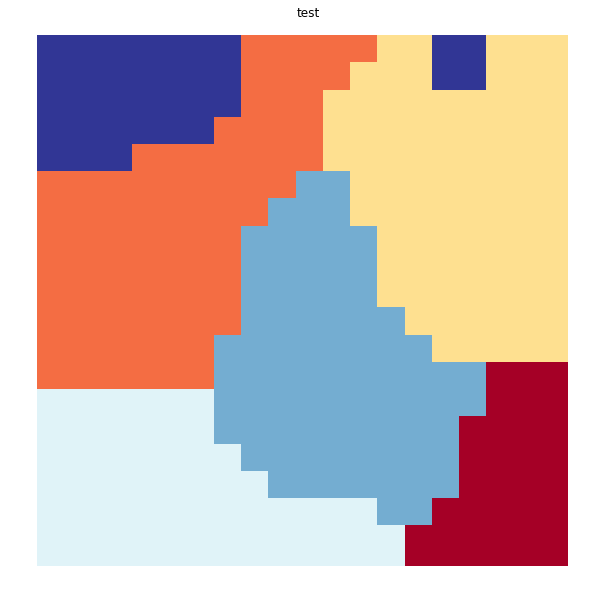

In [7]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

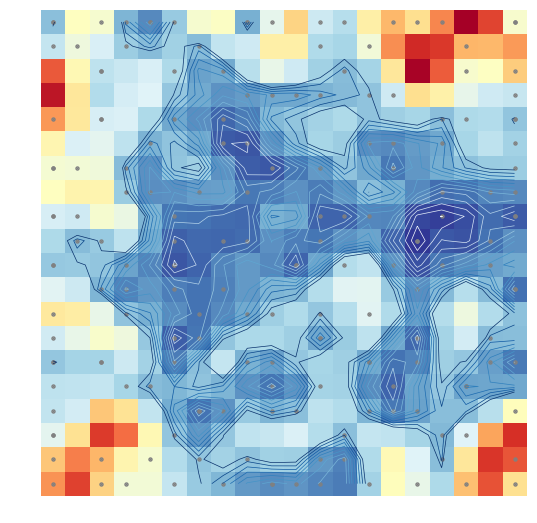

([], array([[0.35820552, 0.56865444, 0.54618487, 0.3377933 , 0.26839341,
         0.37699818, 0.5446766 , 0.56167583, 0.32923888, 0.5022005 ,
         0.67156411, 0.45773254, 0.4215409 , 0.60864366, 0.71663057,
         0.6507339 , 0.78644347, 0.984196  , 0.87287989, 0.55016238],
        [0.44558767, 0.52543827, 0.47571485, 0.3832829 , 0.35014975,
         0.39109817, 0.35045474, 0.44192074, 0.45950649, 0.6096672 ,
         0.61063199, 0.41130954, 0.40023409, 0.53250755, 0.77545379,
         0.91085076, 0.88989994, 0.72117073, 0.71852563, 0.76021708],
        [0.84481179, 0.58785877, 0.43522312, 0.45218468, 0.47633   ,
         0.4082521 , 0.30722486, 0.31955115, 0.42441704, 0.50943343,
         0.46122811, 0.39026331, 0.35048501, 0.39537179, 0.63412938,
         0.97732682, 0.84000979, 0.5496867 , 0.5659341 , 0.68352738],
        [0.94448353, 0.63246778, 0.41647214, 0.47088197, 0.48862999,
         0.36980338, 0.31936275, 0.28246012, 0.29555019, 0.31537859,
         0.3156874 , 0.3338

In [8]:
# ALL THE 180 INDIVIDUOS
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

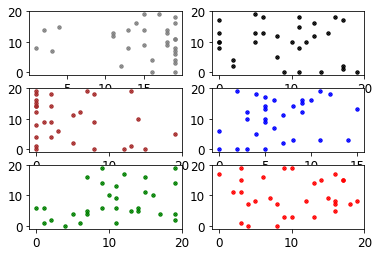

In [9]:
# INDIVIDUOS BY GROUP
plot_data(som)

### 1000 iterations

In [10]:
mapsize = [20,20]
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.702430536445525
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.017000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 1000

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1 ---> elapsed time:  0.116000, quantization error: 1.138843

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 2 ---> elapsed time:  0.122000, quantization error: 1.073867

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 3 ---> elapsed time:  0.117000, quantization error: 1.048440

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 52 ---> elapsed time:  0.114000, quantization error: 0.966205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 53 ---> elapsed time:  0.125000, quantization error: 0.965567

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 54 ---> elapsed time:  0.117000, quantization error: 0.965448

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.128000, quantization error: 0.964670

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 56 ---> elapsed time:  0.120000, quantization error: 0.964349

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 57 ---> elapsed time:  0.117000, quantization error: 0.964027

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch:

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 106 ---> elapsed time:  0.121000, quantization error: 0.946126

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 107 ---> elapsed time:  0.123000, quantization error: 0.945791

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 108 ---> elapsed time:  0.117000, quantization error: 0.945456

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 109 ---> elapsed time:  0.121000, quantization error: 0.945122

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 110 ---> elapsed time:  0.118000, quantization error: 0.944787

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 111 ---> elapsed time:  0.118000, quantization error: 0.944453

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 160 ---> elapsed time:  0.125000, quantization error: 0.927007

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 161 ---> elapsed time:  0.120000, quantization error: 0.926672

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 162 ---> elapsed time:  0.119000, quantization error: 0.926339

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 163 ---> elapsed time:  0.117000, quantization error: 0.926005

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 164 ---> elapsed time:  0.124000, quantization error: 0.925671

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 165 ---> elapsed time:  0.118000, quantization error: 0.925338

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 214 ---> elapsed time:  0.115000, quantization error: 0.903321

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 215 ---> elapsed time:  0.125000, quantization error: 0.902976

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 216 ---> elapsed time:  0.113000, quantization error: 0.902630

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 217 ---> elapsed time:  0.116000, quantization error: 0.902156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 218 ---> elapsed time:  0.122000, quantization error: 0.901237

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 219 ---> elapsed time:  0.119000, quantization error: 0.900752

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 268 ---> elapsed time:  0.118000, quantization error: 0.881142

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 269 ---> elapsed time:  0.125000, quantization error: 0.880788

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 270 ---> elapsed time:  0.132000, quantization error: 0.880433

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 271 ---> elapsed time:  0.119000, quantization error: 0.879630

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 272 ---> elapsed time:  0.122000, quantization error: 0.879399

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 273 ---> elapsed time:  0.127000, quantization error: 0.879377

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 322 ---> elapsed time:  0.124000, quantization error: 0.858212

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 323 ---> elapsed time:  0.124000, quantization error: 0.857839

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 324 ---> elapsed time:  0.127000, quantization error: 0.857467

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 325 ---> elapsed time:  0.116000, quantization error: 0.856819

 find_bmu took: 0.118000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 326 ---> elapsed time:  0.134000, quantization error: 0.856255

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 327 ---> elapsed time:  0.116000, quantization error: 0.855882

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 376 ---> elapsed time:  0.129000, quantization error: 0.830849

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 377 ---> elapsed time:  0.127000, quantization error: 0.830377

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 378 ---> elapsed time:  0.121000, quantization error: 0.829875

 find_bmu took: 0.114000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 379 ---> elapsed time:  0.131000, quantization error: 0.828801

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 380 ---> elapsed time:  0.125000, quantization error: 0.827502

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 381 ---> elapsed time:  0.117000, quantization error: 0.826643

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 430 ---> elapsed time:  0.124000, quantization error: 0.804364

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.121000, quantization error: 0.803442

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 432 ---> elapsed time:  0.119000, quantization error: 0.803041

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 433 ---> elapsed time:  0.118000, quantization error: 0.802641

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 434 ---> elapsed time:  0.118000, quantization error: 0.802241

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 435 ---> elapsed time:  0.117000, quantization error: 0.801841

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.125000, quantization error: 0.777770

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.115000, quantization error: 0.777346

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 486 ---> elapsed time:  0.115000, quantization error: 0.776922

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 487 ---> elapsed time:  0.116000, quantization error: 0.776244

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 488 ---> elapsed time:  0.115000, quantization error: 0.775819

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 489 ---> elapsed time:  0.114000, quantization error: 0.775394

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 538 ---> elapsed time:  0.118000, quantization error: 0.751695

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 539 ---> elapsed time:  0.117000, quantization error: 0.751248

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 540 ---> elapsed time:  0.122000, quantization error: 0.750802

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 541 ---> elapsed time:  0.124000, quantization error: 0.750356

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 542 ---> elapsed time:  0.118000, quantization error: 0.749911

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 543 ---> elapsed time:  0.116000, quantization error: 0.749466

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 592 ---> elapsed time:  0.121000, quantization error: 0.724203

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 593 ---> elapsed time:  0.118000, quantization error: 0.723757

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 594 ---> elapsed time:  0.116000, quantization error: 0.723138

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 595 ---> elapsed time:  0.120000, quantization error: 0.722374

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 596 ---> elapsed time:  0.120000, quantization error: 0.721361

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 597 ---> elapsed time:  0.114000, quantization error: 0.720877

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 646 ---> elapsed time:  0.112000, quantization error: 0.695485

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 647 ---> elapsed time:  0.123000, quantization error: 0.695011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 648 ---> elapsed time:  0.119000, quantization error: 0.694568

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 649 ---> elapsed time:  0.117000, quantization error: 0.693912

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 650 ---> elapsed time:  0.120000, quantization error: 0.692911

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 651 ---> elapsed time:  0.123000, quantization error: 0.692437

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 700 ---> elapsed time:  0.130000, quantization error: 0.663217

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 701 ---> elapsed time:  0.123000, quantization error: 0.662720

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 702 ---> elapsed time:  0.121000, quantization error: 0.662223

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 703 ---> elapsed time:  0.120000, quantization error: 0.661726

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 704 ---> elapsed time:  0.117000, quantization error: 0.661231

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 705 ---> elapsed time:  0.120000, quantization error: 0.660735

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 754 ---> elapsed time:  0.123000, quantization error: 0.632696

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 755 ---> elapsed time:  0.119000, quantization error: 0.632198

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 756 ---> elapsed time:  0.118000, quantization error: 0.631702

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 757 ---> elapsed time:  0.118000, quantization error: 0.631205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 758 ---> elapsed time:  0.119000, quantization error: 0.630709

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 759 ---> elapsed time:  0.117000, quantization error: 0.629580

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 808 ---> elapsed time:  0.125000, quantization error: 0.598570

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 809 ---> elapsed time:  0.126000, quantization error: 0.598002

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 810 ---> elapsed time:  0.116000, quantization error: 0.597434

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 811 ---> elapsed time:  0.127000, quantization error: 0.596867

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 812 ---> elapsed time:  0.119000, quantization error: 0.596300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 813 ---> elapsed time:  0.114000, quantization error: 0.595733

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 862 ---> elapsed time:  0.120000, quantization error: 0.564186

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 863 ---> elapsed time:  0.113000, quantization error: 0.563600

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 864 ---> elapsed time:  0.124000, quantization error: 0.563014

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 865 ---> elapsed time:  0.118000, quantization error: 0.562429

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 866 ---> elapsed time:  0.116000, quantization error: 0.561844

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 867 ---> elapsed time:  0.124000, quantization error: 0.560365

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 916 ---> elapsed time:  0.116000, quantization error: 0.527512

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 917 ---> elapsed time:  0.121000, quantization error: 0.526878

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 918 ---> elapsed time:  0.118000, quantization error: 0.526242

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 919 ---> elapsed time:  0.120000, quantization error: 0.525352

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 920 ---> elapsed time:  0.122000, quantization error: 0.524383

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 921 ---> elapsed time:  0.119000, quantization error: 0.521870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 970 ---> elapsed time:  0.117000, quantization error: 0.480400

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 971 ---> elapsed time:  0.122000, quantization error: 0.479655

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 972 ---> elapsed time:  0.117000, quantization error: 0.478908

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 973 ---> elapsed time:  0.118000, quantization error: 0.478161

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 974 ---> elapsed time:  0.120000, quantization error: 0.477414

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 975 ---> elapsed time:  0.124000, quantization error: 0.476666

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 23 ---> elapsed time:  0.125000, quantization error: 0.455156

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 24 ---> elapsed time:  0.125000, quantization error: 0.455156

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 25 ---> elapsed time:  0.122000, quantization error: 0.455156

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 26 ---> elapsed time:  0.121000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 27 ---> elapsed time:  0.123000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 28 ---> elapsed time:  0.116000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 29 ---> elapsed time:  0.117000,

 update_codebook_voronoi took: 0.003000 seconds
 epoch: 77 ---> elapsed time:  0.122000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 78 ---> elapsed time:  0.116000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 79 ---> elapsed time:  0.120000, quantization error: 0.455156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 80 ---> elapsed time:  0.118000, quantization error: 0.455156

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 81 ---> elapsed time:  0.126000, quantization error: 0.455156

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 82 ---> elapsed time:  0.121000, quantization error: 0.455156

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 83 ---> elapsed time:  0.120000,

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.399999999999999 to DejaVu Sans ('/home/sarai/.virtualenvs/jupyter-notebook/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000


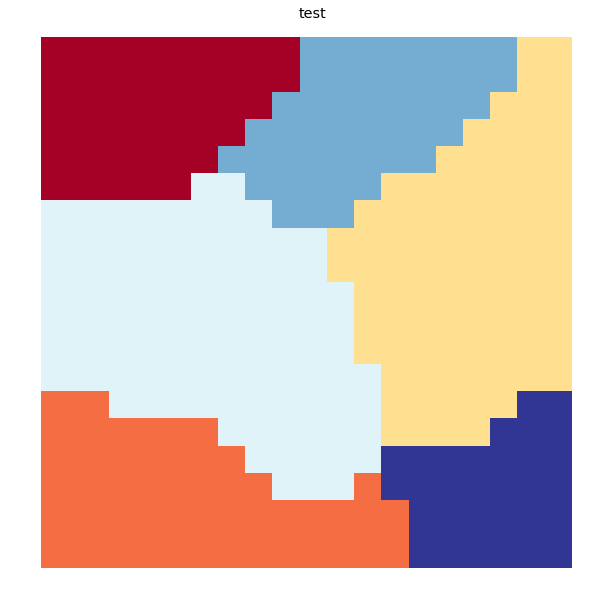

In [11]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

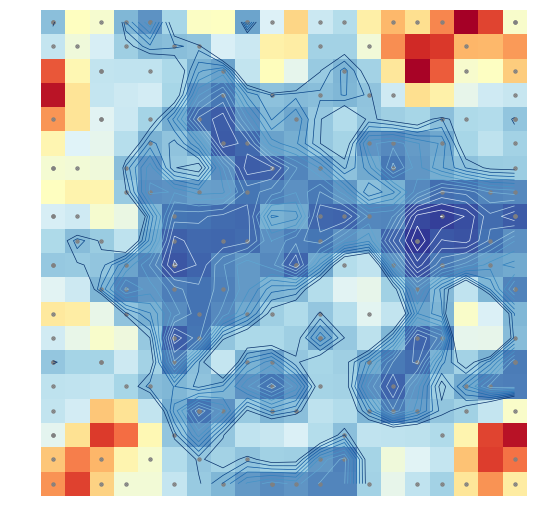

([], array([[0.35841067, 0.56893046, 0.54523326, 0.34232104, 0.28214772,
         0.40093752, 0.56168801, 0.5645254 , 0.30969549, 0.48264138,
         0.66847506, 0.45317926, 0.41997056, 0.60844428, 0.71661656,
         0.65073367, 0.78644347, 0.984196  , 0.87287989, 0.55016238],
        [0.4461938 , 0.52751916, 0.47355711, 0.38730032, 0.3459835 ,
         0.35503096, 0.36423001, 0.47827539, 0.45515371, 0.60687048,
         0.6180392 , 0.39424589, 0.39316889, 0.53134358, 0.77538808,
         0.91085049, 0.88990006, 0.72117073, 0.71852563, 0.76021708],
        [0.84573615, 0.59168266, 0.44018548, 0.43675552, 0.4374334 ,
         0.40629429, 0.33169174, 0.30712688, 0.44081874, 0.57527177,
         0.50299145, 0.37539984, 0.3365238 , 0.39259016, 0.63411807,
         0.97733811, 0.84000999, 0.5496867 , 0.5659341 , 0.68352738],
        [0.94603319, 0.64052292, 0.4452627 , 0.45679404, 0.46661734,
         0.39944426, 0.28158751, 0.24429112, 0.33027988, 0.35989636,
         0.34808337, 0.3546

In [12]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

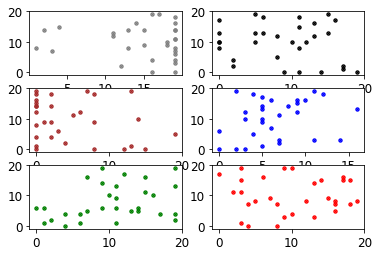

In [13]:
plot_data(som)

### 2000 iterations

In [14]:
mapsize = [20,20]
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.702430536445525
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.023000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 2000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1 ---> elapsed time:  0.116000, quantization error: 1.138843

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 2 ---> elapsed time:  0.123000, quantization error: 1.073867

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 3 ---> elapsed time:  0.117000, quantization error: 1.048582

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 52 ---> elapsed time:  0.120000, quantization error: 0.975151

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 53 ---> elapsed time:  0.118000, quantization error: 0.974996

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 54 ---> elapsed time:  0.117000, quantization error: 0.974841

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 55 ---> elapsed time:  0.117000, quantization error: 0.974687

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 56 ---> elapsed time:  0.118000, quantization error: 0.974532

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 57 ---> elapsed time:  0.119000, quantization error: 0.974377

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch:

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 106 ---> elapsed time:  0.131000, quantization error: 0.966692

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 107 ---> elapsed time:  0.135000, quantization error: 0.966536

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 108 ---> elapsed time:  0.131000, quantization error: 0.966381

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 109 ---> elapsed time:  0.123000, quantization error: 0.966225

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 110 ---> elapsed time:  0.123000, quantization error: 0.966070

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 111 ---> elapsed time:  0.118000, quantization error: 0.965914

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 160 ---> elapsed time:  0.124000, quantization error: 0.955933

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.125000, quantization error: 0.955768

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 162 ---> elapsed time:  0.121000, quantization error: 0.955603

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 163 ---> elapsed time:  0.128000, quantization error: 0.955438

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 164 ---> elapsed time:  0.117000, quantization error: 0.955273

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 165 ---> elapsed time:  0.124000, quantization error: 0.955109

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 214 ---> elapsed time:  0.117000, quantization error: 0.944664

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 215 ---> elapsed time:  0.117000, quantization error: 0.944496

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 216 ---> elapsed time:  0.116000, quantization error: 0.944327

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 217 ---> elapsed time:  0.118000, quantization error: 0.944159

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 218 ---> elapsed time:  0.117000, quantization error: 0.943990

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 219 ---> elapsed time:  0.132000, quantization error: 0.943822

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.130000, quantization error: 0.935153

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 269 ---> elapsed time:  0.122000, quantization error: 0.934983

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 270 ---> elapsed time:  0.120000, quantization error: 0.934814

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 271 ---> elapsed time:  0.120000, quantization error: 0.934644

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 272 ---> elapsed time:  0.116000, quantization error: 0.934475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 273 ---> elapsed time:  0.117000, quantization error: 0.934305

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 322 ---> elapsed time:  0.116000, quantization error: 0.921633

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 323 ---> elapsed time:  0.121000, quantization error: 0.921460

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 324 ---> elapsed time:  0.118000, quantization error: 0.921035

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 325 ---> elapsed time:  0.117000, quantization error: 0.920862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 326 ---> elapsed time:  0.123000, quantization error: 0.920689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 327 ---> elapsed time:  0.117000, quantization error: 0.920515

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 376 ---> elapsed time:  0.122000, quantization error: 0.911879

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 377 ---> elapsed time:  0.124000, quantization error: 0.911799

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 378 ---> elapsed time:  0.119000, quantization error: 0.911350

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 379 ---> elapsed time:  0.118000, quantization error: 0.910681

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 380 ---> elapsed time:  0.150000, quantization error: 0.910506

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 381 ---> elapsed time:  0.117000, quantization error: 0.910331

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 430 ---> elapsed time:  0.119000, quantization error: 0.900577

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 431 ---> elapsed time:  0.118000, quantization error: 0.900401

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 432 ---> elapsed time:  0.118000, quantization error: 0.900225

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 433 ---> elapsed time:  0.117000, quantization error: 0.900050

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 434 ---> elapsed time:  0.127000, quantization error: 0.899874

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 435 ---> elapsed time:  0.112000, quantization error: 0.899699

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 484 ---> elapsed time:  0.131000, quantization error: 0.889441

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 485 ---> elapsed time:  0.116000, quantization error: 0.889263

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 486 ---> elapsed time:  0.117000, quantization error: 0.889084

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 487 ---> elapsed time:  0.120000, quantization error: 0.888905

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 488 ---> elapsed time:  0.115000, quantization error: 0.888726

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 489 ---> elapsed time:  0.114000, quantization error: 0.888547

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 538 ---> elapsed time:  0.111000, quantization error: 0.878009

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 539 ---> elapsed time:  0.116000, quantization error: 0.877828

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 540 ---> elapsed time:  0.119000, quantization error: 0.877334

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 541 ---> elapsed time:  0.120000, quantization error: 0.877152

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 542 ---> elapsed time:  0.120000, quantization error: 0.876970

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 543 ---> elapsed time:  0.116000, quantization error: 0.876788

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 592 ---> elapsed time:  0.118000, quantization error: 0.864981

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 593 ---> elapsed time:  0.115000, quantization error: 0.864570

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 594 ---> elapsed time:  0.124000, quantization error: 0.864378

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 595 ---> elapsed time:  0.121000, quantization error: 0.864186

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 596 ---> elapsed time:  0.117000, quantization error: 0.863994

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 597 ---> elapsed time:  0.118000, quantization error: 0.863802

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 646 ---> elapsed time:  0.120000, quantization error: 0.854577

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 647 ---> elapsed time:  0.114000, quantization error: 0.854109

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 648 ---> elapsed time:  0.129000, quantization error: 0.853764

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 649 ---> elapsed time:  0.122000, quantization error: 0.852780

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 650 ---> elapsed time:  0.126000, quantization error: 0.852530

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 651 ---> elapsed time:  0.122000, quantization error: 0.852284

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 700 ---> elapsed time:  0.115000, quantization error: 0.839125

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 701 ---> elapsed time:  0.121000, quantization error: 0.838926

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 702 ---> elapsed time:  0.118000, quantization error: 0.838727

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 703 ---> elapsed time:  0.118000, quantization error: 0.838528

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 704 ---> elapsed time:  0.115000, quantization error: 0.838329

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 705 ---> elapsed time:  0.125000, quantization error: 0.838130

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 754 ---> elapsed time:  0.119000, quantization error: 0.827825

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 755 ---> elapsed time:  0.117000, quantization error: 0.827628

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 756 ---> elapsed time:  0.118000, quantization error: 0.827431

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 757 ---> elapsed time:  0.119000, quantization error: 0.827233

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 758 ---> elapsed time:  0.121000, quantization error: 0.827036

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 759 ---> elapsed time:  0.118000, quantization error: 0.826839

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 808 ---> elapsed time:  0.116000, quantization error: 0.817514

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 809 ---> elapsed time:  0.118000, quantization error: 0.817179

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 810 ---> elapsed time:  0.116000, quantization error: 0.816659

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 811 ---> elapsed time:  0.126000, quantization error: 0.816464

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 812 ---> elapsed time:  0.120000, quantization error: 0.816269

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 813 ---> elapsed time:  0.127000, quantization error: 0.816074

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 862 ---> elapsed time:  0.119000, quantization error: 0.803156

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 863 ---> elapsed time:  0.117000, quantization error: 0.802954

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 864 ---> elapsed time:  0.120000, quantization error: 0.802753

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 865 ---> elapsed time:  0.118000, quantization error: 0.802552

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 866 ---> elapsed time:  0.122000, quantization error: 0.802351

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 867 ---> elapsed time:  0.121000, quantization error: 0.802150

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 916 ---> elapsed time:  0.117000, quantization error: 0.792111

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 917 ---> elapsed time:  0.122000, quantization error: 0.790503

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 918 ---> elapsed time:  0.122000, quantization error: 0.788961

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 919 ---> elapsed time:  0.119000, quantization error: 0.788426

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 920 ---> elapsed time:  0.119000, quantization error: 0.787896

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 921 ---> elapsed time:  0.118000, quantization error: 0.787680

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 970 ---> elapsed time:  0.115000, quantization error: 0.777498

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 971 ---> elapsed time:  0.116000, quantization error: 0.777020

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 972 ---> elapsed time:  0.127000, quantization error: 0.776652

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 973 ---> elapsed time:  0.123000, quantization error: 0.776332

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 974 ---> elapsed time:  0.124000, quantization error: 0.776115

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 975 ---> elapsed time:  0.122000, quantization error: 0.775898

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 epoch: 1023 ---> elapsed time:  0.122000, quantization error: 0.763823

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1024 ---> elapsed time:  0.117000, quantization error: 0.763599

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1025 ---> elapsed time:  0.129000, quantization error: 0.763375

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1026 ---> elapsed time:  0.127000, quantization error: 0.763151

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1027 ---> elapsed time:  0.120000, quantization error: 0.762928

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1028 ---> elapsed time:  0.115000, quantization error: 0.762704

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1029 ---> elapsed time:  0.122000, quantization error: 0.762481

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1077 ---> elapsed time:  0.119000, quantization error: 0.751804

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1078 ---> elapsed time:  0.117000, quantization error: 0.751584

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1079 ---> elapsed time:  0.119000, quantization error: 0.751365

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1080 ---> elapsed time:  0.113000, quantization error: 0.751146

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1081 ---> elapsed time:  0.122000, quantization error: 0.750927

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1082 ---> elapsed time:  0.116000, quantization error: 0.750707

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 sec

 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1130 ---> elapsed time:  0.120000, quantization error: 0.736524

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1131 ---> elapsed time:  0.120000, quantization error: 0.736290

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1132 ---> elapsed time:  0.114000, quantization error: 0.736056

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1133 ---> elapsed time:  0.122000, quantization error: 0.735822

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1134 ---> elapsed time:  0.114000, quantization error: 0.735589

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1135 ---> elapsed time:  0.129000, quantization error: 0.735355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.119000, quantization error: 0.724310

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1184 ---> elapsed time:  0.118000, quantization error: 0.724084

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 1185 ---> elapsed time:  0.126000, quantization error: 0.723857

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1186 ---> elapsed time:  0.121000, quantization error: 0.723631

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1187 ---> elapsed time:  0.121000, quantization error: 0.723405

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1188 ---> elapsed time:  0.123000, quantization error: 0.723179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1189 ---> elapsed time:  0.119000, quantization error: 0.722953

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1237 ---> elapsed time:  0.122000, quantization error: 0.708998

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1238 ---> elapsed time:  0.125000, quantization error: 0.708764

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1239 ---> elapsed time:  0.125000, quantization error: 0.708529

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1240 ---> elapsed time:  0.127000, quantization error: 0.708083

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1241 ---> elapsed time:  0.119000, quantization error: 0.707849

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1242 ---> elapsed time:  0.121000, quantization error: 0.707614

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1290 ---> elapsed time:  0.114000, quantization error: 0.694660

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1291 ---> elapsed time:  0.116000, quantization error: 0.694419

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1292 ---> elapsed time:  0.118000, quantization error: 0.694179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1293 ---> elapsed time:  0.117000, quantization error: 0.693938

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1294 ---> elapsed time:  0.119000, quantization error: 0.693698

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1295 ---> elapsed time:  0.117000, quantization error: 0.693458

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.125000, quantization error: 0.681610

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1344 ---> elapsed time:  0.117000, quantization error: 0.681371

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1345 ---> elapsed time:  0.118000, quantization error: 0.681131

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1346 ---> elapsed time:  0.116000, quantization error: 0.680892

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1347 ---> elapsed time:  0.117000, quantization error: 0.680652

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1348 ---> elapsed time:  0.119000, quantization error: 0.680413

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1349 ---> elapsed time:  0.121000, quantization error: 0.680174

 fi

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1397 ---> elapsed time:  0.120000, quantization error: 0.666326

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1398 ---> elapsed time:  0.128000, quantization error: 0.666083

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1399 ---> elapsed time:  0.116000, quantization error: 0.665840

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1400 ---> elapsed time:  0.126000, quantization error: 0.665597

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1401 ---> elapsed time:  0.124000, quantization error: 0.665355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1402 ---> elapsed time:  0.126000, quantization error: 0.665112

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 sec

 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1450 ---> elapsed time:  0.119000, quantization error: 0.648103

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1451 ---> elapsed time:  0.117000, quantization error: 0.647848

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1452 ---> elapsed time:  0.116000, quantization error: 0.647593

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1453 ---> elapsed time:  0.121000, quantization error: 0.647338

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1454 ---> elapsed time:  0.119000, quantization error: 0.647083

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1455 ---> elapsed time:  0.118000, quantization error: 0.646829

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.131000, quantization error: 0.626508

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1504 ---> elapsed time:  0.118000, quantization error: 0.626245

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1505 ---> elapsed time:  0.116000, quantization error: 0.625983

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1506 ---> elapsed time:  0.119000, quantization error: 0.625720

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1507 ---> elapsed time:  0.117000, quantization error: 0.625457

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1508 ---> elapsed time:  0.122000, quantization error: 0.624732

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1509 ---> elapsed time:  0.123000, quantization error: 0.624470

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1557 ---> elapsed time:  0.117000, quantization error: 0.609815

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1558 ---> elapsed time:  0.121000, quantization error: 0.609543

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1559 ---> elapsed time:  0.123000, quantization error: 0.609270

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1560 ---> elapsed time:  0.120000, quantization error: 0.608998

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1561 ---> elapsed time:  0.116000, quantization error: 0.608726

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1562 ---> elapsed time:  0.126000, quantization error: 0.608454

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 sec

 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1610 ---> elapsed time:  0.119000, quantization error: 0.592098

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1611 ---> elapsed time:  0.122000, quantization error: 0.591817

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1612 ---> elapsed time:  0.119000, quantization error: 0.591535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1613 ---> elapsed time:  0.116000, quantization error: 0.591254

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1614 ---> elapsed time:  0.118000, quantization error: 0.590972

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1615 ---> elapsed time:  0.121000, quantization error: 0.590691

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.118000, quantization error: 0.577038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1664 ---> elapsed time:  0.119000, quantization error: 0.576755

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1665 ---> elapsed time:  0.124000, quantization error: 0.576471

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1666 ---> elapsed time:  0.117000, quantization error: 0.576189

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1667 ---> elapsed time:  0.118000, quantization error: 0.575906

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1668 ---> elapsed time:  0.118000, quantization error: 0.575623

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1669 ---> elapsed time:  0.120000, quantization error: 0.575341

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1717 ---> elapsed time:  0.118000, quantization error: 0.557056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1718 ---> elapsed time:  0.122000, quantization error: 0.556758

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1719 ---> elapsed time:  0.117000, quantization error: 0.556461

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1720 ---> elapsed time:  0.119000, quantization error: 0.556164

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1721 ---> elapsed time:  0.125000, quantization error: 0.555867

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1722 ---> elapsed time:  0.125000, quantization error: 0.555570

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 sec

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1770 ---> elapsed time:  0.120000, quantization error: 0.537057

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1771 ---> elapsed time:  0.127000, quantization error: 0.536754

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1772 ---> elapsed time:  0.118000, quantization error: 0.536452

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 1773 ---> elapsed time:  0.125000, quantization error: 0.536149

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1774 ---> elapsed time:  0.115000, quantization error: 0.535847

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1775 ---> elapsed time:  0.129000, quantization error: 0.535544

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.113000, quantization error: 0.521001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1824 ---> elapsed time:  0.117000, quantization error: 0.520689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1825 ---> elapsed time:  0.117000, quantization error: 0.520376

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1826 ---> elapsed time:  0.125000, quantization error: 0.520064

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1827 ---> elapsed time:  0.117000, quantization error: 0.519480

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1828 ---> elapsed time:  0.122000, quantization error: 0.519295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1829 ---> elapsed time:  0.116000, quantization error: 0.518981

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1877 ---> elapsed time:  0.117000, quantization error: 0.501295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1878 ---> elapsed time:  0.117000, quantization error: 0.500971

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1879 ---> elapsed time:  0.119000, quantization error: 0.500647

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1880 ---> elapsed time:  0.116000, quantization error: 0.500323

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1881 ---> elapsed time:  0.123000, quantization error: 0.499999

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1882 ---> elapsed time:  0.116000, quantization error: 0.499675

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 sec

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1930 ---> elapsed time:  0.118000, quantization error: 0.482951

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1931 ---> elapsed time:  0.126000, quantization error: 0.482618

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1932 ---> elapsed time:  0.123000, quantization error: 0.479834

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1933 ---> elapsed time:  0.121000, quantization error: 0.478513

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1934 ---> elapsed time:  0.117000, quantization error: 0.478174

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1935 ---> elapsed time:  0.116000, quantization error: 0.477835

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.117000, quantization error: 0.461179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1984 ---> elapsed time:  0.116000, quantization error: 0.458943

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1985 ---> elapsed time:  0.119000, quantization error: 0.458592

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1986 ---> elapsed time:  0.115000, quantization error: 0.458242

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1987 ---> elapsed time:  0.120000, quantization error: 0.457891

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1988 ---> elapsed time:  0.120000, quantization error: 0.457541

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1989 ---> elapsed time:  0.127000, quantization error: 0.457190

 fi

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 37 ---> elapsed time:  0.120000, quantization error: 0.452963

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 38 ---> elapsed time:  0.117000, quantization error: 0.452963

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 39 ---> elapsed time:  0.125000, quantization error: 0.452963

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 40 ---> elapsed time:  0.118000, quantization error: 0.452963

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 41 ---> elapsed time:  0.118000, quantization error: 0.452963

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 42 ---> elapsed time:  0.118000, quantization error: 0.452963

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch:

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


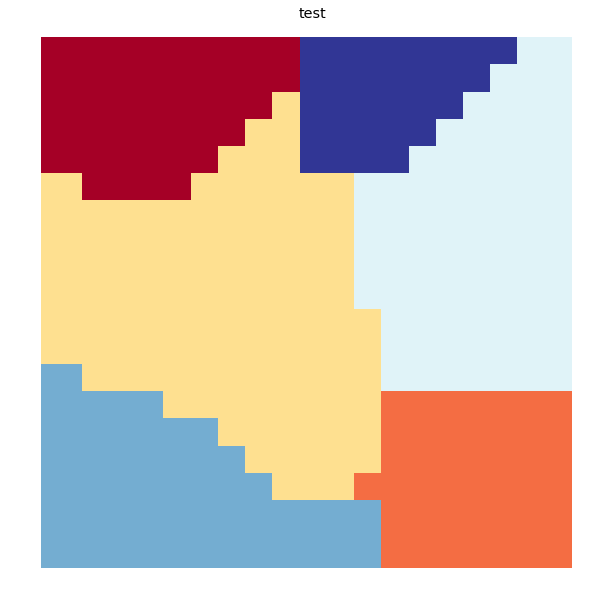

In [15]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

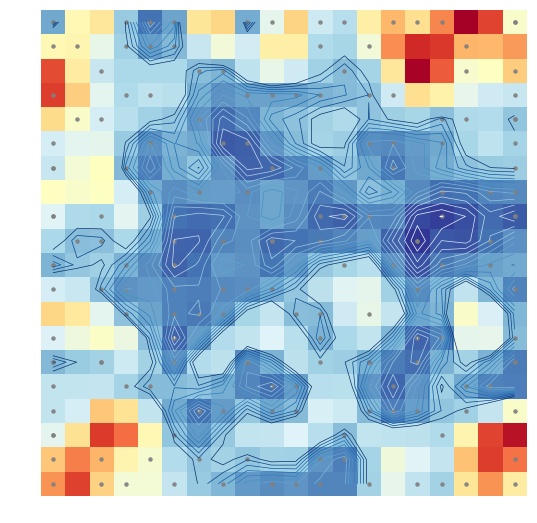

([], array([[0.31601062, 0.58722137, 0.63228445, 0.37567143, 0.23722694,
         0.30896848, 0.63626552, 0.66831912, 0.32194291, 0.50300777,
         0.67164391, 0.45771179, 0.42154082, 0.60864366, 0.71663057,
         0.6507339 , 0.78644347, 0.984196  , 0.87287989, 0.55016238],
        [0.58739839, 0.59345228, 0.51091666, 0.38852379, 0.30258267,
         0.34370008, 0.44914919, 0.53188862, 0.4680561 , 0.60869879,
         0.61048739, 0.41127455, 0.40023364, 0.53250755, 0.77545379,
         0.91085076, 0.88989994, 0.72117073, 0.71852563, 0.76021708],
        [0.86166291, 0.62123774, 0.44957606, 0.40459863, 0.40439755,
         0.40754403, 0.35276831, 0.33943804, 0.43492963, 0.5092551 ,
         0.45978228, 0.39006036, 0.35048074, 0.39537179, 0.63412938,
         0.97732682, 0.84000979, 0.5496867 , 0.5659341 , 0.68352738],
        [0.8826373 , 0.68231135, 0.50081742, 0.41341488, 0.43547534,
         0.42397332, 0.32789085, 0.2840893 , 0.30484098, 0.30620362,
         0.3101572 , 0.3331

In [16]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

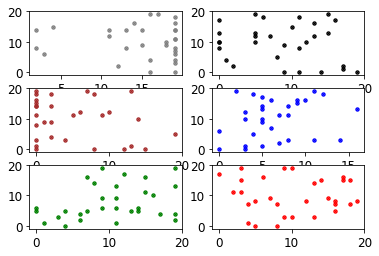

In [17]:
plot_data(som)

# Map Size 30x30

In [18]:
mapsize = [30,30]

### 500 Iterations 

In [19]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 6.054613054556888
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.024000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 500

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1 ---> elapsed time:  0.159000, quantization error: 1.133886

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 2 ---> elapsed time:  0.146000, quantization error: 1.026915

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 3 ---> elapsed time:  0.150000, quantization error: 0.974851

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 52 ---> elapsed time:  0.148000, quantization error: 0.856434

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 53 ---> elapsed time:  0.163000, quantization error: 0.855645

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 54 ---> elapsed time:  0.160000, quantization error: 0.854858

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.150000, quantization error: 0.854071

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 56 ---> elapsed time:  0.145000, quantization error: 0.853299

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 57 ---> elapsed time:  0.147000, quantization error: 0.852511

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch:

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 106 ---> elapsed time:  0.172000, quantization error: 0.807493

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 107 ---> elapsed time:  0.154000, quantization error: 0.806667

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 108 ---> elapsed time:  0.142000, quantization error: 0.805838

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 109 ---> elapsed time:  0.176000, quantization error: 0.804646

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 110 ---> elapsed time:  0.153000, quantization error: 0.803817

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 111 ---> elapsed time:  0.176000, quantization error: 0.802988

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 160 ---> elapsed time:  0.154000, quantization error: 0.757607

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.150000, quantization error: 0.756756

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.150000, quantization error: 0.755905

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 163 ---> elapsed time:  0.152000, quantization error: 0.755057

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 164 ---> elapsed time:  0.169000, quantization error: 0.754218

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 165 ---> elapsed time:  0.145000, quantization error: 0.753367

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 214 ---> elapsed time:  0.149000, quantization error: 0.694658

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.143000, quantization error: 0.692653

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 216 ---> elapsed time:  0.149000, quantization error: 0.690351

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 217 ---> elapsed time:  0.147000, quantization error: 0.688561

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 218 ---> elapsed time:  0.151000, quantization error: 0.686753

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 219 ---> elapsed time:  0.150000, quantization error: 0.685508

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.146000, quantization error: 0.624932

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 269 ---> elapsed time:  0.154000, quantization error: 0.623662

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 270 ---> elapsed time:  0.167000, quantization error: 0.621783

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 271 ---> elapsed time:  0.149000, quantization error: 0.620518

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 272 ---> elapsed time:  0.148000, quantization error: 0.619372

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 273 ---> elapsed time:  0.148000, quantization error: 0.618397

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 322 ---> elapsed time:  0.147000, quantization error: 0.555423

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 323 ---> elapsed time:  0.152000, quantization error: 0.552623

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 324 ---> elapsed time:  0.147000, quantization error: 0.550398

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 325 ---> elapsed time:  0.158000, quantization error: 0.549226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 326 ---> elapsed time:  0.148000, quantization error: 0.547641

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 327 ---> elapsed time:  0.142000, quantization error: 0.546090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 376 ---> elapsed time:  0.148000, quantization error: 0.473205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 377 ---> elapsed time:  0.155000, quantization error: 0.471398

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 378 ---> elapsed time:  0.147000, quantization error: 0.469997

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 379 ---> elapsed time:  0.161000, quantization error: 0.468261

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 380 ---> elapsed time:  0.146000, quantization error: 0.466444

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 381 ---> elapsed time:  0.145000, quantization error: 0.465018

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 430 ---> elapsed time:  0.146000, quantization error: 0.376212

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.185000, quantization error: 0.372670

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 432 ---> elapsed time:  0.151000, quantization error: 0.370462

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.143000, quantization error: 0.368455

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 434 ---> elapsed time:  0.145000, quantization error: 0.366590

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.180000, quantization error: 0.364082

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.149000, quantization error: 0.236651

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 485 ---> elapsed time:  0.149000, quantization error: 0.233442

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 486 ---> elapsed time:  0.150000, quantization error: 0.230118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.025000 seconds
 epoch: 487 ---> elapsed time:  0.204000, quantization error: 0.227528

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 488 ---> elapsed time:  0.186000, quantization error: 0.224113

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 489 ---> elapsed time:  0.161000, quantization error: 0.221107

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 epoch: 37 ---> elapsed time:  0.151000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 38 ---> elapsed time:  0.149000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 39 ---> elapsed time:  0.153000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 40 ---> elapsed time:  0.145000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 41 ---> elapsed time:  0.146000, quantization error: 0.184801

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 42 ---> elapsed time:  0.143000, quantization error: 0.184801

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 43 ---> elapsed time:  0.153000, quantization error: 0.184801

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.150000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 92 ---> elapsed time:  0.150000, quantization error: 0.184801

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 93 ---> elapsed time:  0.146000, quantization error: 0.184801

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 94 ---> elapsed time:  0.165000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 95 ---> elapsed time:  0.147000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 96 ---> elapsed time:  0.147000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 97 ---> elapsed time:  0.141000, quantization error: 0.184801

 find_bmu took: 0

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 145 ---> elapsed time:  0.157000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 146 ---> elapsed time:  0.153000, quantization error: 0.184801

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 147 ---> elapsed time:  0.161000, quantization error: 0.184801

 find_bmu took: 0.124000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 148 ---> elapsed time:  0.172000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 149 ---> elapsed time:  0.153000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 150 ---> elapsed time:  0.157000, quantization error: 0.184801

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 199 ---> elapsed time:  0.158000, quantization error: 0.184801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 200 ---> elapsed time:  0.146000, quantization error: 0.184801

 --------------------------------------------------------------
 Final quantization error: 0.184801
 train took: 111.144000 seconds


/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


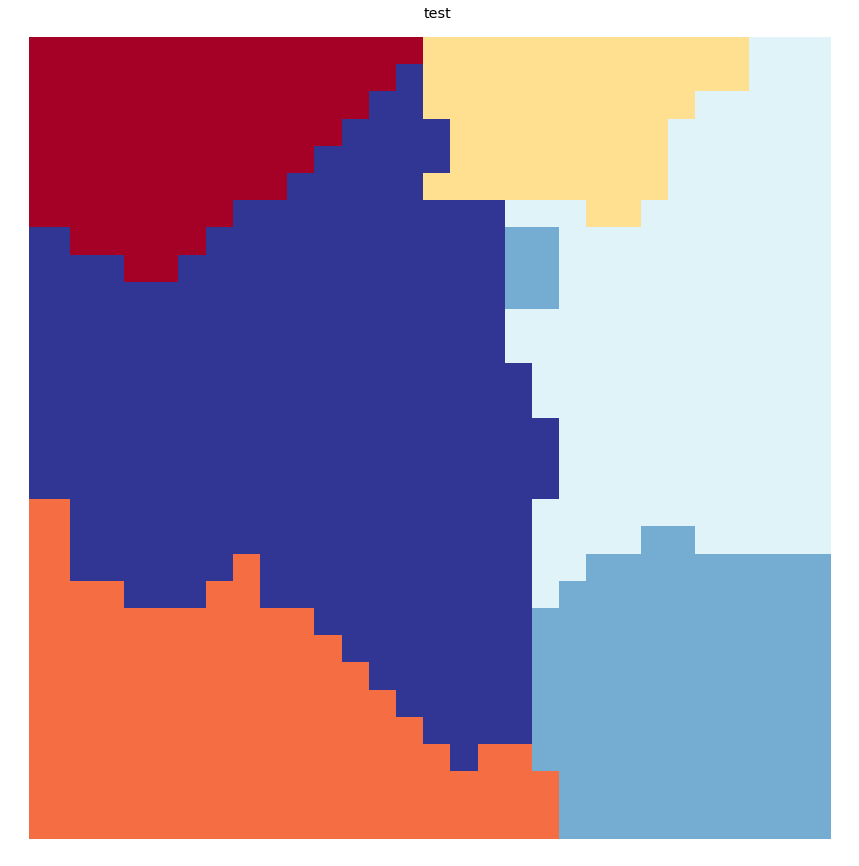

In [20]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

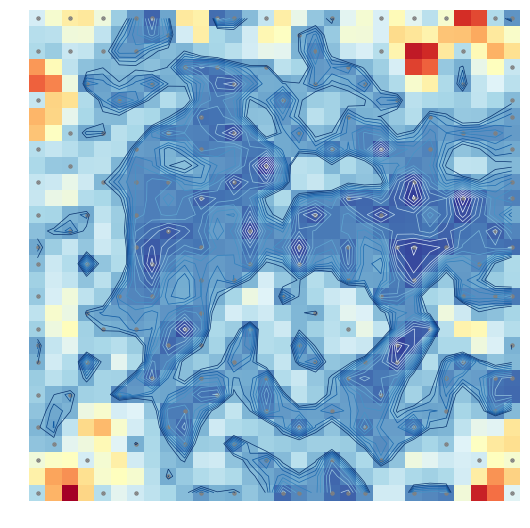

([], array([[0.48307916, 0.57646015, 0.6642457 , 0.68073403, 0.54872206,
         0.37069887, 0.25115546, 0.1605105 , 0.28097938, 0.67623145,
         0.65256542, 0.1770185 , 0.2247246 , 0.33102692, 0.44740624,
         0.6596053 , 0.53033472, 0.3553802 , 0.29017234, 0.51473379,
         0.57001566, 0.48757159, 0.61915129, 0.51220779, 0.42819773,
         0.57392352, 1.02685282, 0.98069773, 0.40865023, 0.24740804],
        [0.41876775, 0.42898906, 0.55673634, 0.55841668, 0.43841594,
         0.30198878, 0.23485544, 0.19080395, 0.24792462, 0.47694952,
         0.65930637, 0.3971179 , 0.35406005, 0.47384972, 0.6321932 ,
         0.60039107, 0.29820033, 0.25855305, 0.36475172, 0.56135087,
         0.55792627, 0.48810631, 0.71621382, 0.68932572, 0.64471848,
         0.76718043, 0.77186185, 0.81899529, 0.67579048, 0.5879252 ],
        [0.40320475, 0.36680966, 0.45670211, 0.44442347, 0.34346982,
         0.25451046, 0.25572264, 0.30403373, 0.32970094, 0.31256479,
         0.37152379, 0.39123

In [21]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

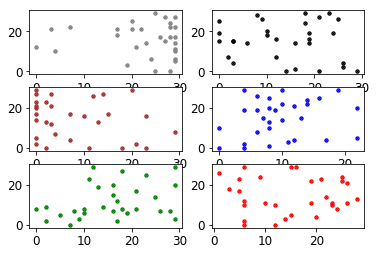

In [22]:
plot_data(som)

### 1000 Iterations 

In [23]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 6.054613054556888
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.020000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 1000

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1 ---> elapsed time:  0.148000, quantization error: 1.133886

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 2 ---> elapsed time:  0.148000, quantization error: 1.026915

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 3 ---> elapsed time:  0.145000, quantization error: 0.975158

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 52 ---> elapsed time:  0.144000, quantization error: 0.878709

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 53 ---> elapsed time:  0.160000, quantization error: 0.878338

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 54 ---> elapsed time:  0.157000, quantization error: 0.877967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.143000, quantization error: 0.877682

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 56 ---> elapsed time:  0.158000, quantization error: 0.877412

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 57 ---> elapsed time:  0.152000, quantization error: 0.876976

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch:

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 106 ---> elapsed time:  0.149000, quantization error: 0.857073

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 107 ---> elapsed time:  0.176000, quantization error: 0.856687

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 108 ---> elapsed time:  0.149000, quantization error: 0.856321

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 109 ---> elapsed time:  0.142000, quantization error: 0.855935

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 110 ---> elapsed time:  0.151000, quantization error: 0.855548

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 111 ---> elapsed time:  0.144000, quantization error: 0.855161

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 160 ---> elapsed time:  0.151000, quantization error: 0.833523

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.144000, quantization error: 0.833124

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 162 ---> elapsed time:  0.153000, quantization error: 0.832725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 163 ---> elapsed time:  0.155000, quantization error: 0.832327

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 164 ---> elapsed time:  0.150000, quantization error: 0.831929

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 165 ---> elapsed time:  0.155000, quantization error: 0.831531

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 214 ---> elapsed time:  0.146000, quantization error: 0.802283

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.142000, quantization error: 0.801863

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 216 ---> elapsed time:  0.156000, quantization error: 0.801444

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 217 ---> elapsed time:  0.152000, quantization error: 0.801025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 218 ---> elapsed time:  0.143000, quantization error: 0.800606

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 219 ---> elapsed time:  0.146000, quantization error: 0.799899

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.144000, quantization error: 0.778089

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 269 ---> elapsed time:  0.146000, quantization error: 0.777666

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 270 ---> elapsed time:  0.152000, quantization error: 0.777244

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 271 ---> elapsed time:  0.144000, quantization error: 0.776822

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 272 ---> elapsed time:  0.154000, quantization error: 0.776401

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 273 ---> elapsed time:  0.149000, quantization error: 0.775979

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.025000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 322 ---> elapsed time:  0.146000, quantization error: 0.753738

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 323 ---> elapsed time:  0.151000, quantization error: 0.753309

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 324 ---> elapsed time:  0.156000, quantization error: 0.752880

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 325 ---> elapsed time:  0.144000, quantization error: 0.752451

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 326 ---> elapsed time:  0.147000, quantization error: 0.752023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 327 ---> elapsed time:  0.145000, quantization error: 0.751596

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 376 ---> elapsed time:  0.153000, quantization error: 0.720977

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 377 ---> elapsed time:  0.149000, quantization error: 0.720511

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 378 ---> elapsed time:  0.154000, quantization error: 0.720045

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 379 ---> elapsed time:  0.165000, quantization error: 0.718867

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 380 ---> elapsed time:  0.153000, quantization error: 0.718151

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 381 ---> elapsed time:  0.149000, quantization error: 0.717164

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 430 ---> elapsed time:  0.157000, quantization error: 0.689989

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 431 ---> elapsed time:  0.145000, quantization error: 0.689499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 432 ---> elapsed time:  0.151000, quantization error: 0.689009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.144000, quantization error: 0.688520

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 434 ---> elapsed time:  0.152000, quantization error: 0.688032

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.153000, quantization error: 0.687544

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.178000, quantization error: 0.660876

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.164000, quantization error: 0.660371

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 486 ---> elapsed time:  0.151000, quantization error: 0.659866

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 487 ---> elapsed time:  0.147000, quantization error: 0.659192

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 488 ---> elapsed time:  0.139000, quantization error: 0.658685

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 489 ---> elapsed time:  0.145000, quantization error: 0.658126

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 538 ---> elapsed time:  0.153000, quantization error: 0.625307

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 539 ---> elapsed time:  0.145000, quantization error: 0.624813

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 540 ---> elapsed time:  0.150000, quantization error: 0.624290

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 541 ---> elapsed time:  0.146000, quantization error: 0.623755

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 542 ---> elapsed time:  0.149000, quantization error: 0.623131

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 543 ---> elapsed time:  0.144000, quantization error: 0.622595

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 592 ---> elapsed time:  0.158000, quantization error: 0.593917

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 593 ---> elapsed time:  0.143000, quantization error: 0.593374

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 594 ---> elapsed time:  0.154000, quantization error: 0.592831

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 595 ---> elapsed time:  0.159000, quantization error: 0.592288

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 596 ---> elapsed time:  0.145000, quantization error: 0.591746

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 597 ---> elapsed time:  0.148000, quantization error: 0.591205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 646 ---> elapsed time:  0.152000, quantization error: 0.560342

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 647 ---> elapsed time:  0.141000, quantization error: 0.559764

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 648 ---> elapsed time:  0.156000, quantization error: 0.559186

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 649 ---> elapsed time:  0.143000, quantization error: 0.558609

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 650 ---> elapsed time:  0.150000, quantization error: 0.558033

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 651 ---> elapsed time:  0.147000, quantization error: 0.557457

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 700 ---> elapsed time:  0.170000, quantization error: 0.521884

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 701 ---> elapsed time:  0.155000, quantization error: 0.521259

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 702 ---> elapsed time:  0.150000, quantization error: 0.520633

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 703 ---> elapsed time:  0.144000, quantization error: 0.520008

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 704 ---> elapsed time:  0.148000, quantization error: 0.519161

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 705 ---> elapsed time:  0.146000, quantization error: 0.518132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 754 ---> elapsed time:  0.163000, quantization error: 0.479136

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 755 ---> elapsed time:  0.156000, quantization error: 0.477699

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 756 ---> elapsed time:  0.152000, quantization error: 0.477272

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 757 ---> elapsed time:  0.158000, quantization error: 0.476605

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 758 ---> elapsed time:  0.143000, quantization error: 0.475935

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 759 ---> elapsed time:  0.146000, quantization error: 0.473716

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 808 ---> elapsed time:  0.156000, quantization error: 0.429539

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 809 ---> elapsed time:  0.154000, quantization error: 0.428731

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 810 ---> elapsed time:  0.149000, quantization error: 0.427923

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 811 ---> elapsed time:  0.153000, quantization error: 0.427116

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 812 ---> elapsed time:  0.147000, quantization error: 0.426307

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 813 ---> elapsed time:  0.143000, quantization error: 0.425499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 862 ---> elapsed time:  0.147000, quantization error: 0.377243

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 863 ---> elapsed time:  0.149000, quantization error: 0.376314

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 864 ---> elapsed time:  0.149000, quantization error: 0.375383

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 865 ---> elapsed time:  0.145000, quantization error: 0.374451

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 866 ---> elapsed time:  0.146000, quantization error: 0.373519

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 867 ---> elapsed time:  0.144000, quantization error: 0.372585

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 916 ---> elapsed time:  0.145000, quantization error: 0.312909

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 917 ---> elapsed time:  0.166000, quantization error: 0.311068

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 918 ---> elapsed time:  0.156000, quantization error: 0.309949

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 919 ---> elapsed time:  0.147000, quantization error: 0.308830

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 920 ---> elapsed time:  0.146000, quantization error: 0.307709

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 921 ---> elapsed time:  0.149000, quantization error: 0.306587

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 970 ---> elapsed time:  0.141000, quantization error: 0.232731

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 971 ---> elapsed time:  0.145000, quantization error: 0.231382

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 972 ---> elapsed time:  0.145000, quantization error: 0.230030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 973 ---> elapsed time:  0.145000, quantization error: 0.228137

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 974 ---> elapsed time:  0.147000, quantization error: 0.226777

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 975 ---> elapsed time:  0.151000, quantization error: 0.225417

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 update_codebook_voronoi took: 0.007000 seconds
 epoch: 23 ---> elapsed time:  0.144000, quantization error: 0.188046

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 24 ---> elapsed time:  0.169000, quantization error: 0.188046

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 25 ---> elapsed time:  0.213000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 26 ---> elapsed time:  0.155000, quantization error: 0.188046

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 27 ---> elapsed time:  0.148000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 28 ---> elapsed time:  0.153000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 29 ---> elapsed time:  0.145000,

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 77 ---> elapsed time:  0.165000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 78 ---> elapsed time:  0.149000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 79 ---> elapsed time:  0.151000, quantization error: 0.188046

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 80 ---> elapsed time:  0.145000, quantization error: 0.188046

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 81 ---> elapsed time:  0.148000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 82 ---> elapsed time:  0.148000, quantization error: 0.188046

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 83 ---> elapsed time:  0.152000,

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 131 ---> elapsed time:  0.145000, quantization error: 0.188046

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 132 ---> elapsed time:  0.157000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 133 ---> elapsed time:  0.176000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 134 ---> elapsed time:  0.148000, quantization error: 0.188046

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 135 ---> elapsed time:  0.191000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 136 ---> elapsed time:  0.155000, quantization error: 0.188046

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 185 ---> elapsed time:  0.151000, quantization error: 0.188046

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 186 ---> elapsed time:  0.158000, quantization error: 0.188046

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 187 ---> elapsed time:  0.157000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 188 ---> elapsed time:  0.154000, quantization error: 0.188046

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 189 ---> elapsed time:  0.163000, quantization error: 0.188046

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 190 ---> elapsed time:  0.147000, quantization error: 0.188046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


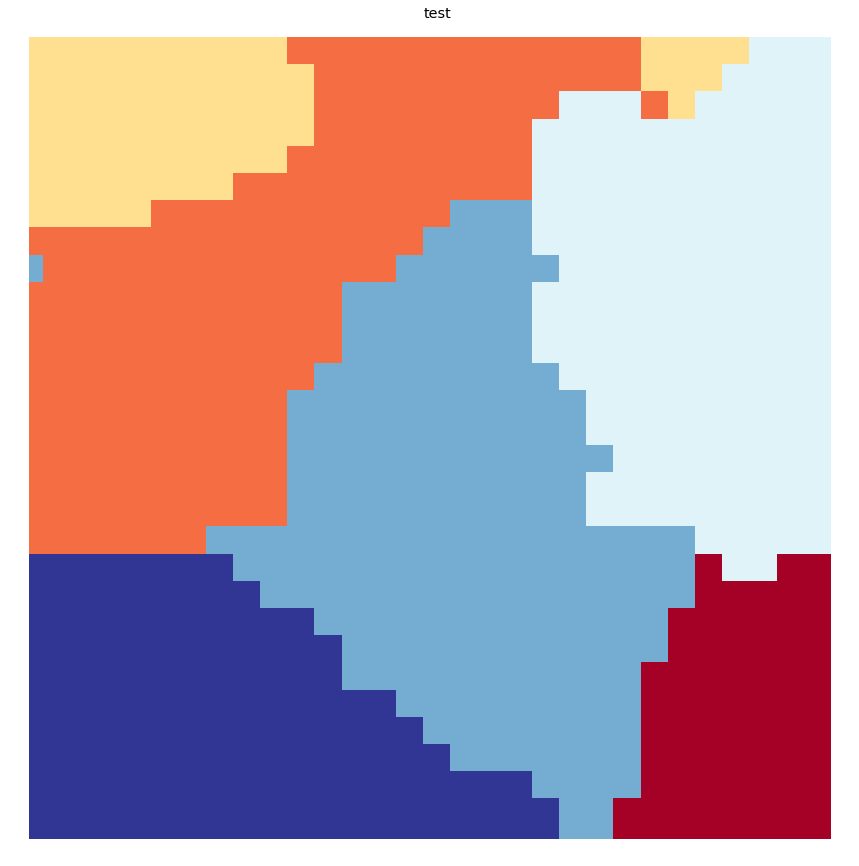

In [24]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

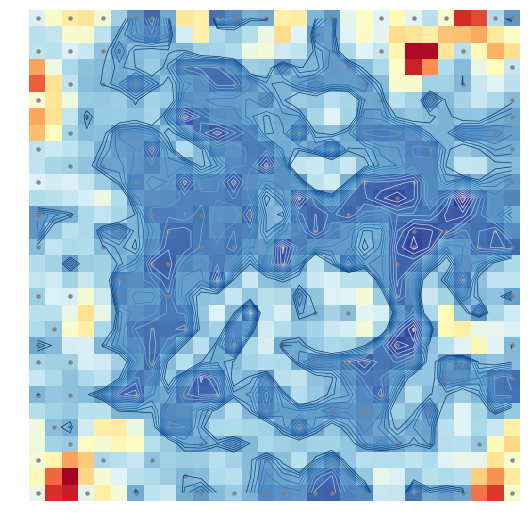

([], array([[0.48354817, 0.57823974, 0.67008197, 0.69181401, 0.55406493,
         0.36868031, 0.24330276, 0.16083096, 0.28483606, 0.67687766,
         0.65214142, 0.17675139, 0.22053944, 0.29748461, 0.28307042,
         0.65838686, 0.6647638 , 0.31043498, 0.24403403, 0.51855192,
         0.58716756, 0.49660314, 0.61949416, 0.51226307, 0.42851237,
         0.57404978, 1.0268718 , 0.98069848, 0.40865008, 0.24740804],
        [0.42203965, 0.44336844, 0.57722998, 0.57333968, 0.42992086,
         0.295262  , 0.25160361, 0.19945649, 0.25451811, 0.47844641,
         0.65893583, 0.39868975, 0.3540304 , 0.41245369, 0.53279049,
         0.71007412, 0.49908751, 0.24030023, 0.26139239, 0.49535546,
         0.58252156, 0.51207099, 0.71677546, 0.69126964, 0.65892728,
         0.76941533, 0.77208581, 0.81899275, 0.67579076, 0.5879252 ],
        [0.42995475, 0.42400669, 0.49046452, 0.45117248, 0.33760644,
         0.25831854, 0.32258634, 0.33625676, 0.3198553 , 0.30730997,
         0.36992183, 0.38219

In [25]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

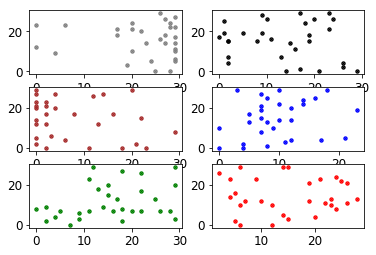

In [26]:
plot_data(som)

### 2000 Iterations 

In [27]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 6.054613054556888
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.041000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 2000

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1 ---> elapsed time:  0.165000, quantization error: 1.133886

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 2 ---> elapsed time:  0.149000, quantization error: 1.026915

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 3 ---> elapsed time:  0.172000, quantization error: 0.975311

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 52 ---> elapsed time:  0.144000, quantization error: 0.891312

 find_bmu took: 0.121000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 53 ---> elapsed time:  0.188000, quantization error: 0.891131

 find_bmu took: 0.114000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 54 ---> elapsed time:  0.195000, quantization error: 0.890950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.147000, quantization error: 0.890769

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 56 ---> elapsed time:  0.150000, quantization error: 0.890588

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 57 ---> elapsed time:  0.175000, quantization error: 0.890407

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 106 ---> elapsed time:  0.151000, quantization error: 0.880931

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 107 ---> elapsed time:  0.154000, quantization error: 0.880516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 108 ---> elapsed time:  0.151000, quantization error: 0.880337

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 109 ---> elapsed time:  0.151000, quantization error: 0.880157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 110 ---> elapsed time:  0.140000, quantization error: 0.879978

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 111 ---> elapsed time:  0.149000, quantization error: 0.879798

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 160 ---> elapsed time:  0.164000, quantization error: 0.870392

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 161 ---> elapsed time:  0.152000, quantization error: 0.870211

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.142000, quantization error: 0.870030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 163 ---> elapsed time:  0.161000, quantization error: 0.869486

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 164 ---> elapsed time:  0.158000, quantization error: 0.869304

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 165 ---> elapsed time:  0.151000, quantization error: 0.869123

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 214 ---> elapsed time:  0.151000, quantization error: 0.859117

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.144000, quantization error: 0.858932

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 216 ---> elapsed time:  0.148000, quantization error: 0.858747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 217 ---> elapsed time:  0.150000, quantization error: 0.858563

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 218 ---> elapsed time:  0.145000, quantization error: 0.858377

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 219 ---> elapsed time:  0.145000, quantization error: 0.857587

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 268 ---> elapsed time:  0.158000, quantization error: 0.847476

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 269 ---> elapsed time:  0.155000, quantization error: 0.847286

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 270 ---> elapsed time:  0.150000, quantization error: 0.847097

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 271 ---> elapsed time:  0.152000, quantization error: 0.846908

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 272 ---> elapsed time:  0.154000, quantization error: 0.846719

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 273 ---> elapsed time:  0.151000, quantization error: 0.846530

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 322 ---> elapsed time:  0.157000, quantization error: 0.834593

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 323 ---> elapsed time:  0.156000, quantization error: 0.834400

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 324 ---> elapsed time:  0.148000, quantization error: 0.834208

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 325 ---> elapsed time:  0.151000, quantization error: 0.834015

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 326 ---> elapsed time:  0.146000, quantization error: 0.833822

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 327 ---> elapsed time:  0.146000, quantization error: 0.833605

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 376 ---> elapsed time:  0.151000, quantization error: 0.823402

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 377 ---> elapsed time:  0.146000, quantization error: 0.822334

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 378 ---> elapsed time:  0.143000, quantization error: 0.821660

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 379 ---> elapsed time:  0.144000, quantization error: 0.821456

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 380 ---> elapsed time:  0.146000, quantization error: 0.821251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 381 ---> elapsed time:  0.146000, quantization error: 0.821047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 430 ---> elapsed time:  0.150000, quantization error: 0.807457

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.142000, quantization error: 0.806964

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 432 ---> elapsed time:  0.148000, quantization error: 0.806178

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.141000, quantization error: 0.805865

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 434 ---> elapsed time:  0.156000, quantization error: 0.805655

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.146000, quantization error: 0.805445

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.141000, quantization error: 0.793556

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 485 ---> elapsed time:  0.144000, quantization error: 0.793345

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 486 ---> elapsed time:  0.144000, quantization error: 0.793135

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 487 ---> elapsed time:  0.145000, quantization error: 0.792925

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 488 ---> elapsed time:  0.144000, quantization error: 0.792714

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 489 ---> elapsed time:  0.140000, quantization error: 0.792504

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 538 ---> elapsed time:  0.145000, quantization error: 0.781601

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 539 ---> elapsed time:  0.145000, quantization error: 0.781389

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 540 ---> elapsed time:  0.147000, quantization error: 0.781178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 541 ---> elapsed time:  0.141000, quantization error: 0.780967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 542 ---> elapsed time:  0.142000, quantization error: 0.780756

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 543 ---> elapsed time:  0.145000, quantization error: 0.780544

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 592 ---> elapsed time:  0.147000, quantization error: 0.768765

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 593 ---> elapsed time:  0.145000, quantization error: 0.768548

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 594 ---> elapsed time:  0.145000, quantization error: 0.768331

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 595 ---> elapsed time:  0.145000, quantization error: 0.768114

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 596 ---> elapsed time:  0.148000, quantization error: 0.767897

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 597 ---> elapsed time:  0.144000, quantization error: 0.767680

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 646 ---> elapsed time:  0.148000, quantization error: 0.756399

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 647 ---> elapsed time:  0.145000, quantization error: 0.756178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 648 ---> elapsed time:  0.145000, quantization error: 0.755405

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 649 ---> elapsed time:  0.144000, quantization error: 0.755183

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 650 ---> elapsed time:  0.143000, quantization error: 0.754961

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 651 ---> elapsed time:  0.143000, quantization error: 0.754776

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 700 ---> elapsed time:  0.145000, quantization error: 0.739000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 701 ---> elapsed time:  0.143000, quantization error: 0.738769

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 702 ---> elapsed time:  0.144000, quantization error: 0.738539

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 703 ---> elapsed time:  0.145000, quantization error: 0.738308

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 704 ---> elapsed time:  0.166000, quantization error: 0.738078

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 705 ---> elapsed time:  0.150000, quantization error: 0.737847

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 754 ---> elapsed time:  0.145000, quantization error: 0.725004

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 755 ---> elapsed time:  0.146000, quantization error: 0.724769

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 756 ---> elapsed time:  0.147000, quantization error: 0.724535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 757 ---> elapsed time:  0.147000, quantization error: 0.724300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 758 ---> elapsed time:  0.143000, quantization error: 0.724065

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 759 ---> elapsed time:  0.148000, quantization error: 0.723830

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.116000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 808 ---> elapsed time:  0.177000, quantization error: 0.712348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 809 ---> elapsed time:  0.154000, quantization error: 0.712106

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 810 ---> elapsed time:  0.149000, quantization error: 0.711863

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 811 ---> elapsed time:  0.142000, quantization error: 0.711165

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 812 ---> elapsed time:  0.147000, quantization error: 0.710516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 813 ---> elapsed time:  0.145000, quantization error: 0.710272

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 862 ---> elapsed time:  0.140000, quantization error: 0.697283

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 863 ---> elapsed time:  0.158000, quantization error: 0.697034

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 864 ---> elapsed time:  0.148000, quantization error: 0.696786

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 865 ---> elapsed time:  0.143000, quantization error: 0.696537

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 866 ---> elapsed time:  0.144000, quantization error: 0.696288

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 867 ---> elapsed time:  0.144000, quantization error: 0.696040

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 916 ---> elapsed time:  0.145000, quantization error: 0.679975

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 917 ---> elapsed time:  0.143000, quantization error: 0.679723

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 918 ---> elapsed time:  0.143000, quantization error: 0.679471

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 919 ---> elapsed time:  0.143000, quantization error: 0.679219

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 920 ---> elapsed time:  0.146000, quantization error: 0.678967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 921 ---> elapsed time:  0.143000, quantization error: 0.678715

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 970 ---> elapsed time:  0.144000, quantization error: 0.663948

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 971 ---> elapsed time:  0.143000, quantization error: 0.663691

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 972 ---> elapsed time:  0.151000, quantization error: 0.663434

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 973 ---> elapsed time:  0.145000, quantization error: 0.663177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 974 ---> elapsed time:  0.142000, quantization error: 0.662921

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 975 ---> elapsed time:  0.149000, quantization error: 0.662664

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 epoch: 1023 ---> elapsed time:  0.145000, quantization error: 0.647073

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1024 ---> elapsed time:  0.146000, quantization error: 0.646623

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1025 ---> elapsed time:  0.142000, quantization error: 0.646319

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1026 ---> elapsed time:  0.144000, quantization error: 0.646018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1027 ---> elapsed time:  0.140000, quantization error: 0.645465

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1028 ---> elapsed time:  0.144000, quantization error: 0.645195

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1029 ---> elapsed time:  0.145000, quantization error: 0.644925

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1077 ---> elapsed time:  0.145000, quantization error: 0.629285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1078 ---> elapsed time:  0.141000, quantization error: 0.628339

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1079 ---> elapsed time:  0.143000, quantization error: 0.628577

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1080 ---> elapsed time:  0.150000, quantization error: 0.628296

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1081 ---> elapsed time:  0.145000, quantization error: 0.627783

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1082 ---> elapsed time:  0.144000, quantization error: 0.627439

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1130 ---> elapsed time:  0.143000, quantization error: 0.612132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1131 ---> elapsed time:  0.146000, quantization error: 0.611844

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1132 ---> elapsed time:  0.147000, quantization error: 0.611556

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1133 ---> elapsed time:  0.148000, quantization error: 0.611268

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1134 ---> elapsed time:  0.144000, quantization error: 0.610980

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1135 ---> elapsed time:  0.145000, quantization error: 0.610692

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.146000, quantization error: 0.594313

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1184 ---> elapsed time:  0.148000, quantization error: 0.594015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1185 ---> elapsed time:  0.145000, quantization error: 0.593717

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1186 ---> elapsed time:  0.144000, quantization error: 0.593420

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1187 ---> elapsed time:  0.145000, quantization error: 0.593122

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1188 ---> elapsed time:  0.149000, quantization error: 0.592825

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1189 ---> elapsed time:  0.145000, quantization error: 0.592528

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1237 ---> elapsed time:  0.144000, quantization error: 0.576750

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1238 ---> elapsed time:  0.145000, quantization error: 0.576495

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1239 ---> elapsed time:  0.145000, quantization error: 0.576191

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1240 ---> elapsed time:  0.144000, quantization error: 0.575887

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1241 ---> elapsed time:  0.146000, quantization error: 0.575583

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1242 ---> elapsed time:  0.146000, quantization error: 0.575279

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1290 ---> elapsed time:  0.143000, quantization error: 0.558580

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1291 ---> elapsed time:  0.145000, quantization error: 0.558270

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1292 ---> elapsed time:  0.148000, quantization error: 0.557960

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1293 ---> elapsed time:  0.145000, quantization error: 0.557650

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1294 ---> elapsed time:  0.144000, quantization error: 0.557341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1295 ---> elapsed time:  0.145000, quantization error: 0.557031

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.143000, quantization error: 0.537608

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1344 ---> elapsed time:  0.167000, quantization error: 0.537290

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1345 ---> elapsed time:  0.145000, quantization error: 0.536860

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1346 ---> elapsed time:  0.142000, quantization error: 0.536541

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1347 ---> elapsed time:  0.148000, quantization error: 0.536222

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1348 ---> elapsed time:  0.146000, quantization error: 0.535903

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1349 ---> elapsed time:  0.157000, quantization error: 0.535585

 fi

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 1397 ---> elapsed time:  0.162000, quantization error: 0.516421

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1398 ---> elapsed time:  0.142000, quantization error: 0.516084

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1399 ---> elapsed time:  0.144000, quantization error: 0.515747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1400 ---> elapsed time:  0.147000, quantization error: 0.515409

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1401 ---> elapsed time:  0.144000, quantization error: 0.515072

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1402 ---> elapsed time:  0.144000, quantization error: 0.514735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1450 ---> elapsed time:  0.145000, quantization error: 0.497548

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1451 ---> elapsed time:  0.145000, quantization error: 0.497198

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1452 ---> elapsed time:  0.145000, quantization error: 0.496849

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1453 ---> elapsed time:  0.140000, quantization error: 0.496499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 1454 ---> elapsed time:  0.154000, quantization error: 0.496150

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1455 ---> elapsed time:  0.153000, quantization error: 0.495800

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.146000, quantization error: 0.474906

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1504 ---> elapsed time:  0.147000, quantization error: 0.474515

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1505 ---> elapsed time:  0.145000, quantization error: 0.474124

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1506 ---> elapsed time:  0.147000, quantization error: 0.473733

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1507 ---> elapsed time:  0.141000, quantization error: 0.473342

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1508 ---> elapsed time:  0.154000, quantization error: 0.472951

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1509 ---> elapsed time:  0.222000, quantization error: 0.472559

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1557 ---> elapsed time:  0.144000, quantization error: 0.451839

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1558 ---> elapsed time:  0.142000, quantization error: 0.451432

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1559 ---> elapsed time:  0.143000, quantization error: 0.451025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1560 ---> elapsed time:  0.145000, quantization error: 0.450617

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1561 ---> elapsed time:  0.143000, quantization error: 0.450210

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1562 ---> elapsed time:  0.143000, quantization error: 0.449802

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1610 ---> elapsed time:  0.145000, quantization error: 0.427306

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1611 ---> elapsed time:  0.147000, quantization error: 0.426862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1612 ---> elapsed time:  0.145000, quantization error: 0.426418

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1613 ---> elapsed time:  0.143000, quantization error: 0.425974

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1614 ---> elapsed time:  0.142000, quantization error: 0.425529

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1615 ---> elapsed time:  0.150000, quantization error: 0.425084

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.143000, quantization error: 0.403031

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1664 ---> elapsed time:  0.156000, quantization error: 0.401266

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1665 ---> elapsed time:  0.145000, quantization error: 0.400384

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1666 ---> elapsed time:  0.145000, quantization error: 0.399209

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1667 ---> elapsed time:  0.146000, quantization error: 0.398749

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1668 ---> elapsed time:  0.146000, quantization error: 0.398288

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1669 ---> elapsed time:  0.145000, quantization error: 0.397826

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1717 ---> elapsed time:  0.153000, quantization error: 0.373234

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1718 ---> elapsed time:  0.153000, quantization error: 0.372140

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1719 ---> elapsed time:  0.153000, quantization error: 0.371039

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1720 ---> elapsed time:  0.145000, quantization error: 0.370551

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1721 ---> elapsed time:  0.145000, quantization error: 0.370063

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1722 ---> elapsed time:  0.176000, quantization error: 0.369575

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1770 ---> elapsed time:  0.148000, quantization error: 0.344394

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1771 ---> elapsed time:  0.145000, quantization error: 0.343876

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1772 ---> elapsed time:  0.147000, quantization error: 0.343357

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1773 ---> elapsed time:  0.144000, quantization error: 0.342838

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1774 ---> elapsed time:  0.145000, quantization error: 0.342318

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1775 ---> elapsed time:  0.144000, quantization error: 0.341799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.158000, quantization error: 0.314277

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1824 ---> elapsed time:  0.152000, quantization error: 0.313730

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 1825 ---> elapsed time:  0.149000, quantization error: 0.313183

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1826 ---> elapsed time:  0.142000, quantization error: 0.312635

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1827 ---> elapsed time:  0.147000, quantization error: 0.312087

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1828 ---> elapsed time:  0.147000, quantization error: 0.311539

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1829 ---> elapsed time:  0.145000, quantization error: 0.310990

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1877 ---> elapsed time:  0.143000, quantization error: 0.278006

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1878 ---> elapsed time:  0.142000, quantization error: 0.277410

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1879 ---> elapsed time:  0.142000, quantization error: 0.276814

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1880 ---> elapsed time:  0.146000, quantization error: 0.276217

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1881 ---> elapsed time:  0.143000, quantization error: 0.275620

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1882 ---> elapsed time:  0.141000, quantization error: 0.275023

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1930 ---> elapsed time:  0.144000, quantization error: 0.241762

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1931 ---> elapsed time:  0.143000, quantization error: 0.241119

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1932 ---> elapsed time:  0.146000, quantization error: 0.240475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1933 ---> elapsed time:  0.143000, quantization error: 0.239831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1934 ---> elapsed time:  0.142000, quantization error: 0.239082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1935 ---> elapsed time:  0.145000, quantization error: 0.238436

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.145000, quantization error: 0.204507

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 1984 ---> elapsed time:  0.152000, quantization error: 0.203839

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1985 ---> elapsed time:  0.150000, quantization error: 0.203171

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1986 ---> elapsed time:  0.146000, quantization error: 0.202503

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1987 ---> elapsed time:  0.151000, quantization error: 0.201835

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1988 ---> elapsed time:  0.151000, quantization error: 0.201167

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1989 ---> elapsed time:  0.141000, quantization error: 0.200499

 fi

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 37 ---> elapsed time:  0.165000, quantization error: 0.191983

 find_bmu took: 0.121000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 38 ---> elapsed time:  0.196000, quantization error: 0.191983

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 39 ---> elapsed time:  0.157000, quantization error: 0.191983

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 40 ---> elapsed time:  0.181000, quantization error: 0.191983

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 41 ---> elapsed time:  0.174000, quantization error: 0.191983

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 42 ---> elapsed time:  0.171000, quantization error: 0.191983

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 91 ---> elapsed time:  0.157000, quantization error: 0.191983

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 92 ---> elapsed time:  0.179000, quantization error: 0.191983

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 93 ---> elapsed time:  0.175000, quantization error: 0.191983

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 94 ---> elapsed time:  0.167000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 95 ---> elapsed time:  0.145000, quantization error: 0.191983

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 96 ---> elapsed time:  0.166000, quantization error: 0.191983

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 145 ---> elapsed time:  0.160000, quantization error: 0.191983

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 146 ---> elapsed time:  0.197000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 147 ---> elapsed time:  0.168000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 148 ---> elapsed time:  0.160000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 149 ---> elapsed time:  0.182000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 150 ---> elapsed time:  0.217000, quantization error: 0.191983

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.023000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 199 ---> elapsed time:  0.159000, quantization error: 0.191983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 200 ---> elapsed time:  0.162000, quantization error: 0.191983

 --------------------------------------------------------------
 Final quantization error: 0.191983
 train took: 341.311000 seconds


/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


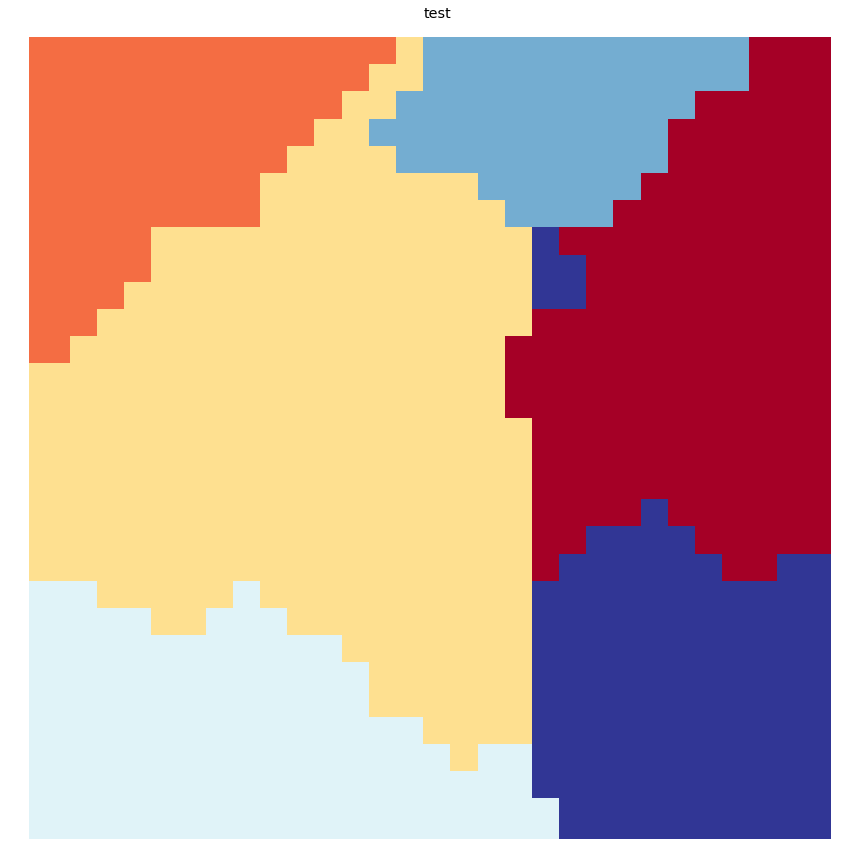

In [28]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

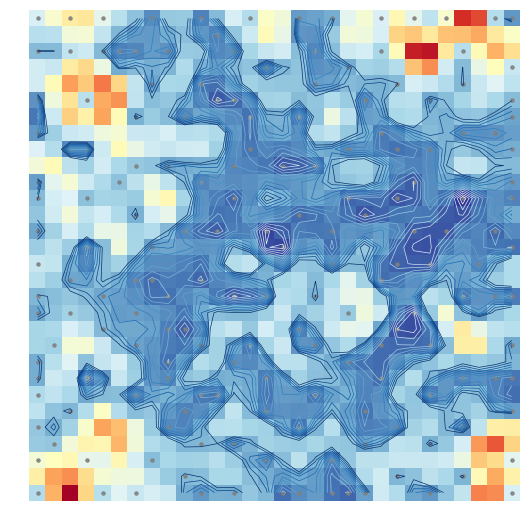

([], array([[0.48290695, 0.57595724, 0.66425394, 0.68041627, 0.51807855,
         0.4168652 , 0.33667963, 0.22327106, 0.35410555, 0.35469135,
         0.20619155, 0.31895741, 0.48016279, 0.40654419, 0.58741989,
         0.55037634, 0.25361555, 0.26473327, 0.28890047, 0.51307927,
         0.56746361, 0.48747713, 0.62247385, 0.51740419, 0.42960355,
         0.57409967, 1.02687124, 0.98069848, 0.40865008, 0.24740804],
        [0.41482157, 0.42459684, 0.55406701, 0.5633944 , 0.43908692,
         0.31312048, 0.25338491, 0.24830849, 0.29016652, 0.33262479,
         0.24533958, 0.20243397, 0.34380061, 0.45999348, 0.61282642,
         0.53056748, 0.2432113 , 0.23535893, 0.35465204, 0.55527282,
         0.5455879 , 0.48400804, 0.73152314, 0.76129766, 0.67311504,
         0.76915431, 0.7720508 , 0.81899243, 0.67579076, 0.5879252 ],
        [0.31966695, 0.3197583 , 0.44076001, 0.46037148, 0.31479666,
         0.2019456 , 0.21374035, 0.25484663, 0.23731816, 0.35568927,
         0.3529417 , 0.21572

In [29]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

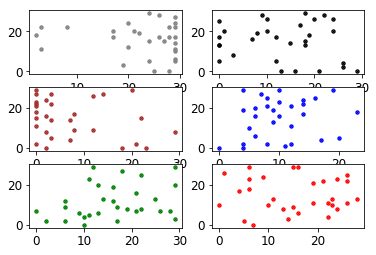

In [30]:
plot_data(som)

# Map Size 50x50

In [31]:
mapsize = [50,50]

### 500 Iterations 

In [32]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.498310553789601
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.054000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1 ---> elapsed time:  0.324000, quantization error: 1.130475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 2 ---> elapsed time:  0.335000, quantization error: 1.036799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 3 ---> elapsed time:  0.350000, quantization error: 0.991311

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 52 ---> elapsed time:  0.323000, quantization error: 0.871259

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 epoch: 53 ---> elapsed time:  0.340000, quantization error: 0.870126

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 54 ---> elapsed time:  0.339000, quantization error: 0.868916

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 55 ---> elapsed time:  0.318000, quantization error: 0.868047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 56 ---> elapsed time:  0.320000, quantization error: 0.867262

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.057000 seconds
 epoch: 57 ---> elapsed time:  0.348000, quantization error: 0.866480

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 106 ---> elapsed time:  0.332000, quantization error: 0.820001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.051000 seconds
 epoch: 107 ---> elapsed time:  0.346000, quantization error: 0.819081

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 108 ---> elapsed time:  0.318000, quantization error: 0.818228

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 epoch: 109 ---> elapsed time:  0.366000, quantization error: 0.817511

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 110 ---> elapsed time:  0.323000, quantization error: 0.816638

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 111 ---> elapsed time:  0.318000, quantization error: 0.815781

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.059000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 160 ---> elapsed time:  0.332000, quantization error: 0.765446

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 161 ---> elapsed time:  0.336000, quantization error: 0.764103

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 162 ---> elapsed time:  0.341000, quantization error: 0.762760

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 163 ---> elapsed time:  0.324000, quantization error: 0.761467

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.057000 seconds
 epoch: 164 ---> elapsed time:  0.349000, quantization error: 0.760477

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 165 ---> elapsed time:  0.351000, quantization error: 0.759355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 214 ---> elapsed time:  0.348000, quantization error: 0.701512

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 215 ---> elapsed time:  0.328000, quantization error: 0.699719

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.049000 seconds
 epoch: 216 ---> elapsed time:  0.347000, quantization error: 0.698336

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 217 ---> elapsed time:  0.348000, quantization error: 0.696966

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 218 ---> elapsed time:  0.326000, quantization error: 0.696001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 219 ---> elapsed time:  0.336000, quantization error: 0.694671

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 268 ---> elapsed time:  0.349000, quantization error: 0.634040

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 269 ---> elapsed time:  0.331000, quantization error: 0.632868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.056000 seconds
 epoch: 270 ---> elapsed time:  0.348000, quantization error: 0.631558

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 271 ---> elapsed time:  0.375000, quantization error: 0.630065

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 272 ---> elapsed time:  0.332000, quantization error: 0.628813

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 273 ---> elapsed time:  0.330000, quantization error: 0.627734

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.056000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 322 ---> elapsed time:  0.336000, quantization error: 0.562265

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 323 ---> elapsed time:  0.326000, quantization error: 0.561032

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 324 ---> elapsed time:  0.343000, quantization error: 0.559792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 325 ---> elapsed time:  0.338000, quantization error: 0.558445

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 326 ---> elapsed time:  0.332000, quantization error: 0.557119

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 327 ---> elapsed time:  0.321000, quantization error: 0.555894

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 376 ---> elapsed time:  0.348000, quantization error: 0.476633

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.069000 seconds
 epoch: 377 ---> elapsed time:  0.356000, quantization error: 0.474514

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 378 ---> elapsed time:  0.335000, quantization error: 0.472335

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.048000 seconds
 epoch: 379 ---> elapsed time:  0.345000, quantization error: 0.470518

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.048000 seconds
 epoch: 380 ---> elapsed time:  0.366000, quantization error: 0.468987

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 381 ---> elapsed time:  0.372000, quantization error: 0.467456

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 430 ---> elapsed time:  0.344000, quantization error: 0.372202

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 epoch: 431 ---> elapsed time:  0.344000, quantization error: 0.369661

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 432 ---> elapsed time:  0.356000, quantization error: 0.367032

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 433 ---> elapsed time:  0.327000, quantization error: 0.363542

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 epoch: 434 ---> elapsed time:  0.343000, quantization error: 0.361058

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.051000 seconds
 epoch: 435 ---> elapsed time:  0.357000, quantization error: 0.358679

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 484 ---> elapsed time:  0.333000, quantization error: 0.222596

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.052000 seconds
 epoch: 485 ---> elapsed time:  0.348000, quantization error: 0.219697

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.056000 seconds
 epoch: 486 ---> elapsed time:  0.369000, quantization error: 0.216606

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.055000 seconds
 epoch: 487 ---> elapsed time:  0.366000, quantization error: 0.213460

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 488 ---> elapsed time:  0.319000, quantization error: 0.210248

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 489 ---> elapsed time:  0.345000, quantization error: 0.207226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 epoch: 37 ---> elapsed time:  0.320000, quantization error: 0.150567

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 38 ---> elapsed time:  0.340000, quantization error: 0.150174

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 39 ---> elapsed time:  0.326000, quantization error: 0.149781

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.059000 seconds
 epoch: 40 ---> elapsed time:  0.358000, quantization error: 0.149304

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 41 ---> elapsed time:  0.345000, quantization error: 0.148911

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 42 ---> elapsed time:  0.327000, quantization error: 0.148518

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.058000 seconds
 epoch: 43 ---> elapsed time:  0.373000, quantization error: 0.148125

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.349000, quantization error: 0.128890

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 92 ---> elapsed time:  0.332000, quantization error: 0.128508

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 93 ---> elapsed time:  0.359000, quantization error: 0.128127

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 94 ---> elapsed time:  0.344000, quantization error: 0.127747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 95 ---> elapsed time:  0.331000, quantization error: 0.127397

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 96 ---> elapsed time:  0.340000, quantization error: 0.127016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 97 ---> elapsed time:  0.325000, quantization error: 0.126632

 find_bmu took: 0

 update_codebook_voronoi took: 0.056000 seconds
 epoch: 145 ---> elapsed time:  0.344000, quantization error: 0.106535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 146 ---> elapsed time:  0.325000, quantization error: 0.106160

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 147 ---> elapsed time:  0.324000, quantization error: 0.105785

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 148 ---> elapsed time:  0.342000, quantization error: 0.105411

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 149 ---> elapsed time:  0.324000, quantization error: 0.105038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 150 ---> elapsed time:  0.332000, quantization error: 0.104665

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 199 ---> elapsed time:  0.329000, quantization error: 0.086730

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 200 ---> elapsed time:  0.331000, quantization error: 0.086383

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 201 ---> elapsed time:  0.320000, quantization error: 0.086036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.058000 seconds
 epoch: 202 ---> elapsed time:  0.352000, quantization error: 0.085689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 203 ---> elapsed time:  0.367000, quantization error: 0.085014

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 204 ---> elapsed time:  0.340000, quantization error: 0.084667

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 253 ---> elapsed time:  0.320000, quantization error: 0.065800

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 254 ---> elapsed time:  0.344000, quantization error: 0.065479

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 255 ---> elapsed time:  0.336000, quantization error: 0.065159

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 256 ---> elapsed time:  0.324000, quantization error: 0.064818

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.057000 seconds
 epoch: 257 ---> elapsed time:  0.351000, quantization error: 0.064499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 258 ---> elapsed time:  0.364000, quantization error: 0.064180

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 307 ---> elapsed time:  0.353000, quantization error: 0.048245

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 308 ---> elapsed time:  0.338000, quantization error: 0.047964

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.060000 seconds
 epoch: 309 ---> elapsed time:  0.368000, quantization error: 0.047684

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 310 ---> elapsed time:  0.354000, quantization error: 0.047405

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 311 ---> elapsed time:  0.355000, quantization error: 0.047127

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 312 ---> elapsed time:  0.359000, quantization error: 0.046850

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 361 ---> elapsed time:  0.333000, quantization error: 0.034255

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 362 ---> elapsed time:  0.348000, quantization error: 0.034025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 363 ---> elapsed time:  0.327000, quantization error: 0.033796

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 364 ---> elapsed time:  0.339000, quantization error: 0.033568

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 365 ---> elapsed time:  0.333000, quantization error: 0.033341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 366 ---> elapsed time:  0.329000, quantization error: 0.033115

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 415 ---> elapsed time:  0.337000, quantization error: 0.022870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 416 ---> elapsed time:  0.336000, quantization error: 0.022693

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 417 ---> elapsed time:  0.335000, quantization error: 0.022516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 418 ---> elapsed time:  0.338000, quantization error: 0.022341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 419 ---> elapsed time:  0.357000, quantization error: 0.022166

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 420 ---> elapsed time:  0.327000, quantization error: 0.021993

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 469 ---> elapsed time:  0.364000, quantization error: 0.014594

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 470 ---> elapsed time:  0.329000, quantization error: 0.014465

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 471 ---> elapsed time:  0.328000, quantization error: 0.014336

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 472 ---> elapsed time:  0.324000, quantization error: 0.014209

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 473 ---> elapsed time:  0.339000, quantization error: 0.014082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 474 ---> elapsed time:  0.343000, quantization error: 0.013956

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 523 ---> elapsed time:  0.354000, quantization error: 0.008568

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 524 ---> elapsed time:  0.355000, quantization error: 0.008481

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 525 ---> elapsed time:  0.324000, quantization error: 0.008394

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 526 ---> elapsed time:  0.332000, quantization error: 0.008308

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 527 ---> elapsed time:  0.336000, quantization error: 0.008223

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 528 ---> elapsed time:  0.330000, quantization error: 0.008138

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


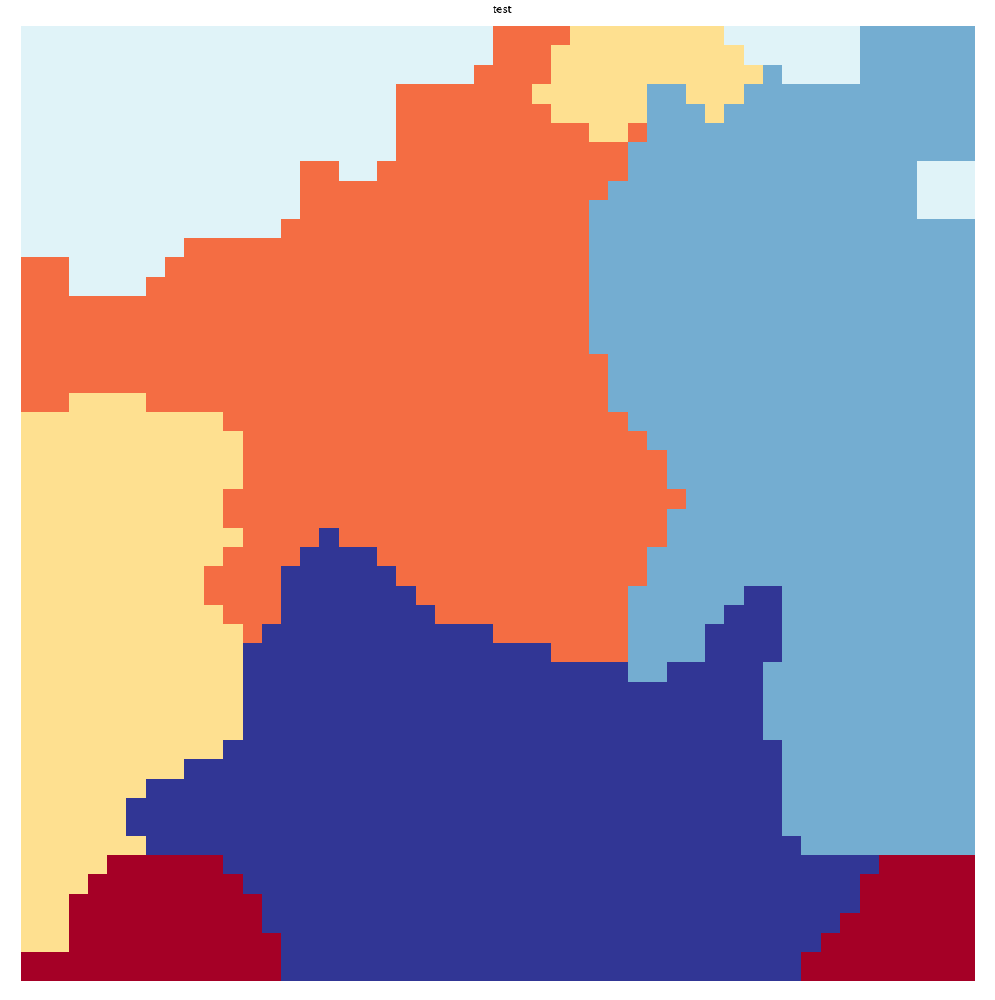

In [33]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

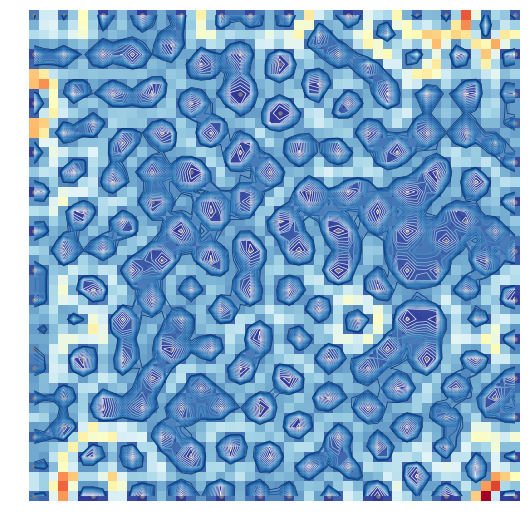

([], array([[0.16023306, 0.53766764, 0.53890441, ..., 0.43221993, 0.37340182,
         0.0803683 ],
        [0.31403357, 0.55390634, 0.58221361, ..., 0.32379634, 0.50788419,
         0.40970644],
        [0.45234415, 0.49079145, 0.54545603, ..., 0.53856606, 0.81971961,
         0.74990831],
        ...,
        [0.50730849, 0.40644129, 0.57825177, ..., 1.02739868, 0.91804217,
         0.7261223 ],
        [0.50528214, 0.40582041, 0.75669572, ..., 1.23984852, 0.43344432,
         0.36721931],
        [0.14316788, 0.10977035, 0.59522373, ..., 0.52026122, 0.02584842,
         0.01742786]]))

In [34]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

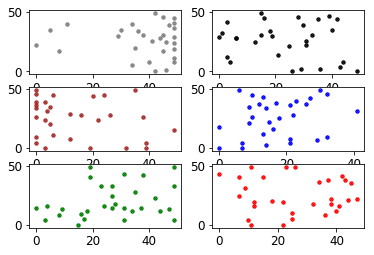

In [35]:
plot_data(som)

### 1000 Iterations 

In [36]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.498310553789601
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.053000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 1000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1 ---> elapsed time:  0.308000, quantization error: 1.130475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 2 ---> elapsed time:  0.327000, quantization error: 1.036799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 3 ---> elapsed time:  0.323000, quantization error: 0.991632

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 52 ---> elapsed time:  0.322000, quantization error: 0.893760

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 53 ---> elapsed time:  0.320000, quantization error: 0.893402

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 54 ---> elapsed time:  0.335000, quantization error: 0.892882

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 55 ---> elapsed time:  0.319000, quantization error: 0.892501

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 56 ---> elapsed time:  0.339000, quantization error: 0.892119

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 57 ---> elapsed time:  0.344000, quantization error: 0.891738

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 106 ---> elapsed time:  0.326000, quantization error: 0.870106

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 107 ---> elapsed time:  0.329000, quantization error: 0.869667

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 108 ---> elapsed time:  0.319000, quantization error: 0.869321

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 109 ---> elapsed time:  0.352000, quantization error: 0.868672

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 110 ---> elapsed time:  0.317000, quantization error: 0.868279

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 111 ---> elapsed time:  0.321000, quantization error: 0.867885

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 160 ---> elapsed time:  0.316000, quantization error: 0.845865

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 161 ---> elapsed time:  0.368000, quantization error: 0.845450

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 162 ---> elapsed time:  0.314000, quantization error: 0.845036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 163 ---> elapsed time:  0.322000, quantization error: 0.844621

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 164 ---> elapsed time:  0.348000, quantization error: 0.844178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 165 ---> elapsed time:  0.324000, quantization error: 0.843689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.055000 seconds
 epoch: 214 ---> elapsed time:  0.344000, quantization error: 0.818112

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 215 ---> elapsed time:  0.323000, quantization error: 0.817721

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 216 ---> elapsed time:  0.321000, quantization error: 0.817288

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 217 ---> elapsed time:  0.330000, quantization error: 0.816855

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 218 ---> elapsed time:  0.371000, quantization error: 0.816423

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 219 ---> elapsed time:  0.321000, quantization error: 0.815991

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 268 ---> elapsed time:  0.320000, quantization error: 0.791424

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 269 ---> elapsed time:  0.328000, quantization error: 0.790977

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 270 ---> elapsed time:  0.317000, quantization error: 0.790531

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 271 ---> elapsed time:  0.332000, quantization error: 0.790085

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 272 ---> elapsed time:  0.346000, quantization error: 0.789640

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 273 ---> elapsed time:  0.318000, quantization error: 0.789193

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 322 ---> elapsed time:  0.326000, quantization error: 0.762755

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 323 ---> elapsed time:  0.350000, quantization error: 0.762293

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 324 ---> elapsed time:  0.317000, quantization error: 0.761831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 325 ---> elapsed time:  0.324000, quantization error: 0.761369

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 326 ---> elapsed time:  0.342000, quantization error: 0.760893

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 327 ---> elapsed time:  0.315000, quantization error: 0.760381

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 376 ---> elapsed time:  0.315000, quantization error: 0.730270

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 377 ---> elapsed time:  0.322000, quantization error: 0.729647

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 378 ---> elapsed time:  0.321000, quantization error: 0.729068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 379 ---> elapsed time:  0.316000, quantization error: 0.728627

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 380 ---> elapsed time:  0.332000, quantization error: 0.728147

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 381 ---> elapsed time:  0.326000, quantization error: 0.727667

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 430 ---> elapsed time:  0.317000, quantization error: 0.700750

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 431 ---> elapsed time:  0.317000, quantization error: 0.700239

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 432 ---> elapsed time:  0.353000, quantization error: 0.699841

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 433 ---> elapsed time:  0.323000, quantization error: 0.699352

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 434 ---> elapsed time:  0.317000, quantization error: 0.698678

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 435 ---> elapsed time:  0.323000, quantization error: 0.698278

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 484 ---> elapsed time:  0.318000, quantization error: 0.663188

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 485 ---> elapsed time:  0.321000, quantization error: 0.662632

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 486 ---> elapsed time:  0.332000, quantization error: 0.661969

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 487 ---> elapsed time:  0.325000, quantization error: 0.661212

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 488 ---> elapsed time:  0.322000, quantization error: 0.660784

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 489 ---> elapsed time:  0.341000, quantization error: 0.660226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 538 ---> elapsed time:  0.322000, quantization error: 0.629206

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 539 ---> elapsed time:  0.321000, quantization error: 0.628477

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.064000 seconds
 epoch: 540 ---> elapsed time:  0.357000, quantization error: 0.627908

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 541 ---> elapsed time:  0.308000, quantization error: 0.627186

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 542 ---> elapsed time:  0.321000, quantization error: 0.626501

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 543 ---> elapsed time:  0.337000, quantization error: 0.625931

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 592 ---> elapsed time:  0.364000, quantization error: 0.592070

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 593 ---> elapsed time:  0.317000, quantization error: 0.591453

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 594 ---> elapsed time:  0.319000, quantization error: 0.590836

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 595 ---> elapsed time:  0.334000, quantization error: 0.590220

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 596 ---> elapsed time:  0.318000, quantization error: 0.589606

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 597 ---> elapsed time:  0.321000, quantization error: 0.588992

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 646 ---> elapsed time:  0.346000, quantization error: 0.555607

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 647 ---> elapsed time:  0.314000, quantization error: 0.554984

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 648 ---> elapsed time:  0.323000, quantization error: 0.554362

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 649 ---> elapsed time:  0.333000, quantization error: 0.553735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 650 ---> elapsed time:  0.321000, quantization error: 0.552974

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 651 ---> elapsed time:  0.321000, quantization error: 0.551492

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 700 ---> elapsed time:  0.328000, quantization error: 0.514897

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 701 ---> elapsed time:  0.326000, quantization error: 0.514298

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 702 ---> elapsed time:  0.319000, quantization error: 0.513713

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 703 ---> elapsed time:  0.316000, quantization error: 0.512554

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 704 ---> elapsed time:  0.337000, quantization error: 0.511880

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 705 ---> elapsed time:  0.331000, quantization error: 0.511207

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 754 ---> elapsed time:  0.335000, quantization error: 0.469096

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 755 ---> elapsed time:  0.321000, quantization error: 0.468406

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 756 ---> elapsed time:  0.321000, quantization error: 0.467538

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 757 ---> elapsed time:  0.325000, quantization error: 0.466767

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 758 ---> elapsed time:  0.319000, quantization error: 0.465996

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 759 ---> elapsed time:  0.320000, quantization error: 0.465226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 808 ---> elapsed time:  0.331000, quantization error: 0.422888

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 809 ---> elapsed time:  0.347000, quantization error: 0.422052

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 810 ---> elapsed time:  0.318000, quantization error: 0.420891

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 811 ---> elapsed time:  0.322000, quantization error: 0.419695

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 812 ---> elapsed time:  0.358000, quantization error: 0.417918

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 813 ---> elapsed time:  0.316000, quantization error: 0.416831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 862 ---> elapsed time:  0.314000, quantization error: 0.361248

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 863 ---> elapsed time:  0.359000, quantization error: 0.359958

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 864 ---> elapsed time:  0.318000, quantization error: 0.359030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 865 ---> elapsed time:  0.320000, quantization error: 0.358136

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 866 ---> elapsed time:  0.347000, quantization error: 0.357082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 867 ---> elapsed time:  0.320000, quantization error: 0.355830

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 916 ---> elapsed time:  0.320000, quantization error: 0.297885

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 917 ---> elapsed time:  0.334000, quantization error: 0.296674

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 918 ---> elapsed time:  0.317000, quantization error: 0.295264

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 919 ---> elapsed time:  0.322000, quantization error: 0.294047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 920 ---> elapsed time:  0.322000, quantization error: 0.292607

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 921 ---> elapsed time:  0.316000, quantization error: 0.290566

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 970 ---> elapsed time:  0.318000, quantization error: 0.214868

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 971 ---> elapsed time:  0.331000, quantization error: 0.213255

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 972 ---> elapsed time:  0.326000, quantization error: 0.211805

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 973 ---> elapsed time:  0.325000, quantization error: 0.210355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 974 ---> elapsed time:  0.326000, quantization error: 0.208906

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 975 ---> elapsed time:  0.350000, quantization error: 0.207457

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 update_codebook_voronoi took: 0.033000 seconds
 epoch: 23 ---> elapsed time:  0.357000, quantization error: 0.157893

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 24 ---> elapsed time:  0.316000, quantization error: 0.157499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 epoch: 25 ---> elapsed time:  0.344000, quantization error: 0.157105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 26 ---> elapsed time:  0.335000, quantization error: 0.156712

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 27 ---> elapsed time:  0.321000, quantization error: 0.156319

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 28 ---> elapsed time:  0.320000, quantization error: 0.155925

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 29 ---> elapsed time:  0.338000,

 update_codebook_voronoi took: 0.036000 seconds
 epoch: 77 ---> elapsed time:  0.323000, quantization error: 0.135902

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 78 ---> elapsed time:  0.321000, quantization error: 0.135518

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 79 ---> elapsed time:  0.333000, quantization error: 0.135136

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 80 ---> elapsed time:  0.417000, quantization error: 0.134753

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 81 ---> elapsed time:  0.365000, quantization error: 0.134371

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 82 ---> elapsed time:  0.332000, quantization error: 0.133989

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 83 ---> elapsed time:  0.325000,

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 131 ---> elapsed time:  0.334000, quantization error: 0.113617

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 132 ---> elapsed time:  0.344000, quantization error: 0.113251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 133 ---> elapsed time:  0.328000, quantization error: 0.112886

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.052000 seconds
 epoch: 134 ---> elapsed time:  0.367000, quantization error: 0.112521

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 135 ---> elapsed time:  0.319000, quantization error: 0.112157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 136 ---> elapsed time:  0.320000, quantization error: 0.111793

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 185 ---> elapsed time:  0.319000, quantization error: 0.092736

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 186 ---> elapsed time:  0.331000, quantization error: 0.092445

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 187 ---> elapsed time:  0.320000, quantization error: 0.092067

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 188 ---> elapsed time:  0.321000, quantization error: 0.091725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 189 ---> elapsed time:  0.351000, quantization error: 0.091383

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 190 ---> elapsed time:  0.322000, quantization error: 0.091042

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 239 ---> elapsed time:  0.322000, quantization error: 0.072435

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 240 ---> elapsed time:  0.345000, quantization error: 0.072118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 241 ---> elapsed time:  0.331000, quantization error: 0.071770

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 242 ---> elapsed time:  0.335000, quantization error: 0.071341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 243 ---> elapsed time:  0.326000, quantization error: 0.070996

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 244 ---> elapsed time:  0.330000, quantization error: 0.070485

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 293 ---> elapsed time:  0.327000, quantization error: 0.053304

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 294 ---> elapsed time:  0.348000, quantization error: 0.053021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 295 ---> elapsed time:  0.330000, quantization error: 0.052739

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 296 ---> elapsed time:  0.325000, quantization error: 0.052458

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 297 ---> elapsed time:  0.338000, quantization error: 0.052178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 298 ---> elapsed time:  0.326000, quantization error: 0.051898

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 347 ---> elapsed time:  0.332000, quantization error: 0.038987

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 348 ---> elapsed time:  0.323000, quantization error: 0.038752

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 349 ---> elapsed time:  0.326000, quantization error: 0.038517

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 350 ---> elapsed time:  0.342000, quantization error: 0.038283

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 351 ---> elapsed time:  0.338000, quantization error: 0.038050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 352 ---> elapsed time:  0.327000, quantization error: 0.037818

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 401 ---> elapsed time:  0.330000, quantization error: 0.027077

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 402 ---> elapsed time:  0.331000, quantization error: 0.026887

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 403 ---> elapsed time:  0.354000, quantization error: 0.026699

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 404 ---> elapsed time:  0.332000, quantization error: 0.026458

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 405 ---> elapsed time:  0.333000, quantization error: 0.026200

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 406 ---> elapsed time:  0.350000, quantization error: 0.026015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 455 ---> elapsed time:  0.339000, quantization error: 0.017810

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 456 ---> elapsed time:  0.336000, quantization error: 0.017666

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 457 ---> elapsed time:  0.330000, quantization error: 0.017523

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 458 ---> elapsed time:  0.334000, quantization error: 0.017380

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 459 ---> elapsed time:  0.331000, quantization error: 0.017239

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 460 ---> elapsed time:  0.336000, quantization error: 0.017098

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.055000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 509 ---> elapsed time:  0.327000, quantization error: 0.009081

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 510 ---> elapsed time:  0.347000, quantization error: 0.008982

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 511 ---> elapsed time:  0.326000, quantization error: 0.008885

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 512 ---> elapsed time:  0.328000, quantization error: 0.008611

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 513 ---> elapsed time:  0.345000, quantization error: 0.008356

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 514 ---> elapsed time:  0.349000, quantization error: 0.008031

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


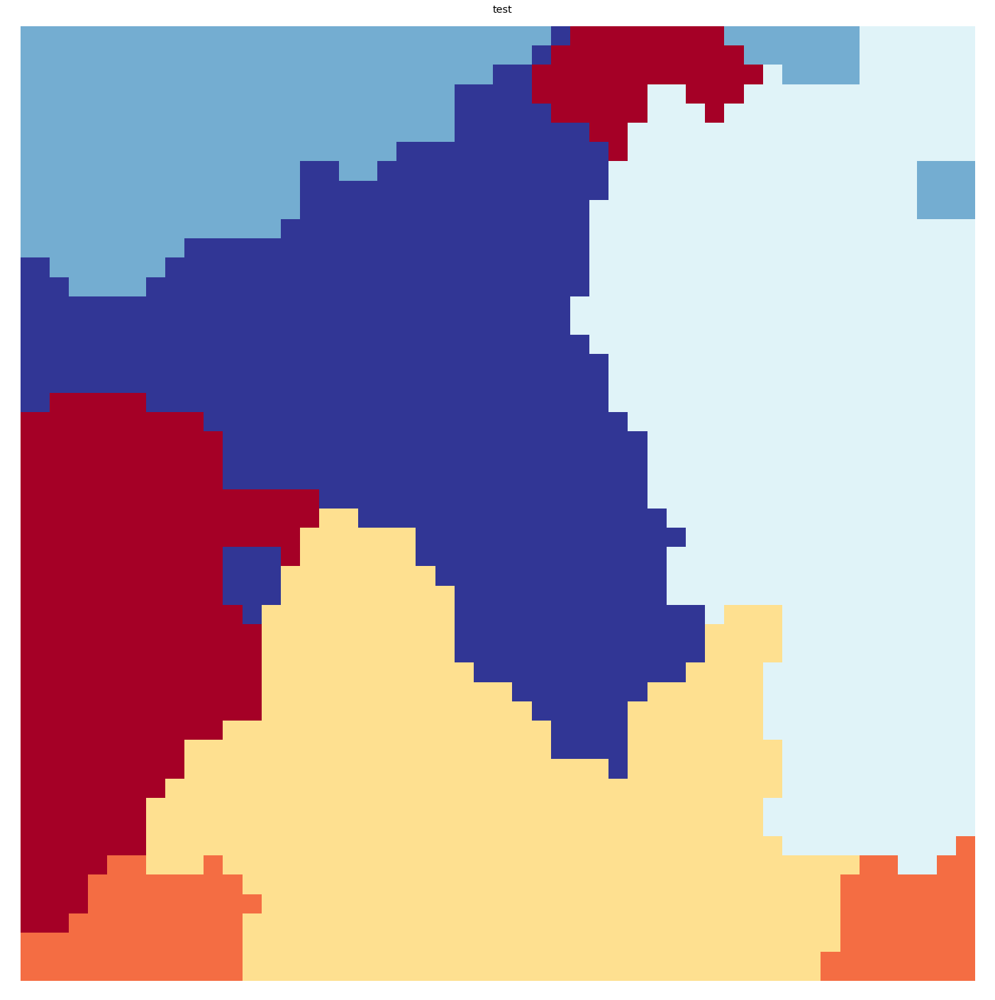

In [37]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

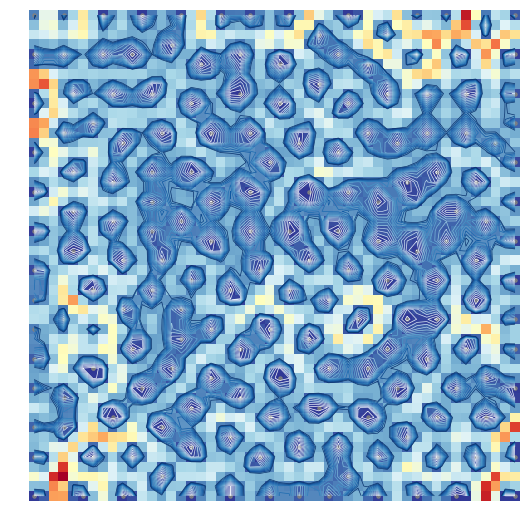

([], array([[0.16023306, 0.53766764, 0.53890441, ..., 0.43221993, 0.37340182,
         0.0803683 ],
        [0.31403357, 0.55390634, 0.58221361, ..., 0.32379634, 0.50788419,
         0.40970644],
        [0.45234415, 0.49079145, 0.54545603, ..., 0.53856606, 0.81971961,
         0.74990831],
        ...,
        [0.6041268 , 0.51514179, 1.15177045, ..., 1.09607816, 0.73444014,
         0.70686846],
        [0.31345952, 0.30882725, 0.96332383, ..., 0.92217055, 0.30819035,
         0.36374234],
        [0.01545785, 0.08552698, 0.91729973, ..., 0.54894275, 0.01593281,
         0.01713687]]))

In [38]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

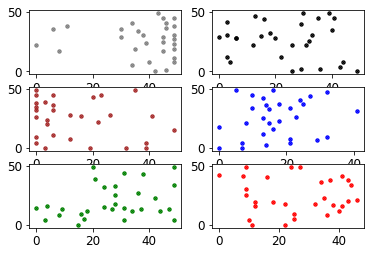

In [39]:
plot_data(som)

### 2000 Iterations 

In [40]:
som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 180 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.498310553789601
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.051000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 2000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1 ---> elapsed time:  0.318000, quantization error: 1.130475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 2 ---> elapsed time:  0.331000, quantization error: 1.036799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 3 ---> elapsed time:  0.323000, quantization error: 0.991792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 epoch: 4 ---> 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 52 ---> elapsed time:  0.319000, quantization error: 0.904120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 53 ---> elapsed time:  0.332000, quantization error: 0.903933

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 54 ---> elapsed time:  0.318000, quantization error: 0.903746

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 55 ---> elapsed time:  0.324000, quantization error: 0.903558

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 56 ---> elapsed time:  0.344000, quantization error: 0.903371

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 57 ---> elapsed time:  0.325000, quantization error: 0.903043

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 106 ---> elapsed time:  0.321000, quantization error: 0.892243

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 107 ---> elapsed time:  0.332000, quantization error: 0.892170

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 108 ---> elapsed time:  0.317000, quantization error: 0.891875

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 109 ---> elapsed time:  0.337000, quantization error: 0.891533

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 110 ---> elapsed time:  0.334000, quantization error: 0.891245

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 111 ---> elapsed time:  0.323000, quantization error: 0.890898

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 160 ---> elapsed time:  0.340000, quantization error: 0.880971

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 161 ---> elapsed time:  0.333000, quantization error: 0.880622

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 162 ---> elapsed time:  0.322000, quantization error: 0.880266

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 163 ---> elapsed time:  0.320000, quantization error: 0.880057

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 164 ---> elapsed time:  0.346000, quantization error: 0.879874

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 165 ---> elapsed time:  0.315000, quantization error: 0.879462

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 214 ---> elapsed time:  0.329000, quantization error: 0.868792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 215 ---> elapsed time:  0.338000, quantization error: 0.868771

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 216 ---> elapsed time:  0.341000, quantization error: 0.868495

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 217 ---> elapsed time:  0.321000, quantization error: 0.868300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 218 ---> elapsed time:  0.332000, quantization error: 0.868105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 219 ---> elapsed time:  0.321000, quantization error: 0.867909

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 268 ---> elapsed time:  0.321000, quantization error: 0.855154

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 269 ---> elapsed time:  0.333000, quantization error: 0.854745

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 270 ---> elapsed time:  0.334000, quantization error: 0.854370

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 271 ---> elapsed time:  0.321000, quantization error: 0.854276

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.051000 seconds
 epoch: 272 ---> elapsed time:  0.356000, quantization error: 0.853891

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 273 ---> elapsed time:  0.326000, quantization error: 0.853534

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 322 ---> elapsed time:  0.319000, quantization error: 0.841458

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 323 ---> elapsed time:  0.323000, quantization error: 0.841251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 324 ---> elapsed time:  0.323000, quantization error: 0.840983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 325 ---> elapsed time:  0.323000, quantization error: 0.840775

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 326 ---> elapsed time:  0.324000, quantization error: 0.840567

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 327 ---> elapsed time:  0.328000, quantization error: 0.840464

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 376 ---> elapsed time:  0.316000, quantization error: 0.830151

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.049000 seconds
 epoch: 377 ---> elapsed time:  0.338000, quantization error: 0.829942

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 378 ---> elapsed time:  0.328000, quantization error: 0.829733

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 379 ---> elapsed time:  0.316000, quantization error: 0.829524

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.056000 seconds
 epoch: 380 ---> elapsed time:  0.346000, quantization error: 0.829316

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 381 ---> elapsed time:  0.317000, quantization error: 0.829132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 430 ---> elapsed time:  0.327000, quantization error: 0.816489

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 431 ---> elapsed time:  0.326000, quantization error: 0.816275

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 432 ---> elapsed time:  0.334000, quantization error: 0.816061

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 433 ---> elapsed time:  0.320000, quantization error: 0.815846

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 434 ---> elapsed time:  0.338000, quantization error: 0.815632

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 435 ---> elapsed time:  0.322000, quantization error: 0.815418

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 484 ---> elapsed time:  0.318000, quantization error: 0.803870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 485 ---> elapsed time:  0.332000, quantization error: 0.803622

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 486 ---> elapsed time:  0.330000, quantization error: 0.803401

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 487 ---> elapsed time:  0.337000, quantization error: 0.803180

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 488 ---> elapsed time:  0.341000, quantization error: 0.802959

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 489 ---> elapsed time:  0.323000, quantization error: 0.802937

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 538 ---> elapsed time:  0.324000, quantization error: 0.789995

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 539 ---> elapsed time:  0.322000, quantization error: 0.789771

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 540 ---> elapsed time:  0.359000, quantization error: 0.789546

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 541 ---> elapsed time:  0.324000, quantization error: 0.789322

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 542 ---> elapsed time:  0.325000, quantization error: 0.789097

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 543 ---> elapsed time:  0.327000, quantization error: 0.788873

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 592 ---> elapsed time:  0.368000, quantization error: 0.775177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 593 ---> elapsed time:  0.336000, quantization error: 0.774950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 594 ---> elapsed time:  0.334000, quantization error: 0.774722

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 595 ---> elapsed time:  0.327000, quantization error: 0.774495

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 596 ---> elapsed time:  0.336000, quantization error: 0.774252

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 597 ---> elapsed time:  0.324000, quantization error: 0.774001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 646 ---> elapsed time:  0.319000, quantization error: 0.761669

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 647 ---> elapsed time:  0.326000, quantization error: 0.761245

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 648 ---> elapsed time:  0.336000, quantization error: 0.760859

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 649 ---> elapsed time:  0.322000, quantization error: 0.760653

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 650 ---> elapsed time:  0.342000, quantization error: 0.760420

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 651 ---> elapsed time:  0.317000, quantization error: 0.760187

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 700 ---> elapsed time:  0.325000, quantization error: 0.743563

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.051000 seconds
 epoch: 701 ---> elapsed time:  0.338000, quantization error: 0.743323

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 702 ---> elapsed time:  0.333000, quantization error: 0.743083

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 703 ---> elapsed time:  0.323000, quantization error: 0.742844

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 epoch: 704 ---> elapsed time:  0.342000, quantization error: 0.742436

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 705 ---> elapsed time:  0.331000, quantization error: 0.742105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 754 ---> elapsed time:  0.316000, quantization error: 0.728725

 find_bmu took: 0.114000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 755 ---> elapsed time:  0.333000, quantization error: 0.728487

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 756 ---> elapsed time:  0.330000, quantization error: 0.728249

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 757 ---> elapsed time:  0.318000, quantization error: 0.728011

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 758 ---> elapsed time:  0.342000, quantization error: 0.727774

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 759 ---> elapsed time:  0.324000, quantization error: 0.727536

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 808 ---> elapsed time:  0.320000, quantization error: 0.713949

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 809 ---> elapsed time:  0.326000, quantization error: 0.713707

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 810 ---> elapsed time:  0.332000, quantization error: 0.713447

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 811 ---> elapsed time:  0.321000, quantization error: 0.713204

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 812 ---> elapsed time:  0.326000, quantization error: 0.712982

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 813 ---> elapsed time:  0.357000, quantization error: 0.712680

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 862 ---> elapsed time:  0.326000, quantization error: 0.696930

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 863 ---> elapsed time:  0.318000, quantization error: 0.696669

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 864 ---> elapsed time:  0.348000, quantization error: 0.696408

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 865 ---> elapsed time:  0.317000, quantization error: 0.696148

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 866 ---> elapsed time:  0.323000, quantization error: 0.695887

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 867 ---> elapsed time:  0.344000, quantization error: 0.695626

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 916 ---> elapsed time:  0.317000, quantization error: 0.680103

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 917 ---> elapsed time:  0.334000, quantization error: 0.679839

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 918 ---> elapsed time:  0.326000, quantization error: 0.679576

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 919 ---> elapsed time:  0.318000, quantization error: 0.678676

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 920 ---> elapsed time:  0.342000, quantization error: 0.678217

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 921 ---> elapsed time:  0.317000, quantization error: 0.677952

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 970 ---> elapsed time:  0.323000, quantization error: 0.663904

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 971 ---> elapsed time:  0.331000, quantization error: 0.663633

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 972 ---> elapsed time:  0.371000, quantization error: 0.663362

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 973 ---> elapsed time:  0.319000, quantization error: 0.663091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 974 ---> elapsed time:  0.402000, quantization error: 0.662820

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 975 ---> elapsed time:  0.320000, quantization error: 0.662550

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 

 epoch: 1023 ---> elapsed time:  0.323000, quantization error: 0.647852

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1024 ---> elapsed time:  0.327000, quantization error: 0.647348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1025 ---> elapsed time:  0.347000, quantization error: 0.646927

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1026 ---> elapsed time:  0.322000, quantization error: 0.646645

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1027 ---> elapsed time:  0.330000, quantization error: 0.646363

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1028 ---> elapsed time:  0.348000, quantization error: 0.646081

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1029 ---> elapsed time:  0.321000, quantization error: 0.645802

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1077 ---> elapsed time:  0.321000, quantization error: 0.630284

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1078 ---> elapsed time:  0.320000, quantization error: 0.630001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1079 ---> elapsed time:  0.347000, quantization error: 0.629718

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1080 ---> elapsed time:  0.325000, quantization error: 0.629435

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1081 ---> elapsed time:  0.323000, quantization error: 0.629152

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1082 ---> elapsed time:  0.329000, quantization error: 0.628869

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1130 ---> elapsed time:  0.334000, quantization error: 0.612239

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1131 ---> elapsed time:  0.322000, quantization error: 0.611944

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 1132 ---> elapsed time:  0.336000, quantization error: 0.611650

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1133 ---> elapsed time:  0.329000, quantization error: 0.611185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1134 ---> elapsed time:  0.322000, quantization error: 0.610896

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1135 ---> elapsed time:  0.337000, quantization error: 0.610624

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.325000, quantization error: 0.595593

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1184 ---> elapsed time:  0.356000, quantization error: 0.595289

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1185 ---> elapsed time:  0.317000, quantization error: 0.594985

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1186 ---> elapsed time:  0.325000, quantization error: 0.594682

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1187 ---> elapsed time:  0.351000, quantization error: 0.594379

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1188 ---> elapsed time:  0.323000, quantization error: 0.594077

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1189 ---> elapsed time:  0.320000, quantization error: 0.593774

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1237 ---> elapsed time:  0.332000, quantization error: 0.578528

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1238 ---> elapsed time:  0.333000, quantization error: 0.578234

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1239 ---> elapsed time:  0.324000, quantization error: 0.577940

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1240 ---> elapsed time:  0.323000, quantization error: 0.577577

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1241 ---> elapsed time:  0.331000, quantization error: 0.577382

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1242 ---> elapsed time:  0.322000, quantization error: 0.576724

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 sec

 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1290 ---> elapsed time:  0.326000, quantization error: 0.560985

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1291 ---> elapsed time:  0.319000, quantization error: 0.559359

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1292 ---> elapsed time:  0.333000, quantization error: 0.559151

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1293 ---> elapsed time:  0.321000, quantization error: 0.558837

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1294 ---> elapsed time:  0.319000, quantization error: 0.558557

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1295 ---> elapsed time:  0.325000, quantization error: 0.558318

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.329000, quantization error: 0.538682

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1344 ---> elapsed time:  0.318000, quantization error: 0.538356

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1345 ---> elapsed time:  0.335000, quantization error: 0.538030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1346 ---> elapsed time:  0.322000, quantization error: 0.537704

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1347 ---> elapsed time:  0.320000, quantization error: 0.537379

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1348 ---> elapsed time:  0.331000, quantization error: 0.537054

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1349 ---> elapsed time:  0.322000, quantization error: 0.536729

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1397 ---> elapsed time:  0.321000, quantization error: 0.516750

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1398 ---> elapsed time:  0.319000, quantization error: 0.516017

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1399 ---> elapsed time:  0.334000, quantization error: 0.515612

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1400 ---> elapsed time:  0.321000, quantization error: 0.514930

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1401 ---> elapsed time:  0.325000, quantization error: 0.514743

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 epoch: 1402 ---> elapsed time:  0.343000, quantization error: 0.514243

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.042000 seconds
 epoch: 1450 ---> elapsed time:  0.329000, quantization error: 0.495618

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1451 ---> elapsed time:  0.327000, quantization error: 0.495254

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1452 ---> elapsed time:  0.324000, quantization error: 0.494890

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 1453 ---> elapsed time:  0.345000, quantization error: 0.494526

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1454 ---> elapsed time:  0.333000, quantization error: 0.494163

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1455 ---> elapsed time:  0.323000, quantization error: 0.493799

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.324000, quantization error: 0.473067

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1504 ---> elapsed time:  0.321000, quantization error: 0.472684

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1505 ---> elapsed time:  0.341000, quantization error: 0.472301

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1506 ---> elapsed time:  0.319000, quantization error: 0.471918

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1507 ---> elapsed time:  0.343000, quantization error: 0.471535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1508 ---> elapsed time:  0.317000, quantization error: 0.471152

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1509 ---> elapsed time:  0.336000, quantization error: 0.470769

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1557 ---> elapsed time:  0.325000, quantization error: 0.451288

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1558 ---> elapsed time:  0.328000, quantization error: 0.450875

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1559 ---> elapsed time:  0.325000, quantization error: 0.450463

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1560 ---> elapsed time:  0.323000, quantization error: 0.450051

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 1561 ---> elapsed time:  0.345000, quantization error: 0.449636

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1562 ---> elapsed time:  0.320000, quantization error: 0.449110

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 sec

 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1610 ---> elapsed time:  0.321000, quantization error: 0.427016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1611 ---> elapsed time:  0.320000, quantization error: 0.426181

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.052000 seconds
 epoch: 1612 ---> elapsed time:  0.351000, quantization error: 0.423874

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1613 ---> elapsed time:  0.339000, quantization error: 0.423493

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1614 ---> elapsed time:  0.322000, quantization error: 0.423485

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1615 ---> elapsed time:  0.332000, quantization error: 0.422978

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.357000, quantization error: 0.400127

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1664 ---> elapsed time:  0.315000, quantization error: 0.399652

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1665 ---> elapsed time:  0.322000, quantization error: 0.399178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 1666 ---> elapsed time:  0.331000, quantization error: 0.398703

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1667 ---> elapsed time:  0.329000, quantization error: 0.398228

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 1668 ---> elapsed time:  0.329000, quantization error: 0.397752

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 1669 ---> elapsed time:  0.368000, quantization error: 0.396752

 fi

 find_bmu took: 0.116000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1717 ---> elapsed time:  0.350000, quantization error: 0.369696

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1718 ---> elapsed time:  0.328000, quantization error: 0.369187

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1719 ---> elapsed time:  0.324000, quantization error: 0.368416

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 1720 ---> elapsed time:  0.341000, quantization error: 0.367685

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1721 ---> elapsed time:  0.334000, quantization error: 0.366908

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1722 ---> elapsed time:  0.321000, quantization error: 0.366661

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.035000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1770 ---> elapsed time:  0.318000, quantization error: 0.339070

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1771 ---> elapsed time:  0.339000, quantization error: 0.338515

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1772 ---> elapsed time:  0.326000, quantization error: 0.337960

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1773 ---> elapsed time:  0.321000, quantization error: 0.337405

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1774 ---> elapsed time:  0.331000, quantization error: 0.336850

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1775 ---> elapsed time:  0.322000, quantization error: 0.336295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.319000, quantization error: 0.307394

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1824 ---> elapsed time:  0.319000, quantization error: 0.306105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 1825 ---> elapsed time:  0.343000, quantization error: 0.305311

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1826 ---> elapsed time:  0.330000, quantization error: 0.304503

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1827 ---> elapsed time:  0.317000, quantization error: 0.303902

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 1828 ---> elapsed time:  0.326000, quantization error: 0.303301

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1829 ---> elapsed time:  0.320000, quantization error: 0.302700

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1877 ---> elapsed time:  0.332000, quantization error: 0.266105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1878 ---> elapsed time:  0.318000, quantization error: 0.265418

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 1879 ---> elapsed time:  0.361000, quantization error: 0.264735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1880 ---> elapsed time:  0.318000, quantization error: 0.264051

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1881 ---> elapsed time:  0.324000, quantization error: 0.263368

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1882 ---> elapsed time:  0.329000, quantization error: 0.262684

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 sec

 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1930 ---> elapsed time:  0.321000, quantization error: 0.224266

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1931 ---> elapsed time:  0.355000, quantization error: 0.223541

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1932 ---> elapsed time:  0.321000, quantization error: 0.222815

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1933 ---> elapsed time:  0.338000, quantization error: 0.222089

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1934 ---> elapsed time:  0.317000, quantization error: 0.221086

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1935 ---> elapsed time:  0.327000, quantization error: 0.220358

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.319000, quantization error: 0.179731

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1984 ---> elapsed time:  0.329000, quantization error: 0.178962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1985 ---> elapsed time:  0.358000, quantization error: 0.178157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1986 ---> elapsed time:  0.318000, quantization error: 0.177118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1987 ---> elapsed time:  0.331000, quantization error: 0.176348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1988 ---> elapsed time:  0.344000, quantization error: 0.175577

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1989 ---> elapsed time:  0.330000, quantization error: 0.174807

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 37 ---> elapsed time:  0.326000, quantization error: 0.150281

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 38 ---> elapsed time:  0.324000, quantization error: 0.149887

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 39 ---> elapsed time:  0.327000, quantization error: 0.149493

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 40 ---> elapsed time:  0.322000, quantization error: 0.149015

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 41 ---> elapsed time:  0.344000, quantization error: 0.148621

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 42 ---> elapsed time:  0.330000, quantization error: 0.148227

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 91 ---> elapsed time:  0.326000, quantization error: 0.128687

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 92 ---> elapsed time:  0.335000, quantization error: 0.128301

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 93 ---> elapsed time:  0.341000, quantization error: 0.127915

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 94 ---> elapsed time:  0.319000, quantization error: 0.127529

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 95 ---> elapsed time:  0.339000, quantization error: 0.127144

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 96 ---> elapsed time:  0.322000, quantization error: 0.126759

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 145 ---> elapsed time:  0.321000, quantization error: 0.106561

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 146 ---> elapsed time:  0.330000, quantization error: 0.106188

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 147 ---> elapsed time:  0.324000, quantization error: 0.105815

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 148 ---> elapsed time:  0.324000, quantization error: 0.105443

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.059000 seconds
 epoch: 149 ---> elapsed time:  0.355000, quantization error: 0.105071

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 150 ---> elapsed time:  0.323000, quantization error: 0.104700

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 199 ---> elapsed time:  0.321000, quantization error: 0.086569

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 200 ---> elapsed time:  0.337000, quantization error: 0.086222

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 201 ---> elapsed time:  0.327000, quantization error: 0.085876

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 202 ---> elapsed time:  0.322000, quantization error: 0.085530

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 203 ---> elapsed time:  0.340000, quantization error: 0.085185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 204 ---> elapsed time:  0.332000, quantization error: 0.084840

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 253 ---> elapsed time:  0.322000, quantization error: 0.065869

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 254 ---> elapsed time:  0.340000, quantization error: 0.065548

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 255 ---> elapsed time:  0.329000, quantization error: 0.065229

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 256 ---> elapsed time:  0.328000, quantization error: 0.064870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 257 ---> elapsed time:  0.356000, quantization error: 0.064552

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 258 ---> elapsed time:  0.334000, quantization error: 0.064235

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 307 ---> elapsed time:  0.332000, quantization error: 0.048652

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 308 ---> elapsed time:  0.334000, quantization error: 0.048373

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 309 ---> elapsed time:  0.339000, quantization error: 0.048094

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 310 ---> elapsed time:  0.345000, quantization error: 0.047817

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 311 ---> elapsed time:  0.333000, quantization error: 0.047541

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 312 ---> elapsed time:  0.327000, quantization error: 0.047265

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 361 ---> elapsed time:  0.326000, quantization error: 0.034191

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 362 ---> elapsed time:  0.347000, quantization error: 0.033962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 363 ---> elapsed time:  0.351000, quantization error: 0.033734

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 364 ---> elapsed time:  0.341000, quantization error: 0.033507

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 365 ---> elapsed time:  0.338000, quantization error: 0.033281

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 366 ---> elapsed time:  0.349000, quantization error: 0.033056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 415 ---> elapsed time:  0.336000, quantization error: 0.022337

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 416 ---> elapsed time:  0.337000, quantization error: 0.022163

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 417 ---> elapsed time:  0.341000, quantization error: 0.021990

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 418 ---> elapsed time:  0.335000, quantization error: 0.021817

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 419 ---> elapsed time:  0.337000, quantization error: 0.021646

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 420 ---> elapsed time:  0.371000, quantization error: 0.021476

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 469 ---> elapsed time:  0.340000, quantization error: 0.014016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 470 ---> elapsed time:  0.336000, quantization error: 0.013890

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 471 ---> elapsed time:  0.361000, quantization error: 0.013765

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 472 ---> elapsed time:  0.334000, quantization error: 0.013641

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 473 ---> elapsed time:  0.350000, quantization error: 0.013518

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 474 ---> elapsed time:  0.351000, quantization error: 0.013395

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 523 ---> elapsed time:  0.355000, quantization error: 0.008185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 524 ---> elapsed time:  0.393000, quantization error: 0.008100

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 525 ---> elapsed time:  0.331000, quantization error: 0.008017

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 526 ---> elapsed time:  0.337000, quantization error: 0.007934

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 527 ---> elapsed time:  0.333000, quantization error: 0.007852

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 528 ---> elapsed time:  0.336000, quantization error: 0.007770

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


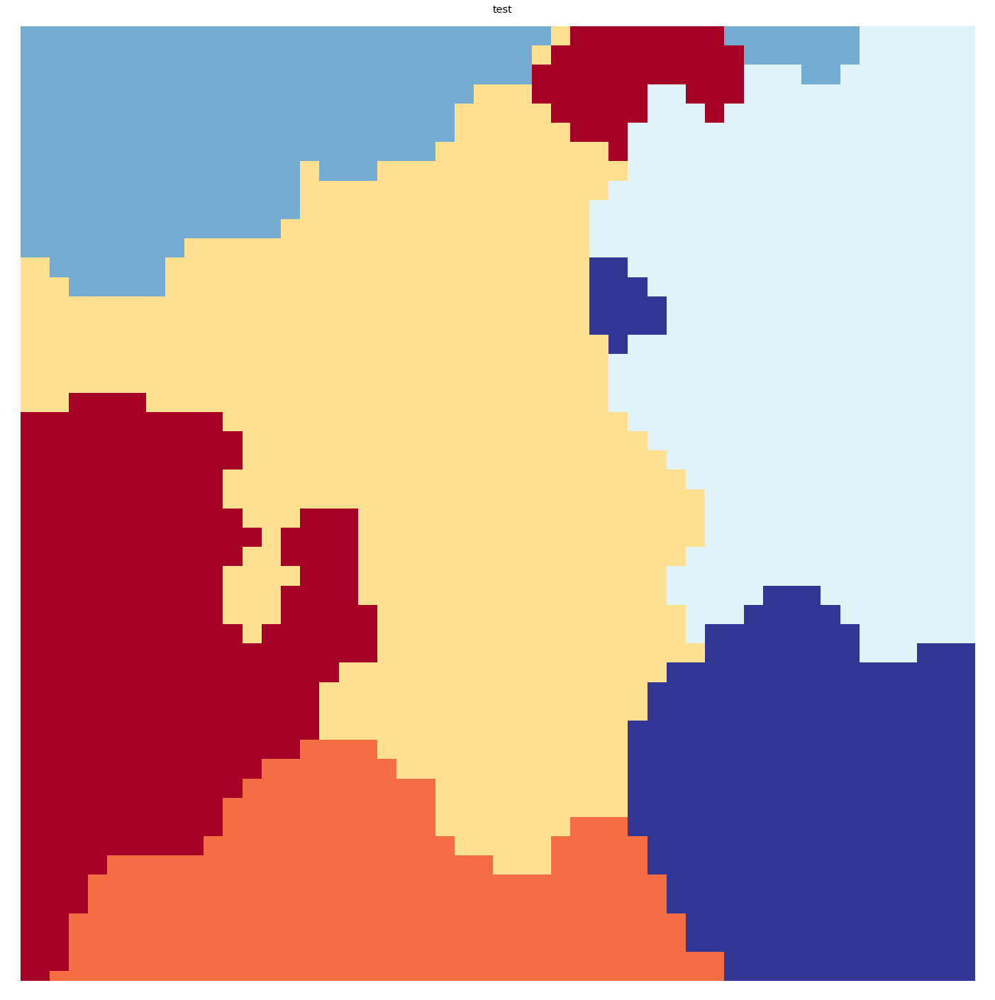

In [41]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=6)
vis.show(som, what='cluster')

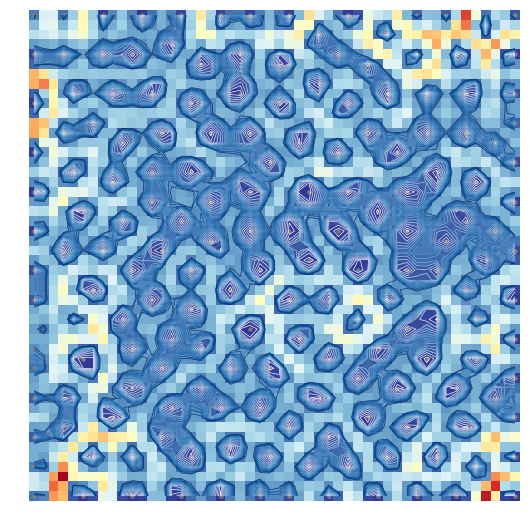

([], array([[0.16023306, 0.53766764, 0.53890441, ..., 0.43221993, 0.37340182,
         0.0803683 ],
        [0.31403357, 0.55390634, 0.58221361, ..., 0.32379634, 0.50788419,
         0.40970644],
        [0.45234415, 0.49079145, 0.54545603, ..., 0.53856606, 0.81971961,
         0.74990831],
        ...,
        [0.50741378, 0.4186046 , 0.98775937, ..., 1.0266026 , 0.91813345,
         0.72612452],
        [0.50571572, 0.45337964, 1.10745224, ..., 1.24591441, 0.43472019,
         0.36722508],
        [0.14387018, 0.18101443, 1.0061234 , ..., 0.765933  , 0.02822574,
         0.01743611]]))

In [42]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

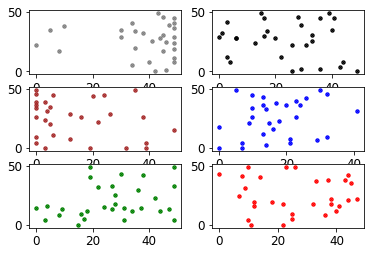

In [43]:
plot_data(som)

## Clustering 2 groups 0 - 10 and 10 -19

In [44]:
group_0_19_train = data[1:59]
test_0_10 = data[0]
test_10_19 = data[59]

# Map Size 20x20

In [45]:
mapsize = [20,20]

### Num of iterations = 500

In [46]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.210586024905156
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.015000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 500

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1 ---> elapsed time:  0.119000, quantization error: 1.184899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 2 ---> elapsed time:  0.126000, quantization error: 1.021073

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 3 ---> elapsed time:  0.115000, quantization error: 0.935820

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 52 ---> elapsed time:  0.117000, quantization error: 0.846623

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 53 ---> elapsed time:  0.119000, quantization error: 0.846351

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 54 ---> elapsed time:  0.116000, quantization error: 0.845349

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 55 ---> elapsed time:  0.120000, quantization error: 0.844346

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 56 ---> elapsed time:  0.116000, quantization error: 0.843344

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 57 ---> elapsed time:  0.117000, quantization error: 0.842343

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 58 ---> elapsed time:  0.117000,

 update_codebook_voronoi took: 0.004000 seconds
 epoch: 106 ---> elapsed time:  0.122000, quantization error: 0.793441

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 107 ---> elapsed time:  0.121000, quantization error: 0.792447

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 108 ---> elapsed time:  0.121000, quantization error: 0.791212

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 109 ---> elapsed time:  0.122000, quantization error: 0.790211

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 110 ---> elapsed time:  0.121000, quantization error: 0.789209

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 111 ---> elapsed time:  0.119000, quantization error: 0.788209

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 160 ---> elapsed time:  0.118000, quantization error: 0.737284

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 161 ---> elapsed time:  0.116000, quantization error: 0.735611

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 162 ---> elapsed time:  0.118000, quantization error: 0.734585

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 163 ---> elapsed time:  0.118000, quantization error: 0.733560

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 164 ---> elapsed time:  0.117000, quantization error: 0.732536

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 165 ---> elapsed time:  0.116000, quantization error: 0.731512

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 214 ---> elapsed time:  0.116000, quantization error: 0.673088

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 215 ---> elapsed time:  0.116000, quantization error: 0.671964

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 216 ---> elapsed time:  0.116000, quantization error: 0.670841

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 217 ---> elapsed time:  0.116000, quantization error: 0.669718

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 218 ---> elapsed time:  0.113000, quantization error: 0.668597

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 219 ---> elapsed time:  0.117000, quantization error: 0.667476

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 268 ---> elapsed time:  0.118000, quantization error: 0.599185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 269 ---> elapsed time:  0.115000, quantization error: 0.599379

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 270 ---> elapsed time:  0.117000, quantization error: 0.596697

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 271 ---> elapsed time:  0.117000, quantization error: 0.595333

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 272 ---> elapsed time:  0.117000, quantization error: 0.593970

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 273 ---> elapsed time:  0.116000, quantization error: 0.592606

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 322 ---> elapsed time:  0.120000, quantization error: 0.521618

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 323 ---> elapsed time:  0.131000, quantization error: 0.519196

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 324 ---> elapsed time:  0.122000, quantization error: 0.515716

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 325 ---> elapsed time:  0.119000, quantization error: 0.514213

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 326 ---> elapsed time:  0.115000, quantization error: 0.512709

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 327 ---> elapsed time:  0.117000, quantization error: 0.511195

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 376 ---> elapsed time:  0.113000, quantization error: 0.408415

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 377 ---> elapsed time:  0.116000, quantization error: 0.406578

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 378 ---> elapsed time:  0.116000, quantization error: 0.404739

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 379 ---> elapsed time:  0.117000, quantization error: 0.402899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 380 ---> elapsed time:  0.122000, quantization error: 0.401059

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 381 ---> elapsed time:  0.125000, quantization error: 0.399217

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.118000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 430 ---> elapsed time:  0.135000, quantization error: 0.288934

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.118000, quantization error: 0.286883

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 432 ---> elapsed time:  0.114000, quantization error: 0.280200

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 433 ---> elapsed time:  0.116000, quantization error: 0.278114

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 434 ---> elapsed time:  0.116000, quantization error: 0.276024

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 435 ---> elapsed time:  0.118000, quantization error: 0.269419

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 484 ---> elapsed time:  0.125000, quantization error: 0.141150

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.119000, quantization error: 0.139012

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 486 ---> elapsed time:  0.122000, quantization error: 0.136888

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 487 ---> elapsed time:  0.117000, quantization error: 0.134776

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 488 ---> elapsed time:  0.117000, quantization error: 0.130935

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 489 ---> elapsed time:  0.116000, quantization error: 0.128847

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 epoch: 37 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 38 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 39 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 40 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 41 ---> elapsed time:  0.124000, quantization error: 0.104962

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 42 ---> elapsed time:  0.130000, quantization error: 0.104962

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 43 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.133000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 92 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 93 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 94 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 95 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 96 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 97 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 145 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 146 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 147 ---> elapsed time:  0.111000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 148 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 149 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 150 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 199 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 200 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 201 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 202 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 203 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 204 ---> elapsed time:  0.124000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 253 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.116000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 254 ---> elapsed time:  0.137000, quantization error: 0.104962

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 255 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 256 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 257 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 258 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


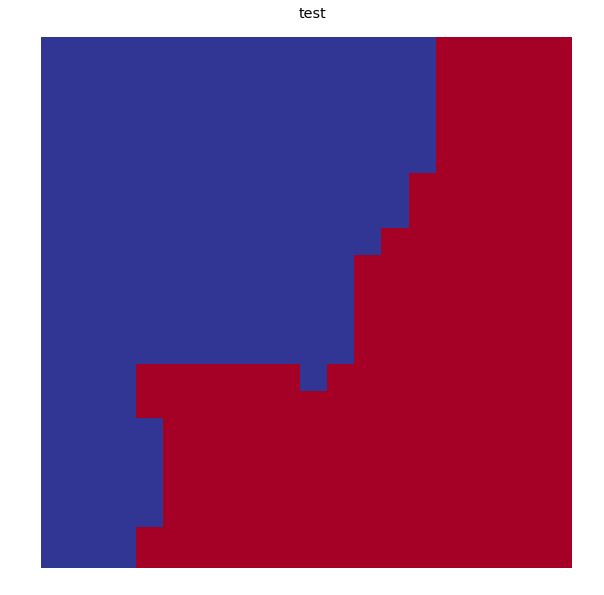

In [47]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

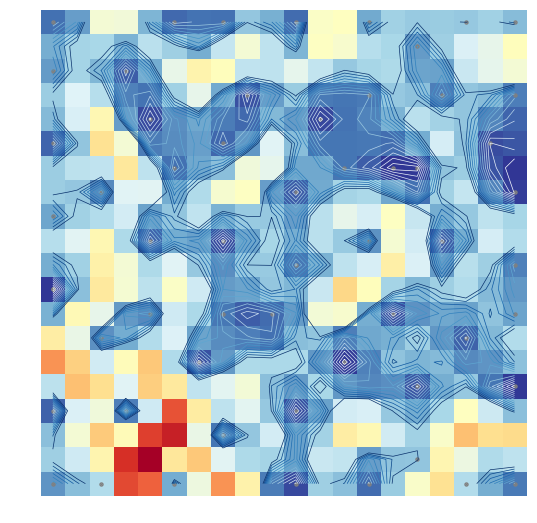

([], array([[0.22270426, 0.3155486 , 0.64400342, 0.63622974, 0.36731093,
         0.21021871, 0.22837341, 0.22346224, 0.41461382, 0.3558684 ,
         0.21444091, 0.67477464, 0.68433686, 0.33922863, 0.4411488 ,
         0.42288125, 0.42465382, 0.41806658, 0.44040481, 0.38522749],
        [0.3505333 , 0.45002809, 0.45906509, 0.36477577, 0.49498115,
         0.43650728, 0.34811158, 0.51493404, 0.64619714, 0.5029588 ,
         0.36663518, 0.68103005, 0.65825265, 0.48326932, 0.45652607,
         0.30982702, 0.43642015, 0.56628766, 0.60102599, 0.69352027],
        [0.30855356, 0.44843863, 0.37434491, 0.18653539, 0.34739527,
         0.6049282 , 0.73239379, 0.69511995, 0.507469  , 0.50248459,
         0.59663565, 0.51170347, 0.41698106, 0.45258236, 0.46759924,
         0.32654752, 0.32386077, 0.52526105, 0.5985652 , 0.64461654],
        [0.43135646, 0.57375423, 0.4830763 , 0.25372953, 0.22739097,
         0.44181456, 0.60329779, 0.3390403 , 0.16501182, 0.31302502,
         0.42644516, 0.2413

In [48]:
# ALL THE 180 INDIVIDUOS
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

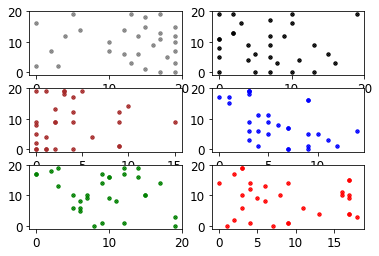

In [49]:
# INDIVIDUOS BY GROUP
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


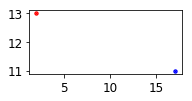

In [50]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 1000 iterations

In [51]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.210586024905156
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.015000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 1000

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1 ---> elapsed time:  0.116000, quantization error: 1.184899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 2 ---> elapsed time:  0.120000, quantization error: 1.021073

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 3 ---> elapsed time:  0.127000, quantization error: 0.936196

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 52 ---> elapsed time:  0.116000, quantization error: 0.871404

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 53 ---> elapsed time:  0.122000, quantization error: 0.870908

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 54 ---> elapsed time:  0.122000, quantization error: 0.870413

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.125000, quantization error: 0.869918

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 56 ---> elapsed time:  0.117000, quantization error: 0.869423

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 57 ---> elapsed time:  0.118000, quantization error: 0.868928

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 106 ---> elapsed time:  0.116000, quantization error: 0.845401

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 107 ---> elapsed time:  0.116000, quantization error: 0.844900

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 108 ---> elapsed time:  0.116000, quantization error: 0.844400

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 109 ---> elapsed time:  0.116000, quantization error: 0.843899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 110 ---> elapsed time:  0.117000, quantization error: 0.843399

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 111 ---> elapsed time:  0.117000, quantization error: 0.842898

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 160 ---> elapsed time:  0.122000, quantization error: 0.818684

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.122000, quantization error: 0.818187

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.121000, quantization error: 0.817690

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 163 ---> elapsed time:  0.113000, quantization error: 0.817193

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 164 ---> elapsed time:  0.121000, quantization error: 0.816696

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 165 ---> elapsed time:  0.112000, quantization error: 0.816199

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 214 ---> elapsed time:  0.121000, quantization error: 0.791319

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 215 ---> elapsed time:  0.118000, quantization error: 0.790818

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 216 ---> elapsed time:  0.121000, quantization error: 0.790318

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 217 ---> elapsed time:  0.116000, quantization error: 0.789818

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 218 ---> elapsed time:  0.125000, quantization error: 0.789318

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 219 ---> elapsed time:  0.121000, quantization error: 0.788818

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 268 ---> elapsed time:  0.117000, quantization error: 0.764803

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 269 ---> elapsed time:  0.114000, quantization error: 0.764299

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 270 ---> elapsed time:  0.118000, quantization error: 0.763795

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 271 ---> elapsed time:  0.118000, quantization error: 0.763292

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 272 ---> elapsed time:  0.119000, quantization error: 0.762788

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 273 ---> elapsed time:  0.118000, quantization error: 0.762285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 322 ---> elapsed time:  0.119000, quantization error: 0.734749

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 323 ---> elapsed time:  0.120000, quantization error: 0.734237

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 324 ---> elapsed time:  0.116000, quantization error: 0.733725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 325 ---> elapsed time:  0.116000, quantization error: 0.733213

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 326 ---> elapsed time:  0.116000, quantization error: 0.732702

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 327 ---> elapsed time:  0.116000, quantization error: 0.732190

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 376 ---> elapsed time:  0.117000, quantization error: 0.702034

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 377 ---> elapsed time:  0.117000, quantization error: 0.701498

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 378 ---> elapsed time:  0.117000, quantization error: 0.700962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 379 ---> elapsed time:  0.121000, quantization error: 0.700426

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 380 ---> elapsed time:  0.121000, quantization error: 0.699891

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 381 ---> elapsed time:  0.124000, quantization error: 0.699355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 430 ---> elapsed time:  0.115000, quantization error: 0.671081

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 431 ---> elapsed time:  0.118000, quantization error: 0.670520

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 432 ---> elapsed time:  0.117000, quantization error: 0.669960

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 433 ---> elapsed time:  0.116000, quantization error: 0.669399

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 434 ---> elapsed time:  0.117000, quantization error: 0.668839

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 435 ---> elapsed time:  0.117000, quantization error: 0.668279

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 484 ---> elapsed time:  0.116000, quantization error: 0.635306

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 485 ---> elapsed time:  0.116000, quantization error: 0.634706

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 486 ---> elapsed time:  0.120000, quantization error: 0.634105

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 487 ---> elapsed time:  0.118000, quantization error: 0.633505

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 488 ---> elapsed time:  0.113000, quantization error: 0.632905

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 489 ---> elapsed time:  0.115000, quantization error: 0.632305

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 538 ---> elapsed time:  0.117000, quantization error: 0.597063

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 539 ---> elapsed time:  0.116000, quantization error: 0.596381

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 540 ---> elapsed time:  0.117000, quantization error: 0.595700

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 541 ---> elapsed time:  0.116000, quantization error: 0.595019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 542 ---> elapsed time:  0.118000, quantization error: 0.594338

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 543 ---> elapsed time:  0.113000, quantization error: 0.593657

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 592 ---> elapsed time:  0.125000, quantization error: 0.558716

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 593 ---> elapsed time:  0.120000, quantization error: 0.558027

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 594 ---> elapsed time:  0.119000, quantization error: 0.557338

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 595 ---> elapsed time:  0.116000, quantization error: 0.556649

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 596 ---> elapsed time:  0.116000, quantization error: 0.555961

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 597 ---> elapsed time:  0.117000, quantization error: 0.555272

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 646 ---> elapsed time:  0.117000, quantization error: 0.516201

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 647 ---> elapsed time:  0.117000, quantization error: 0.515450

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 648 ---> elapsed time:  0.116000, quantization error: 0.514699

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 649 ---> elapsed time:  0.121000, quantization error: 0.513948

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 650 ---> elapsed time:  0.123000, quantization error: 0.513197

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 651 ---> elapsed time:  0.119000, quantization error: 0.512445

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 700 ---> elapsed time:  0.118000, quantization error: 0.465673

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 701 ---> elapsed time:  0.116000, quantization error: 0.464857

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 702 ---> elapsed time:  0.116000, quantization error: 0.464041

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 703 ---> elapsed time:  0.117000, quantization error: 0.463226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 704 ---> elapsed time:  0.117000, quantization error: 0.462410

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 705 ---> elapsed time:  0.122000, quantization error: 0.461594

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 754 ---> elapsed time:  0.116000, quantization error: 0.405431

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 755 ---> elapsed time:  0.118000, quantization error: 0.404513

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 756 ---> elapsed time:  0.120000, quantization error: 0.403594

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 757 ---> elapsed time:  0.116000, quantization error: 0.402675

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 758 ---> elapsed time:  0.116000, quantization error: 0.401755

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 759 ---> elapsed time:  0.116000, quantization error: 0.400836

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 808 ---> elapsed time:  0.116000, quantization error: 0.353439

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 809 ---> elapsed time:  0.117000, quantization error: 0.352464

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 810 ---> elapsed time:  0.118000, quantization error: 0.350644

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 811 ---> elapsed time:  0.115000, quantization error: 0.345622

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 812 ---> elapsed time:  0.131000, quantization error: 0.339774

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 813 ---> elapsed time:  0.122000, quantization error: 0.339728

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 862 ---> elapsed time:  0.117000, quantization error: 0.281099

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 863 ---> elapsed time:  0.112000, quantization error: 0.280056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 864 ---> elapsed time:  0.117000, quantization error: 0.279014

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 865 ---> elapsed time:  0.117000, quantization error: 0.277972

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 866 ---> elapsed time:  0.117000, quantization error: 0.276931

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 867 ---> elapsed time:  0.116000, quantization error: 0.275881

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 916 ---> elapsed time:  0.122000, quantization error: 0.202197

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 917 ---> elapsed time:  0.122000, quantization error: 0.201079

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 918 ---> elapsed time:  0.116000, quantization error: 0.199962

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 919 ---> elapsed time:  0.123000, quantization error: 0.198848

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 920 ---> elapsed time:  0.117000, quantization error: 0.197734

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 921 ---> elapsed time:  0.117000, quantization error: 0.196623

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 970 ---> elapsed time:  0.117000, quantization error: 0.137915

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 971 ---> elapsed time:  0.119000, quantization error: 0.136856

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 972 ---> elapsed time:  0.117000, quantization error: 0.135800

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 973 ---> elapsed time:  0.117000, quantization error: 0.134746

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 974 ---> elapsed time:  0.115000, quantization error: 0.131956

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 975 ---> elapsed time:  0.119000, quantization error: 0.130908

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 update_codebook_voronoi took: 0.003000 seconds
 epoch: 23 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 24 ---> elapsed time:  0.126000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 25 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 26 ---> elapsed time:  0.122000, quantization error: 0.104962

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 27 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 28 ---> elapsed time:  0.113000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 29 ---> elapsed time:  0.116000,

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 77 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 78 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 79 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 80 ---> elapsed time:  0.123000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 81 ---> elapsed time:  0.153000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 82 ---> elapsed time:  0.111000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 83 ---> elapsed time:  0.118000,

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 131 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 132 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 133 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 134 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 135 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 136 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 185 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 186 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 187 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 188 ---> elapsed time:  0.138000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 189 ---> elapsed time:  0.118000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 190 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 239 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 240 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 241 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 242 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 243 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 244 ---> elapsed time:  0.125000, quantization error: 0.104962

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


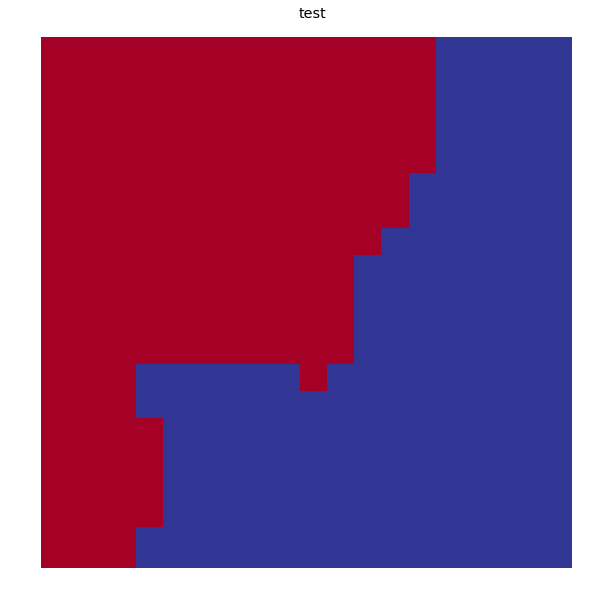

In [52]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

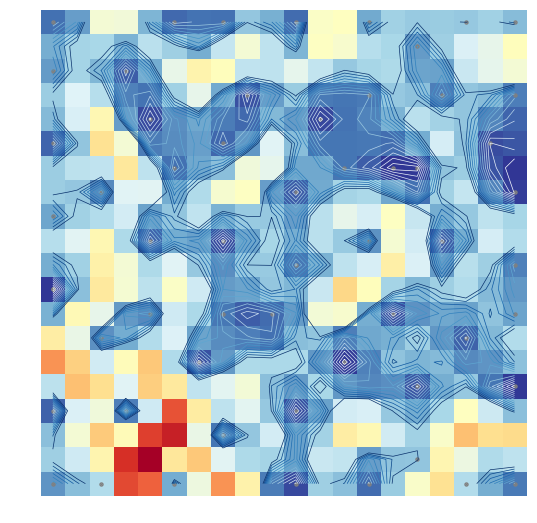

([], array([[0.22270426, 0.3155486 , 0.64400342, 0.63622974, 0.36731093,
         0.21021871, 0.22837341, 0.22346224, 0.41461382, 0.3558684 ,
         0.21444091, 0.67477464, 0.68433686, 0.33922863, 0.4411488 ,
         0.42288125, 0.42465382, 0.41806658, 0.44040481, 0.38522749],
        [0.3505333 , 0.45002809, 0.45906509, 0.36477577, 0.49498115,
         0.43650728, 0.34811158, 0.51493404, 0.64619714, 0.5029588 ,
         0.36663518, 0.68103005, 0.65825265, 0.48326932, 0.45652607,
         0.30982702, 0.43642015, 0.56628766, 0.60102599, 0.69352027],
        [0.30855356, 0.44843863, 0.37434491, 0.18653539, 0.34739527,
         0.6049282 , 0.73239379, 0.69511995, 0.507469  , 0.50248459,
         0.59663565, 0.51170347, 0.41698106, 0.45258236, 0.46759924,
         0.32654752, 0.32386077, 0.52526105, 0.5985652 , 0.64461654],
        [0.43135646, 0.57375423, 0.4830763 , 0.25372953, 0.22739097,
         0.44181456, 0.60329779, 0.3390403 , 0.16501182, 0.31302502,
         0.42644516, 0.2413

In [53]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

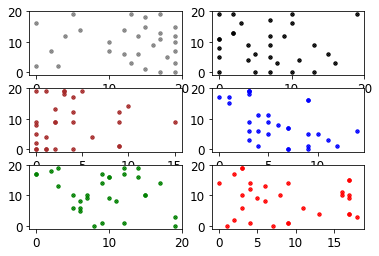

In [54]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


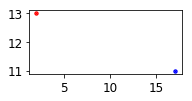

In [55]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 2000 iterations

In [56]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 20,20
      > array size in log10 scale is 5.210586024905156
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.014000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 2000

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1 ---> elapsed time:  0.116000, quantization error: 1.184899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 2 ---> elapsed time:  0.121000, quantization error: 1.021073

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 3 ---> elapsed time:  0.112000, quantization error: 0.936384

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 52 ---> elapsed time:  0.127000, quantization error: 0.883790

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 53 ---> elapsed time:  0.120000, quantization error: 0.883543

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 54 ---> elapsed time:  0.118000, quantization error: 0.883295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 55 ---> elapsed time:  0.118000, quantization error: 0.883048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 56 ---> elapsed time:  0.118000, quantization error: 0.882800

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 57 ---> elapsed time:  0.116000, quantization error: 0.882553

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 106 ---> elapsed time:  0.113000, quantization error: 0.870426

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 107 ---> elapsed time:  0.116000, quantization error: 0.870179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 108 ---> elapsed time:  0.117000, quantization error: 0.869931

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 109 ---> elapsed time:  0.122000, quantization error: 0.869684

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 110 ---> elapsed time:  0.119000, quantization error: 0.869436

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 111 ---> elapsed time:  0.121000, quantization error: 0.869189

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 160 ---> elapsed time:  0.117000, quantization error: 0.857071

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 161 ---> elapsed time:  0.118000, quantization error: 0.856823

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 162 ---> elapsed time:  0.116000, quantization error: 0.856576

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 163 ---> elapsed time:  0.117000, quantization error: 0.856329

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 164 ---> elapsed time:  0.117000, quantization error: 0.856082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 165 ---> elapsed time:  0.116000, quantization error: 0.855835

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 214 ---> elapsed time:  0.117000, quantization error: 0.844426

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 215 ---> elapsed time:  0.138000, quantization error: 0.844176

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 216 ---> elapsed time:  0.137000, quantization error: 0.843926

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 217 ---> elapsed time:  0.121000, quantization error: 0.843676

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 218 ---> elapsed time:  0.117000, quantization error: 0.843426

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 219 ---> elapsed time:  0.117000, quantization error: 0.843176

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 268 ---> elapsed time:  0.113000, quantization error: 0.830938

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 269 ---> elapsed time:  0.118000, quantization error: 0.830689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 270 ---> elapsed time:  0.117000, quantization error: 0.830439

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 271 ---> elapsed time:  0.116000, quantization error: 0.830190

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 272 ---> elapsed time:  0.113000, quantization error: 0.829941

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 273 ---> elapsed time:  0.121000, quantization error: 0.829692

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 322 ---> elapsed time:  0.117000, quantization error: 0.817729

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 323 ---> elapsed time:  0.117000, quantization error: 0.817481

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 324 ---> elapsed time:  0.117000, quantization error: 0.817233

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 325 ---> elapsed time:  0.117000, quantization error: 0.816984

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 326 ---> elapsed time:  0.117000, quantization error: 0.816736

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 327 ---> elapsed time:  0.125000, quantization error: 0.816488

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 376 ---> elapsed time:  0.123000, quantization error: 0.804361

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 377 ---> elapsed time:  0.117000, quantization error: 0.804114

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 378 ---> elapsed time:  0.121000, quantization error: 0.803868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 379 ---> elapsed time:  0.114000, quantization error: 0.803621

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 380 ---> elapsed time:  0.117000, quantization error: 0.803375

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 381 ---> elapsed time:  0.116000, quantization error: 0.803128

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 430 ---> elapsed time:  0.123000, quantization error: 0.790371

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 431 ---> elapsed time:  0.121000, quantization error: 0.790121

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 432 ---> elapsed time:  0.119000, quantization error: 0.789871

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 433 ---> elapsed time:  0.117000, quantization error: 0.789621

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 434 ---> elapsed time:  0.120000, quantization error: 0.789372

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 435 ---> elapsed time:  0.123000, quantization error: 0.789122

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 484 ---> elapsed time:  0.129000, quantization error: 0.777506

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 485 ---> elapsed time:  0.114000, quantization error: 0.777253

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 486 ---> elapsed time:  0.118000, quantization error: 0.776999

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 487 ---> elapsed time:  0.117000, quantization error: 0.776746

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 488 ---> elapsed time:  0.112000, quantization error: 0.776492

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 489 ---> elapsed time:  0.122000, quantization error: 0.776239

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 538 ---> elapsed time:  0.119000, quantization error: 0.763863

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 539 ---> elapsed time:  0.116000, quantization error: 0.763611

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 540 ---> elapsed time:  0.120000, quantization error: 0.763360

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 541 ---> elapsed time:  0.113000, quantization error: 0.763108

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 542 ---> elapsed time:  0.116000, quantization error: 0.762856

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 543 ---> elapsed time:  0.117000, quantization error: 0.762605

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 592 ---> elapsed time:  0.116000, quantization error: 0.748305

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 593 ---> elapsed time:  0.116000, quantization error: 0.748047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 594 ---> elapsed time:  0.117000, quantization error: 0.747790

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 595 ---> elapsed time:  0.117000, quantization error: 0.747533

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 596 ---> elapsed time:  0.117000, quantization error: 0.747275

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 597 ---> elapsed time:  0.121000, quantization error: 0.747018

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 646 ---> elapsed time:  0.143000, quantization error: 0.733808

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 647 ---> elapsed time:  0.116000, quantization error: 0.733552

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 648 ---> elapsed time:  0.119000, quantization error: 0.733296

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 649 ---> elapsed time:  0.121000, quantization error: 0.733040

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 650 ---> elapsed time:  0.119000, quantization error: 0.732785

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 651 ---> elapsed time:  0.118000, quantization error: 0.732529

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 700 ---> elapsed time:  0.117000, quantization error: 0.716970

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 701 ---> elapsed time:  0.117000, quantization error: 0.716705

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 702 ---> elapsed time:  0.119000, quantization error: 0.716440

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 703 ---> elapsed time:  0.117000, quantization error: 0.716175

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 704 ---> elapsed time:  0.118000, quantization error: 0.715910

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 705 ---> elapsed time:  0.118000, quantization error: 0.715645

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 754 ---> elapsed time:  0.119000, quantization error: 0.701063

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 755 ---> elapsed time:  0.121000, quantization error: 0.700795

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 756 ---> elapsed time:  0.120000, quantization error: 0.700527

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 757 ---> elapsed time:  0.119000, quantization error: 0.700259

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 758 ---> elapsed time:  0.114000, quantization error: 0.699992

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 759 ---> elapsed time:  0.123000, quantization error: 0.699724

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 808 ---> elapsed time:  0.122000, quantization error: 0.686808

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 809 ---> elapsed time:  0.120000, quantization error: 0.686531

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 810 ---> elapsed time:  0.118000, quantization error: 0.686255

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 811 ---> elapsed time:  0.116000, quantization error: 0.685979

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 812 ---> elapsed time:  0.116000, quantization error: 0.685702

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 813 ---> elapsed time:  0.116000, quantization error: 0.685426

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 862 ---> elapsed time:  0.116000, quantization error: 0.670080

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 863 ---> elapsed time:  0.120000, quantization error: 0.669800

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 864 ---> elapsed time:  0.119000, quantization error: 0.669520

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 865 ---> elapsed time:  0.129000, quantization error: 0.669240

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 866 ---> elapsed time:  0.118000, quantization error: 0.668960

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 867 ---> elapsed time:  0.118000, quantization error: 0.668680

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 916 ---> elapsed time:  0.116000, quantization error: 0.653194

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 917 ---> elapsed time:  0.117000, quantization error: 0.652897

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 918 ---> elapsed time:  0.117000, quantization error: 0.652599

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 919 ---> elapsed time:  0.116000, quantization error: 0.650226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 920 ---> elapsed time:  0.117000, quantization error: 0.649300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 921 ---> elapsed time:  0.116000, quantization error: 0.648998

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 970 ---> elapsed time:  0.115000, quantization error: 0.634251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 971 ---> elapsed time:  0.116000, quantization error: 0.633951

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 972 ---> elapsed time:  0.124000, quantization error: 0.633651

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 973 ---> elapsed time:  0.114000, quantization error: 0.633351

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 974 ---> elapsed time:  0.114000, quantization error: 0.633051

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 975 ---> elapsed time:  0.119000, quantization error: 0.632751

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 epoch: 1023 ---> elapsed time:  0.116000, quantization error: 0.615706

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1024 ---> elapsed time:  0.113000, quantization error: 0.615393

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1025 ---> elapsed time:  0.119000, quantization error: 0.615079

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1026 ---> elapsed time:  0.113000, quantization error: 0.614766

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1027 ---> elapsed time:  0.116000, quantization error: 0.614453

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1028 ---> elapsed time:  0.116000, quantization error: 0.614140

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1029 ---> elapsed time:  0.115000, quantization error: 0.613827

 fi

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1077 ---> elapsed time:  0.124000, quantization error: 0.596224

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1078 ---> elapsed time:  0.119000, quantization error: 0.595883

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1079 ---> elapsed time:  0.123000, quantization error: 0.595543

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1080 ---> elapsed time:  0.118000, quantization error: 0.595203

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1081 ---> elapsed time:  0.118000, quantization error: 0.594862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1082 ---> elapsed time:  0.114000, quantization error: 0.594522

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 sec

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1130 ---> elapsed time:  0.117000, quantization error: 0.578202

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1131 ---> elapsed time:  0.116000, quantization error: 0.577862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1132 ---> elapsed time:  0.117000, quantization error: 0.577523

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1133 ---> elapsed time:  0.117000, quantization error: 0.577183

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1134 ---> elapsed time:  0.135000, quantization error: 0.576844

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1135 ---> elapsed time:  0.113000, quantization error: 0.576504

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.120000, quantization error: 0.558575

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1184 ---> elapsed time:  0.118000, quantization error: 0.558231

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1185 ---> elapsed time:  0.116000, quantization error: 0.557887

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1186 ---> elapsed time:  0.114000, quantization error: 0.557542

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1187 ---> elapsed time:  0.117000, quantization error: 0.557198

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1188 ---> elapsed time:  0.117000, quantization error: 0.556854

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1189 ---> elapsed time:  0.116000, quantization error: 0.556509

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1237 ---> elapsed time:  0.116000, quantization error: 0.538105

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1238 ---> elapsed time:  0.116000, quantization error: 0.537750

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1239 ---> elapsed time:  0.114000, quantization error: 0.537395

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1240 ---> elapsed time:  0.121000, quantization error: 0.537040

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1241 ---> elapsed time:  0.116000, quantization error: 0.536685

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1242 ---> elapsed time:  0.117000, quantization error: 0.536330

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1290 ---> elapsed time:  0.125000, quantization error: 0.516443

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1291 ---> elapsed time:  0.122000, quantization error: 0.516068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1292 ---> elapsed time:  0.113000, quantization error: 0.515692

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1293 ---> elapsed time:  0.117000, quantization error: 0.515317

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1294 ---> elapsed time:  0.117000, quantization error: 0.514942

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1295 ---> elapsed time:  0.118000, quantization error: 0.514566

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.117000, quantization error: 0.488356

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1344 ---> elapsed time:  0.116000, quantization error: 0.487949

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1345 ---> elapsed time:  0.116000, quantization error: 0.487543

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1346 ---> elapsed time:  0.118000, quantization error: 0.487136

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1347 ---> elapsed time:  0.118000, quantization error: 0.486729

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1348 ---> elapsed time:  0.119000, quantization error: 0.486322

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1349 ---> elapsed time:  0.116000, quantization error: 0.485915

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1397 ---> elapsed time:  0.118000, quantization error: 0.466365

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1398 ---> elapsed time:  0.114000, quantization error: 0.465958

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1399 ---> elapsed time:  0.116000, quantization error: 0.465550

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1400 ---> elapsed time:  0.119000, quantization error: 0.465143

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1401 ---> elapsed time:  0.122000, quantization error: 0.464735

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1402 ---> elapsed time:  0.120000, quantization error: 0.464327

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.002000 sec

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1450 ---> elapsed time:  0.119000, quantization error: 0.441153

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1451 ---> elapsed time:  0.121000, quantization error: 0.440738

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1452 ---> elapsed time:  0.119000, quantization error: 0.440322

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1453 ---> elapsed time:  0.119000, quantization error: 0.439907

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1454 ---> elapsed time:  0.119000, quantization error: 0.439491

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1455 ---> elapsed time:  0.118000, quantization error: 0.439076

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.115000, quantization error: 0.407153

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1504 ---> elapsed time:  0.120000, quantization error: 0.406694

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1505 ---> elapsed time:  0.113000, quantization error: 0.406235

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1506 ---> elapsed time:  0.120000, quantization error: 0.405777

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1507 ---> elapsed time:  0.117000, quantization error: 0.405318

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1508 ---> elapsed time:  0.117000, quantization error: 0.404859

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1509 ---> elapsed time:  0.121000, quantization error: 0.404399

 fi

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1557 ---> elapsed time:  0.126000, quantization error: 0.382296

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1558 ---> elapsed time:  0.113000, quantization error: 0.381366

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1559 ---> elapsed time:  0.113000, quantization error: 0.380894

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1560 ---> elapsed time:  0.119000, quantization error: 0.380422

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1561 ---> elapsed time:  0.116000, quantization error: 0.379950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1562 ---> elapsed time:  0.114000, quantization error: 0.379478

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 sec

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1610 ---> elapsed time:  0.119000, quantization error: 0.355769

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1611 ---> elapsed time:  0.116000, quantization error: 0.355284

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1612 ---> elapsed time:  0.117000, quantization error: 0.354799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1613 ---> elapsed time:  0.131000, quantization error: 0.354315

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1614 ---> elapsed time:  0.121000, quantization error: 0.353830

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1615 ---> elapsed time:  0.124000, quantization error: 0.353345

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.120000, quantization error: 0.316475

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1664 ---> elapsed time:  0.118000, quantization error: 0.315960

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1665 ---> elapsed time:  0.116000, quantization error: 0.315444

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1666 ---> elapsed time:  0.117000, quantization error: 0.314928

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1667 ---> elapsed time:  0.116000, quantization error: 0.314412

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1668 ---> elapsed time:  0.116000, quantization error: 0.313897

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1669 ---> elapsed time:  0.117000, quantization error: 0.313381

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1717 ---> elapsed time:  0.118000, quantization error: 0.288715

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1718 ---> elapsed time:  0.115000, quantization error: 0.283634

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1719 ---> elapsed time:  0.118000, quantization error: 0.283112

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1720 ---> elapsed time:  0.115000, quantization error: 0.282590

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1721 ---> elapsed time:  0.121000, quantization error: 0.282069

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1722 ---> elapsed time:  0.118000, quantization error: 0.281547

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 sec

 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1770 ---> elapsed time:  0.122000, quantization error: 0.239207

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1771 ---> elapsed time:  0.119000, quantization error: 0.238636

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1772 ---> elapsed time:  0.122000, quantization error: 0.238062

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1773 ---> elapsed time:  0.116000, quantization error: 0.235174

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1774 ---> elapsed time:  0.118000, quantization error: 0.234595

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1775 ---> elapsed time:  0.113000, quantization error: 0.234017

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.126000, quantization error: 0.206635

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1824 ---> elapsed time:  0.114000, quantization error: 0.206073

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1825 ---> elapsed time:  0.117000, quantization error: 0.205511

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1826 ---> elapsed time:  0.119000, quantization error: 0.204950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1827 ---> elapsed time:  0.119000, quantization error: 0.204389

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1828 ---> elapsed time:  0.118000, quantization error: 0.203828

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1829 ---> elapsed time:  0.123000, quantization error: 0.203268

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1877 ---> elapsed time:  0.117000, quantization error: 0.176879

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1878 ---> elapsed time:  0.118000, quantization error: 0.176340

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1879 ---> elapsed time:  0.117000, quantization error: 0.175802

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1880 ---> elapsed time:  0.117000, quantization error: 0.175264

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1881 ---> elapsed time:  0.123000, quantization error: 0.174727

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1882 ---> elapsed time:  0.122000, quantization error: 0.174191

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 sec

 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1930 ---> elapsed time:  0.114000, quantization error: 0.142705

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1931 ---> elapsed time:  0.114000, quantization error: 0.142167

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1932 ---> elapsed time:  0.116000, quantization error: 0.141631

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1933 ---> elapsed time:  0.116000, quantization error: 0.141095

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 1934 ---> elapsed time:  0.117000, quantization error: 0.140560

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1935 ---> elapsed time:  0.120000, quantization error: 0.140026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.115000, quantization error: 0.113646

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1984 ---> elapsed time:  0.116000, quantization error: 0.113155

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1985 ---> elapsed time:  0.116000, quantization error: 0.112665

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1986 ---> elapsed time:  0.116000, quantization error: 0.112177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1987 ---> elapsed time:  0.115000, quantization error: 0.111689

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 1988 ---> elapsed time:  0.118000, quantization error: 0.111202

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 1989 ---> elapsed time:  0.113000, quantization error: 0.110716

 fi

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 37 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 38 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 39 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 40 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 41 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 42 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 91 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 92 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 93 ---> elapsed time:  0.122000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 94 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 95 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 96 ---> elapsed time:  0.117000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch:

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 145 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 146 ---> elapsed time:  0.121000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 147 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 148 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 149 ---> elapsed time:  0.121000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 150 ---> elapsed time:  0.124000, quantization error: 0.104962

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 199 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 200 ---> elapsed time:  0.115000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.003000 seconds
 epoch: 201 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 202 ---> elapsed time:  0.119000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 epoch: 203 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 204 ---> elapsed time:  0.124000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.001000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 253 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 254 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 255 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 epoch: 256 ---> elapsed time:  0.114000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 257 ---> elapsed time:  0.120000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 258 ---> elapsed time:  0.116000, quantization error: 0.104962

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.002000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


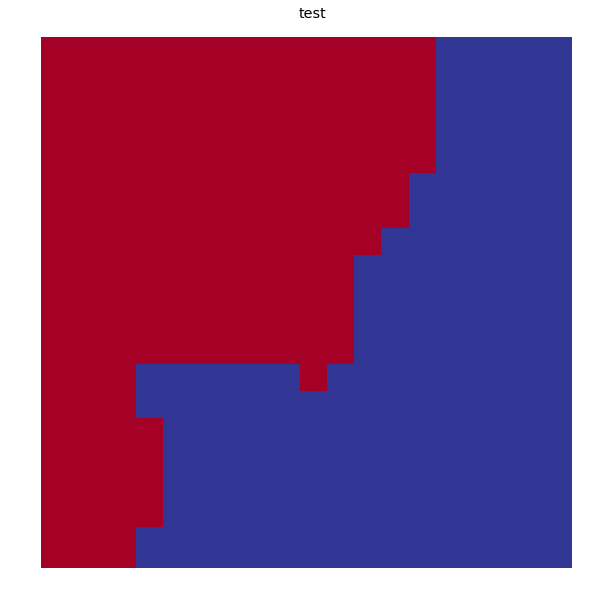

In [57]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

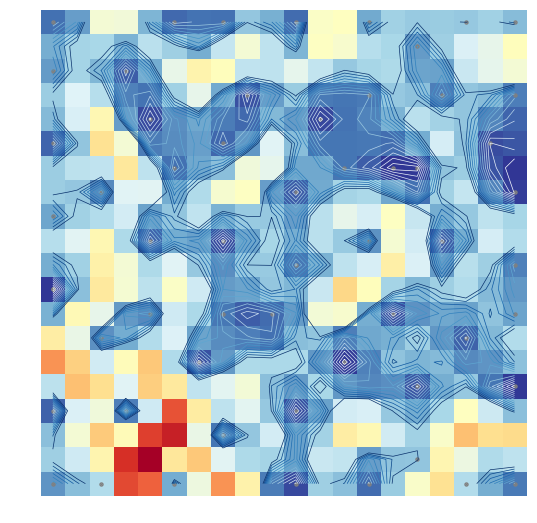

([], array([[0.22270426, 0.3155486 , 0.64400342, 0.63622974, 0.36731093,
         0.21021871, 0.22837341, 0.22346224, 0.41461382, 0.3558684 ,
         0.21444091, 0.67477464, 0.68433686, 0.33922863, 0.4411488 ,
         0.42288125, 0.42465382, 0.41806658, 0.44040481, 0.38522749],
        [0.3505333 , 0.45002809, 0.45906509, 0.36477577, 0.49498115,
         0.43650728, 0.34811158, 0.51493404, 0.64619714, 0.5029588 ,
         0.36663518, 0.68103005, 0.65825265, 0.48326932, 0.45652607,
         0.30982702, 0.43642015, 0.56628766, 0.60102599, 0.69352027],
        [0.30855356, 0.44843863, 0.37434491, 0.18653539, 0.34739527,
         0.6049282 , 0.73239379, 0.69511995, 0.507469  , 0.50248459,
         0.59663565, 0.51170347, 0.41698106, 0.45258236, 0.46759924,
         0.32654752, 0.32386077, 0.52526105, 0.5985652 , 0.64461654],
        [0.43135646, 0.57375423, 0.4830763 , 0.25372953, 0.22739097,
         0.44181456, 0.60329779, 0.3390403 , 0.16501182, 0.31302502,
         0.42644516, 0.2413

In [58]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

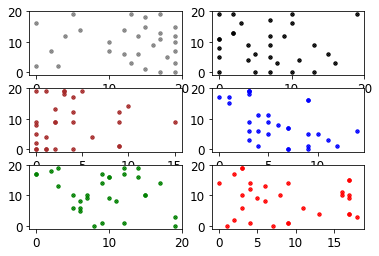

In [59]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


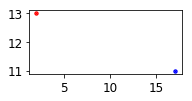

In [60]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

# Map Size 30x30

In [61]:
mapsize = [30,30]

### 500 Iterations 

In [62]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 5.562768543016519
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.023000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 500

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1 ---> elapsed time:  0.155000, quantization error: 1.181285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 2 ---> elapsed time:  0.143000, quantization error: 0.956556

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 3 ---> elapsed time:  0.151000, quantization error: 0.844913

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 52 ---> elapsed time:  0.151000, quantization error: 0.735516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 53 ---> elapsed time:  0.144000, quantization error: 0.734713

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 54 ---> elapsed time:  0.144000, quantization error: 0.733620

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.144000, quantization error: 0.732528

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 56 ---> elapsed time:  0.145000, quantization error: 0.731437

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 57 ---> elapsed time:  0.152000, quantization error: 0.730348

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 58 ---> elapsed time:  0.148000,

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 106 ---> elapsed time:  0.143000, quantization error: 0.667488

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 107 ---> elapsed time:  0.144000, quantization error: 0.666313

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 108 ---> elapsed time:  0.143000, quantization error: 0.665138

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 109 ---> elapsed time:  0.150000, quantization error: 0.663965

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 110 ---> elapsed time:  0.142000, quantization error: 0.662793

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 epoch: 111 ---> elapsed time:  0.172000, quantization error: 0.661622

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 160 ---> elapsed time:  0.147000, quantization error: 0.592986

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.145000, quantization error: 0.591666

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.146000, quantization error: 0.590348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 163 ---> elapsed time:  0.145000, quantization error: 0.589030

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 164 ---> elapsed time:  0.174000, quantization error: 0.587712

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 165 ---> elapsed time:  0.143000, quantization error: 0.586396

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 214 ---> elapsed time:  0.144000, quantization error: 0.508566

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.144000, quantization error: 0.507028

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 216 ---> elapsed time:  0.147000, quantization error: 0.505490

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 217 ---> elapsed time:  0.139000, quantization error: 0.503945

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 218 ---> elapsed time:  0.151000, quantization error: 0.500769

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 219 ---> elapsed time:  0.146000, quantization error: 0.498473

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.144000, quantization error: 0.418952

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 269 ---> elapsed time:  0.143000, quantization error: 0.415870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 270 ---> elapsed time:  0.143000, quantization error: 0.414157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 271 ---> elapsed time:  0.153000, quantization error: 0.412445

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 272 ---> elapsed time:  0.146000, quantization error: 0.410735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 273 ---> elapsed time:  0.145000, quantization error: 0.409025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 322 ---> elapsed time:  0.143000, quantization error: 0.300179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 323 ---> elapsed time:  0.158000, quantization error: 0.298212

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 324 ---> elapsed time:  0.171000, quantization error: 0.296248

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 325 ---> elapsed time:  0.142000, quantization error: 0.294274

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 326 ---> elapsed time:  0.143000, quantization error: 0.290495

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 327 ---> elapsed time:  0.143000, quantization error: 0.287239

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 376 ---> elapsed time:  0.148000, quantization error: 0.176728

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 377 ---> elapsed time:  0.143000, quantization error: 0.174688

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 378 ---> elapsed time:  0.145000, quantization error: 0.172658

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 379 ---> elapsed time:  0.145000, quantization error: 0.170614

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 380 ---> elapsed time:  0.145000, quantization error: 0.166598

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 381 ---> elapsed time:  0.145000, quantization error: 0.162998

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 430 ---> elapsed time:  0.146000, quantization error: 0.059268

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.148000, quantization error: 0.057839

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 432 ---> elapsed time:  0.147000, quantization error: 0.056431

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.145000, quantization error: 0.055042

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 434 ---> elapsed time:  0.146000, quantization error: 0.053675

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.145000, quantization error: 0.052327

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 484 ---> elapsed time:  0.145000, quantization error: 0.007535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.143000, quantization error: 0.007173

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 486 ---> elapsed time:  0.143000, quantization error: 0.006823

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 487 ---> elapsed time:  0.143000, quantization error: 0.006487

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 488 ---> elapsed time:  0.143000, quantization error: 0.006163

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 489 ---> elapsed time:  0.142000, quantization error: 0.005852

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 epoch: 37 ---> elapsed time:  0.141000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 38 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 39 ---> elapsed time:  0.142000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 40 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 41 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.117000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 42 ---> elapsed time:  0.164000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 43 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.146000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 92 ---> elapsed time:  0.145000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 93 ---> elapsed time:  0.142000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 94 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 95 ---> elapsed time:  0.146000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 96 ---> elapsed time:  0.145000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 97 ---> elapsed time:  0.146000, quantization error: 0.002947

 find_bmu took: 0

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 145 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 146 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 147 ---> elapsed time:  0.142000, quantization error: 0.002947

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 148 ---> elapsed time:  0.154000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 149 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 150 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 199 ---> elapsed time:  0.147000, quantization error: 0.002947

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 200 ---> elapsed time:  0.154000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 201 ---> elapsed time:  0.158000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 202 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 203 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 204 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 253 ---> elapsed time:  0.141000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 254 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 255 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 256 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 257 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 258 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 307 ---> elapsed time:  0.175000, quantization error: 0.002947

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 308 ---> elapsed time:  0.145000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 309 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 310 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 311 ---> elapsed time:  0.141000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 312 ---> elapsed time:  0.152000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 361 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 362 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 363 ---> elapsed time:  0.147000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 364 ---> elapsed time:  0.141000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 365 ---> elapsed time:  0.153000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 366 ---> elapsed time:  0.147000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 415 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 416 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 417 ---> elapsed time:  0.153000, quantization error: 0.002947

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 418 ---> elapsed time:  0.188000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 419 ---> elapsed time:  0.163000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 420 ---> elapsed time:  0.142000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 469 ---> elapsed time:  0.142000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 470 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 471 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 472 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 473 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 474 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 523 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 524 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 525 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 526 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 527 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 528 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 577 ---> elapsed time:  0.145000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 578 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 579 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 580 ---> elapsed time:  0.144000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 581 ---> elapsed time:  0.143000, quantization error: 0.002947

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 582 ---> elapsed time:  0.154000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


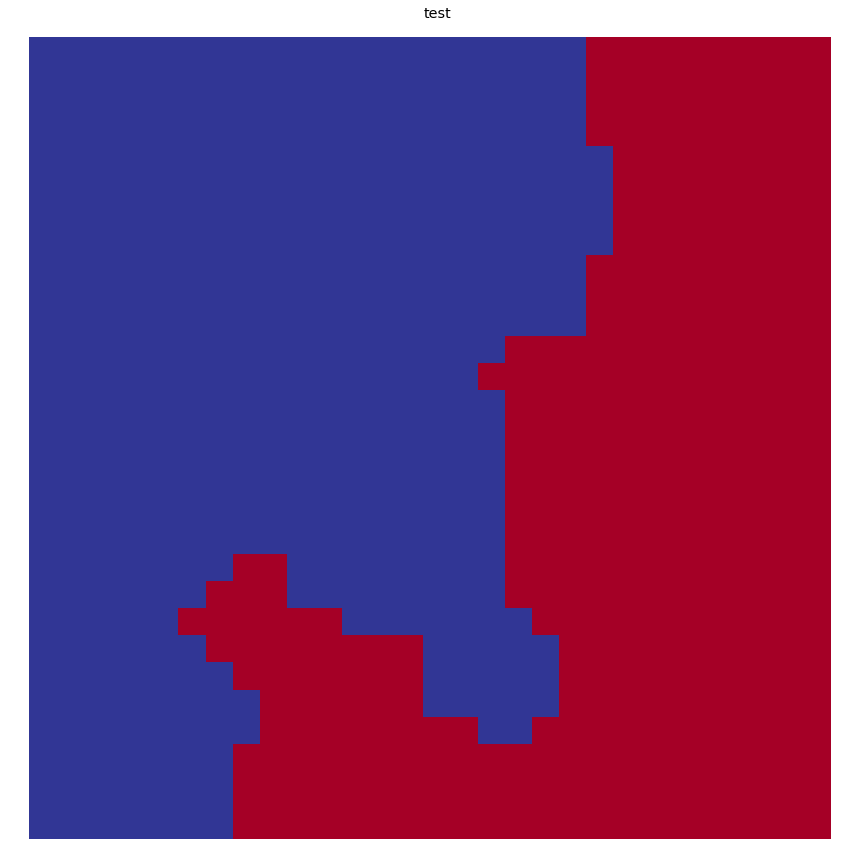

In [63]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

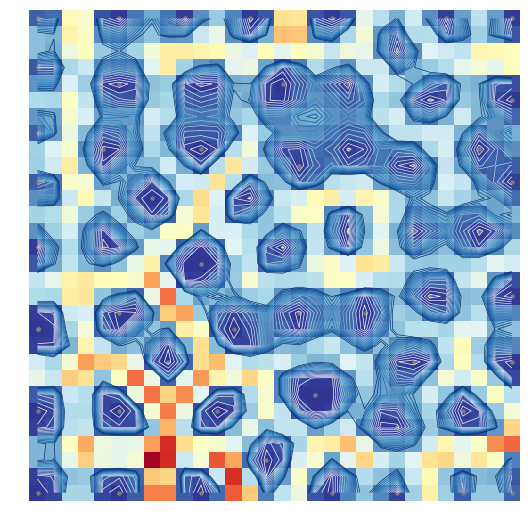

([], array([[9.47386795e-02, 1.21947491e-01, 6.95074386e-01, 6.45954805e-01,
         5.89481967e-02, 1.18154127e-02, 1.44612444e-01, 2.71096879e-01,
         1.40861575e-01, 1.85989627e-02, 1.98683115e-01, 3.67904027e-01,
         1.81220314e-01, 8.17415163e-03, 7.15365684e-02, 8.03476716e-01,
         7.87713505e-01, 6.62944766e-02, 6.80488774e-03, 7.24293490e-02,
         5.75576789e-01, 4.42659730e-01, 2.83625487e-01, 5.10196992e-01,
         2.02662080e-01, 2.31099734e-02, 2.37792006e-01, 4.57976864e-01,
         2.37675633e-01, 1.17190582e-02],
        [3.32853282e-01, 2.99844314e-01, 7.35203675e-01, 6.68211033e-01,
         1.95311623e-01, 1.51809938e-01, 2.58786785e-01, 3.47697460e-01,
         2.12404117e-01, 2.23018140e-01, 4.87071308e-01, 5.82655637e-01,
         2.10089886e-01, 6.17619503e-02, 2.83342061e-01, 8.98045807e-01,
         8.86485112e-01, 1.91726032e-01, 1.54881604e-01, 4.13180437e-01,
         6.22951610e-01, 2.26902382e-01, 8.26539515e-02, 4.28028435e-01,
     

In [64]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

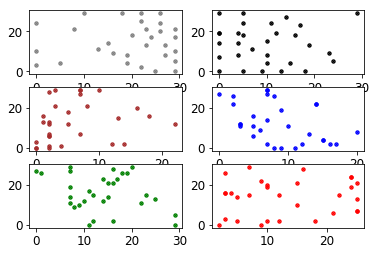

In [65]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


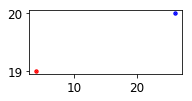

In [66]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 1000 Iterations 

In [67]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 5.562768543016519
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.025000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 1000

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1 ---> elapsed time:  0.143000, quantization error: 1.181285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 2 ---> elapsed time:  0.145000, quantization error: 0.956556

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 3 ---> elapsed time:  0.145000, quantization error: 0.845347

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 52 ---> elapsed time:  0.141000, quantization error: 0.764616

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 53 ---> elapsed time:  0.143000, quantization error: 0.764078

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 54 ---> elapsed time:  0.144000, quantization error: 0.763539

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.143000, quantization error: 0.762138

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 56 ---> elapsed time:  0.144000, quantization error: 0.761252

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 57 ---> elapsed time:  0.143000, quantization error: 0.760711

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 106 ---> elapsed time:  0.146000, quantization error: 0.733677

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 107 ---> elapsed time:  0.144000, quantization error: 0.733132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 108 ---> elapsed time:  0.144000, quantization error: 0.732586

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 109 ---> elapsed time:  0.151000, quantization error: 0.732041

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 110 ---> elapsed time:  0.143000, quantization error: 0.731496

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 111 ---> elapsed time:  0.143000, quantization error: 0.730952

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 160 ---> elapsed time:  0.144000, quantization error: 0.703287

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.143000, quantization error: 0.702728

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.146000, quantization error: 0.702168

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 163 ---> elapsed time:  0.143000, quantization error: 0.701609

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 164 ---> elapsed time:  0.144000, quantization error: 0.701050

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 165 ---> elapsed time:  0.165000, quantization error: 0.698803

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 214 ---> elapsed time:  0.146000, quantization error: 0.665263

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.145000, quantization error: 0.664676

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 216 ---> elapsed time:  0.146000, quantization error: 0.664090

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 217 ---> elapsed time:  0.165000, quantization error: 0.663505

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 218 ---> elapsed time:  0.169000, quantization error: 0.662919

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 219 ---> elapsed time:  0.146000, quantization error: 0.662334

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.143000, quantization error: 0.632044

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 269 ---> elapsed time:  0.147000, quantization error: 0.631462

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 270 ---> elapsed time:  0.152000, quantization error: 0.630875

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 271 ---> elapsed time:  0.148000, quantization error: 0.629631

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 272 ---> elapsed time:  0.145000, quantization error: 0.629034

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 273 ---> elapsed time:  0.156000, quantization error: 0.628438

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 322 ---> elapsed time:  0.142000, quantization error: 0.590559

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 323 ---> elapsed time:  0.145000, quantization error: 0.589900

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 324 ---> elapsed time:  0.146000, quantization error: 0.589242

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 325 ---> elapsed time:  0.146000, quantization error: 0.588584

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 326 ---> elapsed time:  0.146000, quantization error: 0.587926

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 327 ---> elapsed time:  0.147000, quantization error: 0.587268

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 376 ---> elapsed time:  0.142000, quantization error: 0.551630

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 377 ---> elapsed time:  0.143000, quantization error: 0.550941

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 378 ---> elapsed time:  0.143000, quantization error: 0.550252

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 379 ---> elapsed time:  0.143000, quantization error: 0.548919

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 380 ---> elapsed time:  0.144000, quantization error: 0.549344

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 381 ---> elapsed time:  0.143000, quantization error: 0.546821

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 430 ---> elapsed time:  0.175000, quantization error: 0.506173

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.141000, quantization error: 0.505407

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 432 ---> elapsed time:  0.144000, quantization error: 0.504641

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.145000, quantization error: 0.503875

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 434 ---> elapsed time:  0.147000, quantization error: 0.503109

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.141000, quantization error: 0.502344

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.143000, quantization error: 0.461056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.143000, quantization error: 0.460241

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 486 ---> elapsed time:  0.144000, quantization error: 0.458675

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 487 ---> elapsed time:  0.143000, quantization error: 0.456315

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 488 ---> elapsed time:  0.183000, quantization error: 0.455484

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 489 ---> elapsed time:  0.145000, quantization error: 0.454653

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 538 ---> elapsed time:  0.143000, quantization error: 0.414796

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 539 ---> elapsed time:  0.143000, quantization error: 0.413947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 540 ---> elapsed time:  0.143000, quantization error: 0.413098

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 541 ---> elapsed time:  0.139000, quantization error: 0.412250

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 542 ---> elapsed time:  0.140000, quantization error: 0.411398

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 543 ---> elapsed time:  0.140000, quantization error: 0.410777

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 592 ---> elapsed time:  0.146000, quantization error: 0.356123

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 593 ---> elapsed time:  0.145000, quantization error: 0.355161

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 594 ---> elapsed time:  0.151000, quantization error: 0.354195

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 595 ---> elapsed time:  0.145000, quantization error: 0.353040

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 596 ---> elapsed time:  0.140000, quantization error: 0.350343

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 597 ---> elapsed time:  0.143000, quantization error: 0.348741

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 646 ---> elapsed time:  0.144000, quantization error: 0.296819

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 647 ---> elapsed time:  0.149000, quantization error: 0.295834

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 648 ---> elapsed time:  0.143000, quantization error: 0.294844

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 649 ---> elapsed time:  0.143000, quantization error: 0.292047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 650 ---> elapsed time:  0.143000, quantization error: 0.289748

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 651 ---> elapsed time:  0.143000, quantization error: 0.288765

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 700 ---> elapsed time:  0.150000, quantization error: 0.232402

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 701 ---> elapsed time:  0.144000, quantization error: 0.231397

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 702 ---> elapsed time:  0.145000, quantization error: 0.230393

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 703 ---> elapsed time:  0.145000, quantization error: 0.229391

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 704 ---> elapsed time:  0.145000, quantization error: 0.228390

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 705 ---> elapsed time:  0.141000, quantization error: 0.227390

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 754 ---> elapsed time:  0.143000, quantization error: 0.170273

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 755 ---> elapsed time:  0.144000, quantization error: 0.169283

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 756 ---> elapsed time:  0.143000, quantization error: 0.166327

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 757 ---> elapsed time:  0.143000, quantization error: 0.163747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 758 ---> elapsed time:  0.143000, quantization error: 0.162748

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 759 ---> elapsed time:  0.143000, quantization error: 0.161753

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 808 ---> elapsed time:  0.145000, quantization error: 0.102220

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 809 ---> elapsed time:  0.145000, quantization error: 0.100847

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 810 ---> elapsed time:  0.145000, quantization error: 0.099347

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 811 ---> elapsed time:  0.155000, quantization error: 0.098526

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 812 ---> elapsed time:  0.153000, quantization error: 0.097021

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 813 ---> elapsed time:  0.147000, quantization error: 0.096300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 862 ---> elapsed time:  0.146000, quantization error: 0.055528

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 863 ---> elapsed time:  0.146000, quantization error: 0.054845

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 864 ---> elapsed time:  0.155000, quantization error: 0.054167

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 865 ---> elapsed time:  0.165000, quantization error: 0.053494

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 866 ---> elapsed time:  0.146000, quantization error: 0.052827

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 867 ---> elapsed time:  0.146000, quantization error: 0.052164

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 916 ---> elapsed time:  0.145000, quantization error: 0.024514

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 917 ---> elapsed time:  0.151000, quantization error: 0.024096

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 918 ---> elapsed time:  0.161000, quantization error: 0.023683

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 919 ---> elapsed time:  0.146000, quantization error: 0.023274

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 920 ---> elapsed time:  0.145000, quantization error: 0.022871

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 921 ---> elapsed time:  0.145000, quantization error: 0.022473

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 970 ---> elapsed time:  0.142000, quantization error: 0.007139

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 971 ---> elapsed time:  0.143000, quantization error: 0.006965

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 972 ---> elapsed time:  0.175000, quantization error: 0.006795

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 973 ---> elapsed time:  0.157000, quantization error: 0.006628

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 974 ---> elapsed time:  0.142000, quantization error: 0.006464

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 975 ---> elapsed time:  0.143000, quantization error: 0.006302

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 23 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 24 ---> elapsed time:  0.151000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 25 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 26 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 27 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 28 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 29 ---> elapsed time:  0.146000,

 update_codebook_voronoi took: 0.006000 seconds
 epoch: 77 ---> elapsed time:  0.162000, quantization error: 0.002868

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 78 ---> elapsed time:  0.151000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 79 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 80 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 81 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 82 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 83 ---> elapsed time:  0.145000,

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 131 ---> elapsed time:  0.147000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 132 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 133 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 134 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 135 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 136 ---> elapsed time:  0.141000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 185 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 186 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 187 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 188 ---> elapsed time:  0.166000, quantization error: 0.002868

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 189 ---> elapsed time:  0.163000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 190 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 239 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 240 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 241 ---> elapsed time:  0.163000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 242 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 243 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 244 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 293 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 294 ---> elapsed time:  0.156000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 295 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 296 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 297 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 298 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 347 ---> elapsed time:  0.141000, quantization error: 0.002868

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 348 ---> elapsed time:  0.152000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 349 ---> elapsed time:  0.140000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 350 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 351 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 352 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 401 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 402 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 403 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 404 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 405 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 406 ---> elapsed time:  0.141000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 455 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 456 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 457 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 458 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 459 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 460 ---> elapsed time:  0.169000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 509 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 510 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 511 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 512 ---> elapsed time:  0.159000, quantization error: 0.002868

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 513 ---> elapsed time:  0.182000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 514 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 563 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 564 ---> elapsed time:  0.147000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 565 ---> elapsed time:  0.181000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 566 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 567 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 568 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 617 ---> elapsed time:  0.140000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 618 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 619 ---> elapsed time:  0.139000, quantization error: 0.002868

 find_bmu took: 0.120000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 620 ---> elapsed time:  0.162000, quantization error: 0.002868

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 621 ---> elapsed time:  0.147000, quantization error: 0.002868

 --------------------------------------------------------------
 Final quantization error: 0.002868
 train took: 245.611000 seconds


/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


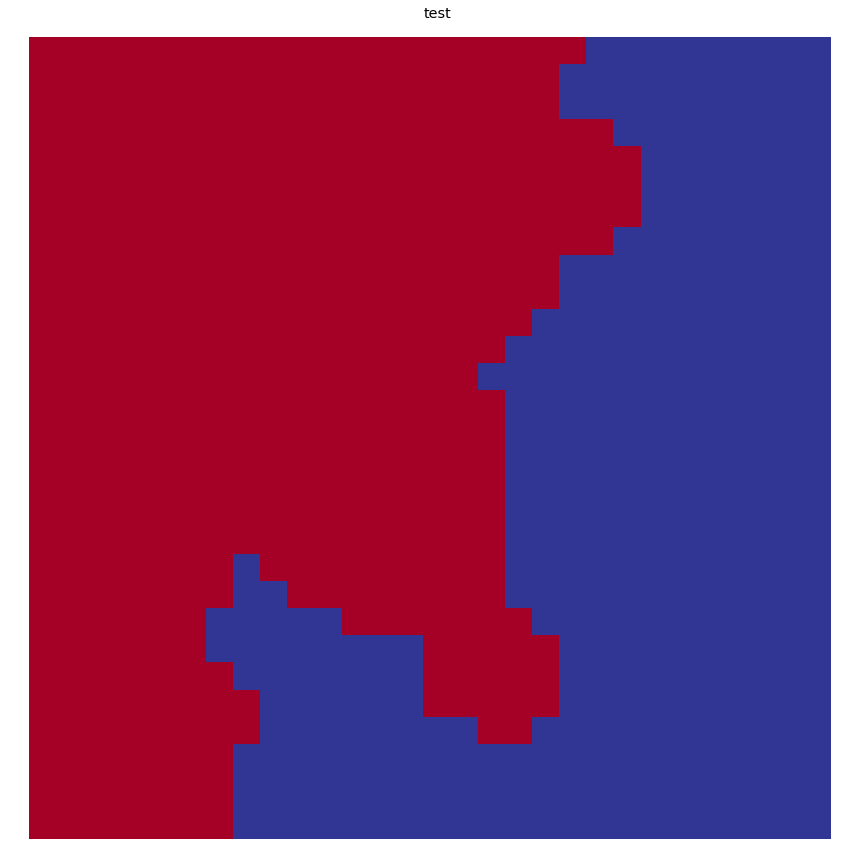

In [68]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

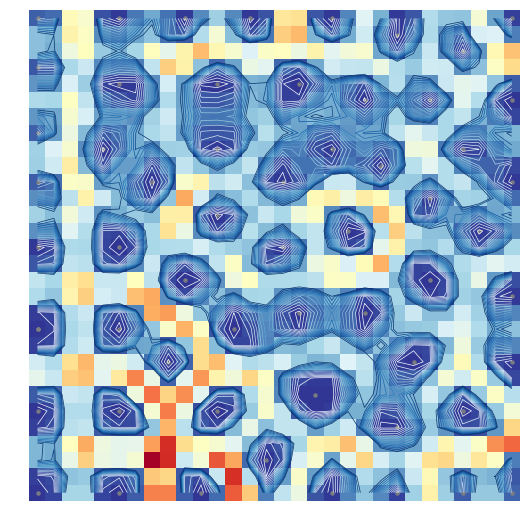

([], array([[9.47386795e-02, 1.21947491e-01, 6.95074386e-01, 6.45954805e-01,
         5.89481967e-02, 1.18155120e-02, 1.44615747e-01, 2.70853359e-01,
         1.38506544e-01, 1.29002581e-02, 1.91479599e-01, 3.81439609e-01,
         1.87650234e-01, 8.01944225e-03, 6.45057535e-02, 7.85134158e-01,
         8.06814509e-01, 7.21634029e-02, 6.82603647e-03, 1.80828468e-01,
         5.49954293e-01, 2.92242989e-01, 1.47078215e-02, 7.23279279e-02,
         4.27232444e-01, 3.55172817e-01, 3.44219523e-01, 6.34219893e-01,
         2.51530142e-01, 2.40726787e-02],
        [3.32853282e-01, 2.99844314e-01, 7.35203675e-01, 6.68211033e-01,
         1.95311623e-01, 1.51811718e-01, 2.58999892e-01, 3.44315715e-01,
         1.29059108e-01, 8.08522735e-02, 4.30222912e-01, 6.33343011e-01,
         3.30493627e-01, 5.80495364e-02, 1.46341242e-01, 8.64985598e-01,
         9.21031304e-01, 2.99649665e-01, 7.10442922e-02, 2.74743425e-01,
         5.08559527e-01, 1.50083034e-01, 8.59650731e-03, 1.24179982e-01,
     

In [69]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

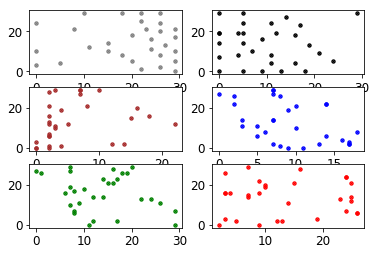

In [70]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


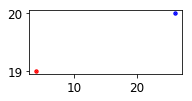

In [71]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 2000 Iterations 

In [72]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 30,30
      > array size in log10 scale is 5.562768543016519
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.033000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 2000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1 ---> elapsed time:  0.140000, quantization error: 1.181285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 2 ---> elapsed time:  0.153000, quantization error: 0.956556

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 3 ---> elapsed time:  0.156000, quantization error: 0.845563

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 52 ---> elapsed time:  0.144000, quantization error: 0.782695

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 53 ---> elapsed time:  0.143000, quantization error: 0.782428

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 54 ---> elapsed time:  0.145000, quantization error: 0.782161

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 55 ---> elapsed time:  0.143000, quantization error: 0.781894

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 56 ---> elapsed time:  0.146000, quantization error: 0.781628

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 57 ---> elapsed time:  0.144000, quantization error: 0.781361

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 106 ---> elapsed time:  0.143000, quantization error: 0.763553

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 107 ---> elapsed time:  0.143000, quantization error: 0.762422

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 108 ---> elapsed time:  0.143000, quantization error: 0.761807

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 109 ---> elapsed time:  0.160000, quantization error: 0.761537

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 110 ---> elapsed time:  0.144000, quantization error: 0.761266

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 111 ---> elapsed time:  0.140000, quantization error: 0.760996

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 160 ---> elapsed time:  0.145000, quantization error: 0.747820

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 161 ---> elapsed time:  0.145000, quantization error: 0.747553

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 162 ---> elapsed time:  0.149000, quantization error: 0.747285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 163 ---> elapsed time:  0.145000, quantization error: 0.747018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 164 ---> elapsed time:  0.143000, quantization error: 0.746751

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 165 ---> elapsed time:  0.143000, quantization error: 0.746483

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 214 ---> elapsed time:  0.146000, quantization error: 0.732615

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 215 ---> elapsed time:  0.169000, quantization error: 0.732343

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 216 ---> elapsed time:  0.144000, quantization error: 0.732070

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 217 ---> elapsed time:  0.144000, quantization error: 0.731798

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 218 ---> elapsed time:  0.145000, quantization error: 0.731526

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 219 ---> elapsed time:  0.142000, quantization error: 0.731254

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 268 ---> elapsed time:  0.144000, quantization error: 0.717058

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 269 ---> elapsed time:  0.143000, quantization error: 0.716779

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 270 ---> elapsed time:  0.143000, quantization error: 0.716500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 271 ---> elapsed time:  0.144000, quantization error: 0.716221

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 272 ---> elapsed time:  0.144000, quantization error: 0.715943

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 273 ---> elapsed time:  0.143000, quantization error: 0.715664

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 322 ---> elapsed time:  0.160000, quantization error: 0.702213

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 323 ---> elapsed time:  0.179000, quantization error: 0.701933

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 324 ---> elapsed time:  0.149000, quantization error: 0.701654

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 325 ---> elapsed time:  0.145000, quantization error: 0.701375

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 326 ---> elapsed time:  0.153000, quantization error: 0.701095

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 327 ---> elapsed time:  0.145000, quantization error: 0.699132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 376 ---> elapsed time:  0.144000, quantization error: 0.682297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 377 ---> elapsed time:  0.147000, quantization error: 0.682007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 378 ---> elapsed time:  0.158000, quantization error: 0.681718

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 379 ---> elapsed time:  0.146000, quantization error: 0.681427

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 380 ---> elapsed time:  0.140000, quantization error: 0.680685

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 381 ---> elapsed time:  0.145000, quantization error: 0.680391

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 430 ---> elapsed time:  0.143000, quantization error: 0.664153

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 431 ---> elapsed time:  0.143000, quantization error: 0.663860

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 432 ---> elapsed time:  0.143000, quantization error: 0.663568

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 433 ---> elapsed time:  0.143000, quantization error: 0.663275

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 434 ---> elapsed time:  0.143000, quantization error: 0.662983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 435 ---> elapsed time:  0.144000, quantization error: 0.662690

 find_bmu took: 0.117000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 484 ---> elapsed time:  0.143000, quantization error: 0.647634

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 485 ---> elapsed time:  0.143000, quantization error: 0.647341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 486 ---> elapsed time:  0.143000, quantization error: 0.647048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 487 ---> elapsed time:  0.142000, quantization error: 0.646756

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 488 ---> elapsed time:  0.143000, quantization error: 0.646463

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 489 ---> elapsed time:  0.143000, quantization error: 0.646171

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 538 ---> elapsed time:  0.146000, quantization error: 0.630307

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 539 ---> elapsed time:  0.143000, quantization error: 0.630009

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 540 ---> elapsed time:  0.148000, quantization error: 0.629711

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 541 ---> elapsed time:  0.181000, quantization error: 0.629413

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 542 ---> elapsed time:  0.143000, quantization error: 0.629115

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 543 ---> elapsed time:  0.142000, quantization error: 0.628817

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 592 ---> elapsed time:  0.159000, quantization error: 0.610536

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 593 ---> elapsed time:  0.146000, quantization error: 0.610221

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 594 ---> elapsed time:  0.163000, quantization error: 0.609905

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 595 ---> elapsed time:  0.145000, quantization error: 0.609589

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 596 ---> elapsed time:  0.147000, quantization error: 0.609274

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 597 ---> elapsed time:  0.146000, quantization error: 0.608958

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 646 ---> elapsed time:  0.139000, quantization error: 0.589348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 647 ---> elapsed time:  0.143000, quantization error: 0.589019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 648 ---> elapsed time:  0.144000, quantization error: 0.588690

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 649 ---> elapsed time:  0.142000, quantization error: 0.588361

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 650 ---> elapsed time:  0.143000, quantization error: 0.588033

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 651 ---> elapsed time:  0.143000, quantization error: 0.587704

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 700 ---> elapsed time:  0.143000, quantization error: 0.570687

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 701 ---> elapsed time:  0.144000, quantization error: 0.570356

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 702 ---> elapsed time:  0.143000, quantization error: 0.570026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 703 ---> elapsed time:  0.143000, quantization error: 0.569694

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 704 ---> elapsed time:  0.144000, quantization error: 0.569088

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 705 ---> elapsed time:  0.187000, quantization error: 0.567990

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 754 ---> elapsed time:  0.145000, quantization error: 0.550382

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 755 ---> elapsed time:  0.144000, quantization error: 0.550034

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 756 ---> elapsed time:  0.145000, quantization error: 0.549053

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 757 ---> elapsed time:  0.146000, quantization error: 0.549840

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 758 ---> elapsed time:  0.142000, quantization error: 0.547679

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 759 ---> elapsed time:  0.153000, quantization error: 0.545057

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 808 ---> elapsed time:  0.146000, quantization error: 0.525925

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 809 ---> elapsed time:  0.146000, quantization error: 0.525560

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 810 ---> elapsed time:  0.146000, quantization error: 0.525195

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.010000 seconds
 epoch: 811 ---> elapsed time:  0.157000, quantization error: 0.524830

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 812 ---> elapsed time:  0.144000, quantization error: 0.524465

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 813 ---> elapsed time:  0.145000, quantization error: 0.524100

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 862 ---> elapsed time:  0.147000, quantization error: 0.504806

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 863 ---> elapsed time:  0.144000, quantization error: 0.504423

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 864 ---> elapsed time:  0.142000, quantization error: 0.504040

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 865 ---> elapsed time:  0.159000, quantization error: 0.503657

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 866 ---> elapsed time:  0.146000, quantization error: 0.503275

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 867 ---> elapsed time:  0.141000, quantization error: 0.502892

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 916 ---> elapsed time:  0.150000, quantization error: 0.481374

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 917 ---> elapsed time:  0.154000, quantization error: 0.480971

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 918 ---> elapsed time:  0.174000, quantization error: 0.480569

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 919 ---> elapsed time:  0.145000, quantization error: 0.480166

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 920 ---> elapsed time:  0.145000, quantization error: 0.479763

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 921 ---> elapsed time:  0.144000, quantization error: 0.479361

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 970 ---> elapsed time:  0.145000, quantization error: 0.458375

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 971 ---> elapsed time:  0.148000, quantization error: 0.457970

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 972 ---> elapsed time:  0.144000, quantization error: 0.457565

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 973 ---> elapsed time:  0.143000, quantization error: 0.457160

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 974 ---> elapsed time:  0.146000, quantization error: 0.456755

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 975 ---> elapsed time:  0.145000, quantization error: 0.456350

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 epoch: 1023 ---> elapsed time:  0.152000, quantization error: 0.437993

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1024 ---> elapsed time:  0.140000, quantization error: 0.437585

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1025 ---> elapsed time:  0.144000, quantization error: 0.437177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1026 ---> elapsed time:  0.144000, quantization error: 0.436768

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1027 ---> elapsed time:  0.143000, quantization error: 0.436360

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1028 ---> elapsed time:  0.147000, quantization error: 0.435952

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1029 ---> elapsed time:  0.145000, quantization error: 0.435544

 fi

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1077 ---> elapsed time:  0.176000, quantization error: 0.413091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1078 ---> elapsed time:  0.143000, quantization error: 0.412658

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1079 ---> elapsed time:  0.144000, quantization error: 0.412225

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1080 ---> elapsed time:  0.142000, quantization error: 0.411792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1081 ---> elapsed time:  0.143000, quantization error: 0.411360

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1082 ---> elapsed time:  0.143000, quantization error: 0.410927

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.017000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1130 ---> elapsed time:  0.143000, quantization error: 0.386552

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1131 ---> elapsed time:  0.142000, quantization error: 0.386086

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1132 ---> elapsed time:  0.144000, quantization error: 0.385621

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1133 ---> elapsed time:  0.144000, quantization error: 0.385156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1134 ---> elapsed time:  0.143000, quantization error: 0.384690

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1135 ---> elapsed time:  0.143000, quantization error: 0.384225

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.146000, quantization error: 0.356178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1184 ---> elapsed time:  0.148000, quantization error: 0.355705

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1185 ---> elapsed time:  0.144000, quantization error: 0.355230

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1186 ---> elapsed time:  0.144000, quantization error: 0.354584

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1187 ---> elapsed time:  0.143000, quantization error: 0.352399

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1188 ---> elapsed time:  0.144000, quantization error: 0.351289

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1189 ---> elapsed time:  0.154000, quantization error: 0.350803

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1237 ---> elapsed time:  0.145000, quantization error: 0.324211

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1238 ---> elapsed time:  0.143000, quantization error: 0.323715

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1239 ---> elapsed time:  0.143000, quantization error: 0.323221

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1240 ---> elapsed time:  0.143000, quantization error: 0.322726

 find_bmu took: 0.123000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1241 ---> elapsed time:  0.173000, quantization error: 0.322231

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1242 ---> elapsed time:  0.144000, quantization error: 0.321737

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1290 ---> elapsed time:  0.145000, quantization error: 0.297136

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1291 ---> elapsed time:  0.144000, quantization error: 0.296644

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1292 ---> elapsed time:  0.144000, quantization error: 0.296151

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1293 ---> elapsed time:  0.144000, quantization error: 0.295659

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1294 ---> elapsed time:  0.152000, quantization error: 0.295166

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1295 ---> elapsed time:  0.143000, quantization error: 0.292865

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.145000, quantization error: 0.263867

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1344 ---> elapsed time:  0.146000, quantization error: 0.263372

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1345 ---> elapsed time:  0.141000, quantization error: 0.262878

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1346 ---> elapsed time:  0.143000, quantization error: 0.262384

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1347 ---> elapsed time:  0.161000, quantization error: 0.261890

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1348 ---> elapsed time:  0.143000, quantization error: 0.261396

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1349 ---> elapsed time:  0.143000, quantization error: 0.260903

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1397 ---> elapsed time:  0.145000, quantization error: 0.233256

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1398 ---> elapsed time:  0.140000, quantization error: 0.232753

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1399 ---> elapsed time:  0.143000, quantization error: 0.232250

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1400 ---> elapsed time:  0.146000, quantization error: 0.231748

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1401 ---> elapsed time:  0.145000, quantization error: 0.231246

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1402 ---> elapsed time:  0.145000, quantization error: 0.230744

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1450 ---> elapsed time:  0.144000, quantization error: 0.199378

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1451 ---> elapsed time:  0.143000, quantization error: 0.198849

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1452 ---> elapsed time:  0.142000, quantization error: 0.198321

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1453 ---> elapsed time:  0.143000, quantization error: 0.197793

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1454 ---> elapsed time:  0.143000, quantization error: 0.197266

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1455 ---> elapsed time:  0.143000, quantization error: 0.196739

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.146000, quantization error: 0.172137

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1504 ---> elapsed time:  0.146000, quantization error: 0.171640

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 1505 ---> elapsed time:  0.157000, quantization error: 0.171143

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1506 ---> elapsed time:  0.157000, quantization error: 0.170646

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1507 ---> elapsed time:  0.153000, quantization error: 0.170151

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1508 ---> elapsed time:  0.148000, quantization error: 0.169656

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 1509 ---> elapsed time:  0.144000, quantization error: 0.169159

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1557 ---> elapsed time:  0.145000, quantization error: 0.140561

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1558 ---> elapsed time:  0.145000, quantization error: 0.140090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1559 ---> elapsed time:  0.146000, quantization error: 0.139620

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1560 ---> elapsed time:  0.145000, quantization error: 0.139150

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1561 ---> elapsed time:  0.145000, quantization error: 0.138681

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1562 ---> elapsed time:  0.145000, quantization error: 0.138213

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1610 ---> elapsed time:  0.143000, quantization error: 0.106528

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1611 ---> elapsed time:  0.139000, quantization error: 0.103973

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1612 ---> elapsed time:  0.143000, quantization error: 0.103092

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1613 ---> elapsed time:  0.146000, quantization error: 0.102056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1614 ---> elapsed time:  0.147000, quantization error: 0.101587

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1615 ---> elapsed time:  0.145000, quantization error: 0.101119

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.142000, quantization error: 0.078300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1664 ---> elapsed time:  0.143000, quantization error: 0.077883

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1665 ---> elapsed time:  0.144000, quantization error: 0.077467

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1666 ---> elapsed time:  0.144000, quantization error: 0.077052

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1667 ---> elapsed time:  0.145000, quantization error: 0.076638

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1668 ---> elapsed time:  0.144000, quantization error: 0.076225

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1669 ---> elapsed time:  0.144000, quantization error: 0.075814

 fi

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1717 ---> elapsed time:  0.149000, quantization error: 0.057557

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1718 ---> elapsed time:  0.146000, quantization error: 0.057208

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1719 ---> elapsed time:  0.144000, quantization error: 0.056860

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1720 ---> elapsed time:  0.143000, quantization error: 0.056513

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1721 ---> elapsed time:  0.144000, quantization error: 0.056168

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1722 ---> elapsed time:  0.143000, quantization error: 0.055823

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.007000 sec

 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1770 ---> elapsed time:  0.143000, quantization error: 0.039900

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1771 ---> elapsed time:  0.144000, quantization error: 0.039617

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1772 ---> elapsed time:  0.145000, quantization error: 0.039335

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1773 ---> elapsed time:  0.145000, quantization error: 0.039054

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1774 ---> elapsed time:  0.146000, quantization error: 0.038775

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1775 ---> elapsed time:  0.146000, quantization error: 0.038497

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.171000, quantization error: 0.026215

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1824 ---> elapsed time:  0.144000, quantization error: 0.025996

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1825 ---> elapsed time:  0.143000, quantization error: 0.025778

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1826 ---> elapsed time:  0.144000, quantization error: 0.025561

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1827 ---> elapsed time:  0.146000, quantization error: 0.025345

 find_bmu took: 0.118000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 1828 ---> elapsed time:  0.175000, quantization error: 0.025131

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1829 ---> elapsed time:  0.151000, quantization error: 0.024918

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1877 ---> elapsed time:  0.144000, quantization error: 0.015660

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1878 ---> elapsed time:  0.143000, quantization error: 0.015506

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1879 ---> elapsed time:  0.143000, quantization error: 0.015353

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1880 ---> elapsed time:  0.144000, quantization error: 0.015201

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1881 ---> elapsed time:  0.144000, quantization error: 0.015050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 1882 ---> elapsed time:  0.143000, quantization error: 0.014901

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 sec

 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1930 ---> elapsed time:  0.143000, quantization error: 0.007956

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1931 ---> elapsed time:  0.143000, quantization error: 0.007861

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1932 ---> elapsed time:  0.143000, quantization error: 0.007768

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1933 ---> elapsed time:  0.142000, quantization error: 0.007675

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1934 ---> elapsed time:  0.161000, quantization error: 0.007583

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1935 ---> elapsed time:  0.157000, quantization error: 0.007492

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.147000, quantization error: 0.003764

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1984 ---> elapsed time:  0.146000, quantization error: 0.003710

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.004000 seconds
 epoch: 1985 ---> elapsed time:  0.153000, quantization error: 0.003655

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.008000 seconds
 epoch: 1986 ---> elapsed time:  0.216000, quantization error: 0.003602

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 1987 ---> elapsed time:  0.151000, quantization error: 0.003549

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1988 ---> elapsed time:  0.146000, quantization error: 0.003496

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 1989 ---> elapsed time:  0.166000, quantization error: 0.003445

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 37 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 38 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 39 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 40 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 41 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 42 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 91 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 92 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 93 ---> elapsed time:  0.148000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 94 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 95 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 96 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 145 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 146 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 147 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 148 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 149 ---> elapsed time:  0.141000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 150 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 199 ---> elapsed time:  0.153000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 200 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 201 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 202 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 203 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 204 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 253 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 254 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 255 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 256 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.112000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 257 ---> elapsed time:  0.173000, quantization error: 0.002868

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 258 ---> elapsed time:  0.168000, quantization error: 0.002868

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 307 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 308 ---> elapsed time:  0.141000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 309 ---> elapsed time:  0.161000, quantization error: 0.002868

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 310 ---> elapsed time:  0.162000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 311 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 312 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 361 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 362 ---> elapsed time:  0.159000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 363 ---> elapsed time:  0.149000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 364 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 365 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 366 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 415 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 416 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 417 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 418 ---> elapsed time:  0.147000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 419 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 420 ---> elapsed time:  0.147000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 469 ---> elapsed time:  0.144000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.006000 seconds
 epoch: 470 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 471 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 472 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 473 ---> elapsed time:  0.142000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 474 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 523 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 524 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 525 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 526 ---> elapsed time:  0.158000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 527 ---> elapsed time:  0.143000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.007000 seconds
 epoch: 528 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 577 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 578 ---> elapsed time:  0.145000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 epoch: 579 ---> elapsed time:  0.146000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 580 ---> elapsed time:  0.155000, quantization error: 0.002868

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 581 ---> elapsed time:  0.160000, quantization error: 0.002868

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.009000 seconds
 epoch: 582 ---> elapsed time:  0.163000, quantization error: 0.002868

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.005000 seconds
 

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


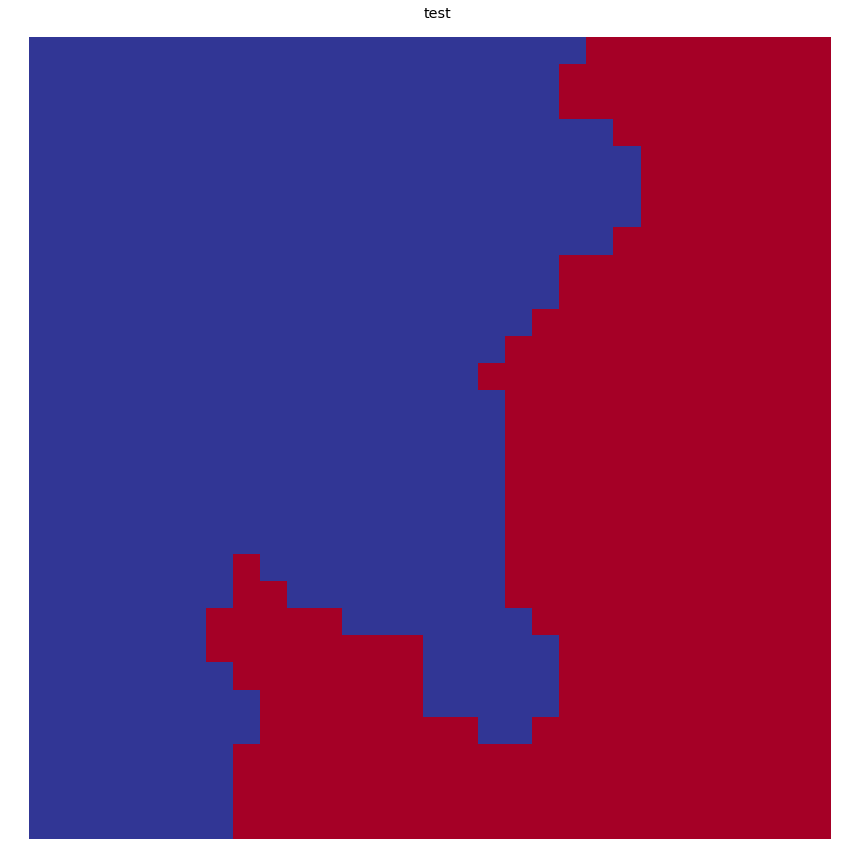

In [73]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

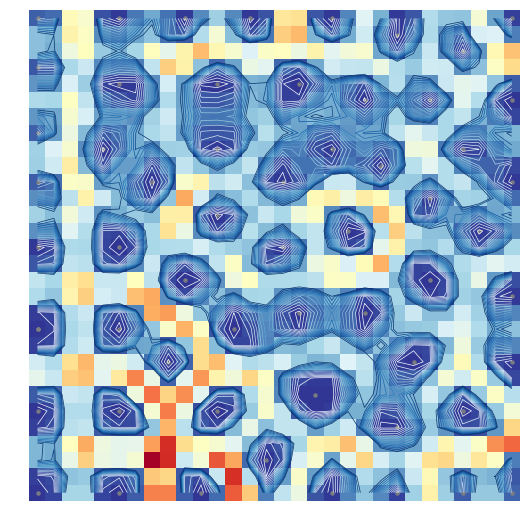

([], array([[9.47386795e-02, 1.21947491e-01, 6.95074386e-01, 6.45954805e-01,
         5.89481967e-02, 1.18155120e-02, 1.44615747e-01, 2.70853359e-01,
         1.38506544e-01, 1.29002581e-02, 1.91479599e-01, 3.81439609e-01,
         1.87650234e-01, 8.01944225e-03, 6.45057535e-02, 7.85134158e-01,
         8.06814509e-01, 7.21634029e-02, 6.82603647e-03, 1.80828468e-01,
         5.49954293e-01, 2.92242989e-01, 1.47078215e-02, 7.23279279e-02,
         4.27232444e-01, 3.55172817e-01, 3.44219523e-01, 6.34219893e-01,
         2.51530142e-01, 2.40726787e-02],
        [3.32853282e-01, 2.99844314e-01, 7.35203675e-01, 6.68211033e-01,
         1.95311623e-01, 1.51811718e-01, 2.58999892e-01, 3.44315715e-01,
         1.29059108e-01, 8.08522735e-02, 4.30222912e-01, 6.33343011e-01,
         3.30493627e-01, 5.80495364e-02, 1.46341242e-01, 8.64985598e-01,
         9.21031304e-01, 2.99649665e-01, 7.10442922e-02, 2.74743425e-01,
         5.08559527e-01, 1.50083034e-01, 8.59650731e-03, 1.24179982e-01,
     

In [74]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

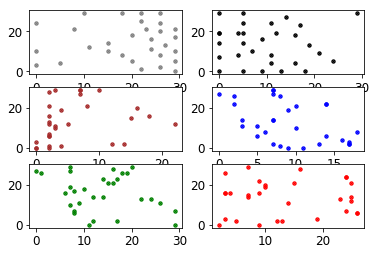

In [75]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


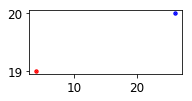

In [76]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

# Map Size 50x50

In [77]:
mapsize = [50,50]

### 500 Iterations 

In [78]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.006466042249231
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.050000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1 ---> elapsed time:  0.352000, quantization error: 1.179233

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 2 ---> elapsed time:  0.332000, quantization error: 0.960808

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.053000 seconds
 epoch: 3 ---> elapsed time:  0.338000, quantization error: 0.855735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.029000 seconds
 epoch: 52 ---> elapsed time:  0.332000, quantization error: 0.760948

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 53 ---> elapsed time:  0.322000, quantization error: 0.759816

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 54 ---> elapsed time:  0.325000, quantization error: 0.758803

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 55 ---> elapsed time:  0.344000, quantization error: 0.757669

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 56 ---> elapsed time:  0.318000, quantization error: 0.756535

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 57 ---> elapsed time:  0.323000, quantization error: 0.755402

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 58 ---> elapsed time:  0.335000,

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 106 ---> elapsed time:  0.328000, quantization error: 0.695133

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 107 ---> elapsed time:  0.320000, quantization error: 0.693907

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 108 ---> elapsed time:  0.322000, quantization error: 0.692677

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 109 ---> elapsed time:  0.338000, quantization error: 0.690601

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 110 ---> elapsed time:  0.323000, quantization error: 0.689135

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 111 ---> elapsed time:  0.320000, quantization error: 0.687499

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 160 ---> elapsed time:  0.322000, quantization error: 0.619339

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 161 ---> elapsed time:  0.349000, quantization error: 0.617809

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 162 ---> elapsed time:  0.318000, quantization error: 0.616397

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 163 ---> elapsed time:  0.317000, quantization error: 0.615057

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 164 ---> elapsed time:  0.343000, quantization error: 0.613866

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 165 ---> elapsed time:  0.319000, quantization error: 0.612301

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 214 ---> elapsed time:  0.317000, quantization error: 0.533506

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 215 ---> elapsed time:  0.315000, quantization error: 0.531407

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 216 ---> elapsed time:  0.325000, quantization error: 0.529816

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 217 ---> elapsed time:  0.320000, quantization error: 0.528226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 218 ---> elapsed time:  0.322000, quantization error: 0.526635

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 219 ---> elapsed time:  0.341000, quantization error: 0.525658

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 268 ---> elapsed time:  0.358000, quantization error: 0.434555

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 269 ---> elapsed time:  0.318000, quantization error: 0.432751

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 270 ---> elapsed time:  0.320000, quantization error: 0.430948

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 271 ---> elapsed time:  0.325000, quantization error: 0.429145

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 272 ---> elapsed time:  0.320000, quantization error: 0.425152

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 273 ---> elapsed time:  0.318000, quantization error: 0.423427

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 322 ---> elapsed time:  0.328000, quantization error: 0.317445

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 323 ---> elapsed time:  0.333000, quantization error: 0.315290

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 324 ---> elapsed time:  0.317000, quantization error: 0.311942

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 325 ---> elapsed time:  0.326000, quantization error: 0.306526

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 326 ---> elapsed time:  0.314000, quantization error: 0.299918

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 327 ---> elapsed time:  0.321000, quantization error: 0.295745

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 376 ---> elapsed time:  0.322000, quantization error: 0.166479

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 377 ---> elapsed time:  0.350000, quantization error: 0.164118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 378 ---> elapsed time:  0.328000, quantization error: 0.161769

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 379 ---> elapsed time:  0.325000, quantization error: 0.159433

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 380 ---> elapsed time:  0.345000, quantization error: 0.157106

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 381 ---> elapsed time:  0.351000, quantization error: 0.154517

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 430 ---> elapsed time:  0.325000, quantization error: 0.053378

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 431 ---> elapsed time:  0.376000, quantization error: 0.051881

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 432 ---> elapsed time:  0.396000, quantization error: 0.050409

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 433 ---> elapsed time:  0.334000, quantization error: 0.048964

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 434 ---> elapsed time:  0.330000, quantization error: 0.047543

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 435 ---> elapsed time:  0.403000, quantization error: 0.045982

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 484 ---> elapsed time:  0.326000, quantization error: 0.005004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 485 ---> elapsed time:  0.323000, quantization error: 0.004604

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 486 ---> elapsed time:  0.347000, quantization error: 0.004211

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 487 ---> elapsed time:  0.327000, quantization error: 0.003816

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 488 ---> elapsed time:  0.327000, quantization error: 0.003473

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 489 ---> elapsed time:  0.337000, quantization error: 0.003256

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 epoch: 37 ---> elapsed time:  0.331000, quantization error: 0.001029

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 38 ---> elapsed time:  0.320000, quantization error: 0.001025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 39 ---> elapsed time:  0.328000, quantization error: 0.001022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 40 ---> elapsed time:  0.338000, quantization error: 0.001018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 41 ---> elapsed time:  0.319000, quantization error: 0.001014

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 42 ---> elapsed time:  0.321000, quantization error: 0.001011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 43 ---> elapsed time:  0.331000, quantization error: 0.001007

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.326000, quantization error: 0.000848

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 92 ---> elapsed time:  0.323000, quantization error: 0.000844

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 93 ---> elapsed time:  0.320000, quantization error: 0.000841

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 94 ---> elapsed time:  0.343000, quantization error: 0.000838

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 95 ---> elapsed time:  0.316000, quantization error: 0.000835

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 96 ---> elapsed time:  0.323000, quantization error: 0.000832

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 97 ---> elapsed time:  0.345000, quantization error: 0.000829

 find_bmu took: 0

 update_codebook_voronoi took: 0.029000 seconds
 epoch: 145 ---> elapsed time:  0.323000, quantization error: 0.000694

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 146 ---> elapsed time:  0.322000, quantization error: 0.000691

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 147 ---> elapsed time:  0.316000, quantization error: 0.000688

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 148 ---> elapsed time:  0.334000, quantization error: 0.000686

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 149 ---> elapsed time:  0.316000, quantization error: 0.000683

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 150 ---> elapsed time:  0.322000, quantization error: 0.000681

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 199 ---> elapsed time:  0.339000, quantization error: 0.000564

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 200 ---> elapsed time:  0.351000, quantization error: 0.000561

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 201 ---> elapsed time:  0.322000, quantization error: 0.000559

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 202 ---> elapsed time:  0.330000, quantization error: 0.000557

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 203 ---> elapsed time:  0.330000, quantization error: 0.000555

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 204 ---> elapsed time:  0.319000, quantization error: 0.000553

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 253 ---> elapsed time:  0.317000, quantization error: 0.000334

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 254 ---> elapsed time:  0.339000, quantization error: 0.000332

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 255 ---> elapsed time:  0.317000, quantization error: 0.000331

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 256 ---> elapsed time:  0.329000, quantization error: 0.000329

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 257 ---> elapsed time:  0.347000, quantization error: 0.000328

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 258 ---> elapsed time:  0.326000, quantization error: 0.000326

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 307 ---> elapsed time:  0.322000, quantization error: 0.000263

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 308 ---> elapsed time:  0.359000, quantization error: 0.000262

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 309 ---> elapsed time:  0.324000, quantization error: 0.000260

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 310 ---> elapsed time:  0.324000, quantization error: 0.000259

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 311 ---> elapsed time:  0.329000, quantization error: 0.000258

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 312 ---> elapsed time:  0.325000, quantization error: 0.000257

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 361 ---> elapsed time:  0.326000, quantization error: 0.000205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 362 ---> elapsed time:  0.327000, quantization error: 0.000204

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 363 ---> elapsed time:  0.327000, quantization error: 0.000203

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 364 ---> elapsed time:  0.324000, quantization error: 0.000202

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 365 ---> elapsed time:  0.338000, quantization error: 0.000201

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 366 ---> elapsed time:  0.316000, quantization error: 0.000200

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 415 ---> elapsed time:  0.322000, quantization error: 0.000157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 416 ---> elapsed time:  0.334000, quantization error: 0.000156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 417 ---> elapsed time:  0.328000, quantization error: 0.000155

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 418 ---> elapsed time:  0.321000, quantization error: 0.000155

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 419 ---> elapsed time:  0.339000, quantization error: 0.000154

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 420 ---> elapsed time:  0.325000, quantization error: 0.000153

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 469 ---> elapsed time:  0.321000, quantization error: 0.000120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 470 ---> elapsed time:  0.328000, quantization error: 0.000120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 471 ---> elapsed time:  0.320000, quantization error: 0.000119

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 472 ---> elapsed time:  0.321000, quantization error: 0.000118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 473 ---> elapsed time:  0.321000, quantization error: 0.000118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 474 ---> elapsed time:  0.355000, quantization error: 0.000117

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 523 ---> elapsed time:  0.318000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 524 ---> elapsed time:  0.324000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 525 ---> elapsed time:  0.340000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 526 ---> elapsed time:  0.324000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 527 ---> elapsed time:  0.330000, quantization error: 0.000089

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 528 ---> elapsed time:  0.350000, quantization error: 0.000089

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 577 ---> elapsed time:  0.321000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 578 ---> elapsed time:  0.322000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 579 ---> elapsed time:  0.325000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 580 ---> elapsed time:  0.330000, quantization error: 0.000067

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 581 ---> elapsed time:  0.330000, quantization error: 0.000067

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 582 ---> elapsed time:  0.336000, quantization error: 0.000066

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 631 ---> elapsed time:  0.334000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 632 ---> elapsed time:  0.321000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 633 ---> elapsed time:  0.325000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 634 ---> elapsed time:  0.336000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 635 ---> elapsed time:  0.322000, quantization error: 0.000049

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 636 ---> elapsed time:  0.334000, quantization error: 0.000049

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 685 ---> elapsed time:  0.329000, quantization error: 0.000023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 686 ---> elapsed time:  0.326000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 687 ---> elapsed time:  0.353000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 688 ---> elapsed time:  0.326000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 689 ---> elapsed time:  0.325000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 690 ---> elapsed time:  0.326000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 739 ---> elapsed time:  0.327000, quantization error: 0.000016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 740 ---> elapsed time:  0.334000, quantization error: 0.000016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 741 ---> elapsed time:  0.328000, quantization error: 0.000016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 742 ---> elapsed time:  0.328000, quantization error: 0.000016

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 743 ---> elapsed time:  0.340000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 744 ---> elapsed time:  0.334000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 793 ---> elapsed time:  0.326000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 794 ---> elapsed time:  0.331000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 795 ---> elapsed time:  0.327000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 796 ---> elapsed time:  0.325000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 797 ---> elapsed time:  0.332000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 798 ---> elapsed time:  0.330000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 847 ---> elapsed time:  0.322000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 848 ---> elapsed time:  0.339000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 849 ---> elapsed time:  0.324000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 850 ---> elapsed time:  0.329000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 851 ---> elapsed time:  0.344000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 852 ---> elapsed time:  0.323000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 901 ---> elapsed time:  0.321000, quantization error: 0.000005

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 902 ---> elapsed time:  0.350000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 903 ---> elapsed time:  0.319000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 904 ---> elapsed time:  0.329000, quantization error: 0.000004

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 905 ---> elapsed time:  0.338000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 906 ---> elapsed time:  0.326000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 955 ---> elapsed time:  0.322000, quantization error: 0.000002

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 956 ---> elapsed time:  0.336000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 957 ---> elapsed time:  0.326000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 958 ---> elapsed time:  0.330000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 959 ---> elapsed time:  0.340000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 960 ---> elapsed time:  0.331000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 epoch: 1008 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1009 ---> elapsed time:  0.322000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1010 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1011 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1012 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1013 ---> elapsed time:  0.407000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1014 ---> elapsed time:  0.354000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1062 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1063 ---> elapsed time:  0.394000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1064 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1065 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1066 ---> elapsed time:  0.356000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1067 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1115 ---> elapsed time:  0.335000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1116 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1117 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1118 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1119 ---> elapsed time:  0.342000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1120 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1121 ---> elapsed ti

 epoch: 1168 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1169 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1170 ---> elapsed time:  0.336000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1171 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1172 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1173 ---> elapsed time:  0.342000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1174 ---> elapsed time:  0.372000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1222 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1223 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1224 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1225 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1226 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1227 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 sec

 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1275 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1276 ---> elapsed time:  0.358000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1277 ---> elapsed time:  0.344000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1278 ---> elapsed time:  0.366000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1279 ---> elapsed time:  0.340000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1280 ---> elapsed time:  0.363000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1281 ---> elapsed ti

 epoch: 1328 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1329 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1330 ---> elapsed time:  0.370000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1331 ---> elapsed time:  0.340000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1332 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1333 ---> elapsed time:  0.350000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1334 ---> elapsed time:  0.337000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1382 ---> elapsed time:  0.359000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1383 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1384 ---> elapsed time:  0.346000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1385 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1386 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1387 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1435 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1436 ---> elapsed time:  0.344000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1437 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1438 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1439 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1440 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1441 ---> elapsed ti

 epoch: 1488 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1489 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1490 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1491 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1492 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1493 ---> elapsed time:  0.345000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1494 ---> elapsed time:  0.339000, quantization error: 0.000001

 fi

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1542 ---> elapsed time:  0.337000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1543 ---> elapsed time:  0.343000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1544 ---> elapsed time:  0.351000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1545 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1546 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1547 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 sec

 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1595 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1596 ---> elapsed time:  0.341000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1597 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1598 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1599 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1600 ---> elapsed time:  0.333000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1601 ---> elapsed ti

 epoch: 1648 ---> elapsed time:  0.355000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1649 ---> elapsed time:  0.361000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1650 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1651 ---> elapsed time:  0.349000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1652 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1653 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1654 ---> elapsed time:  0.349000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1702 ---> elapsed time:  0.352000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1703 ---> elapsed time:  0.367000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1704 ---> elapsed time:  0.375000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1705 ---> elapsed time:  0.333000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1706 ---> elapsed time:  0.336000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1707 ---> elapsed time:  0.337000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 sec

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


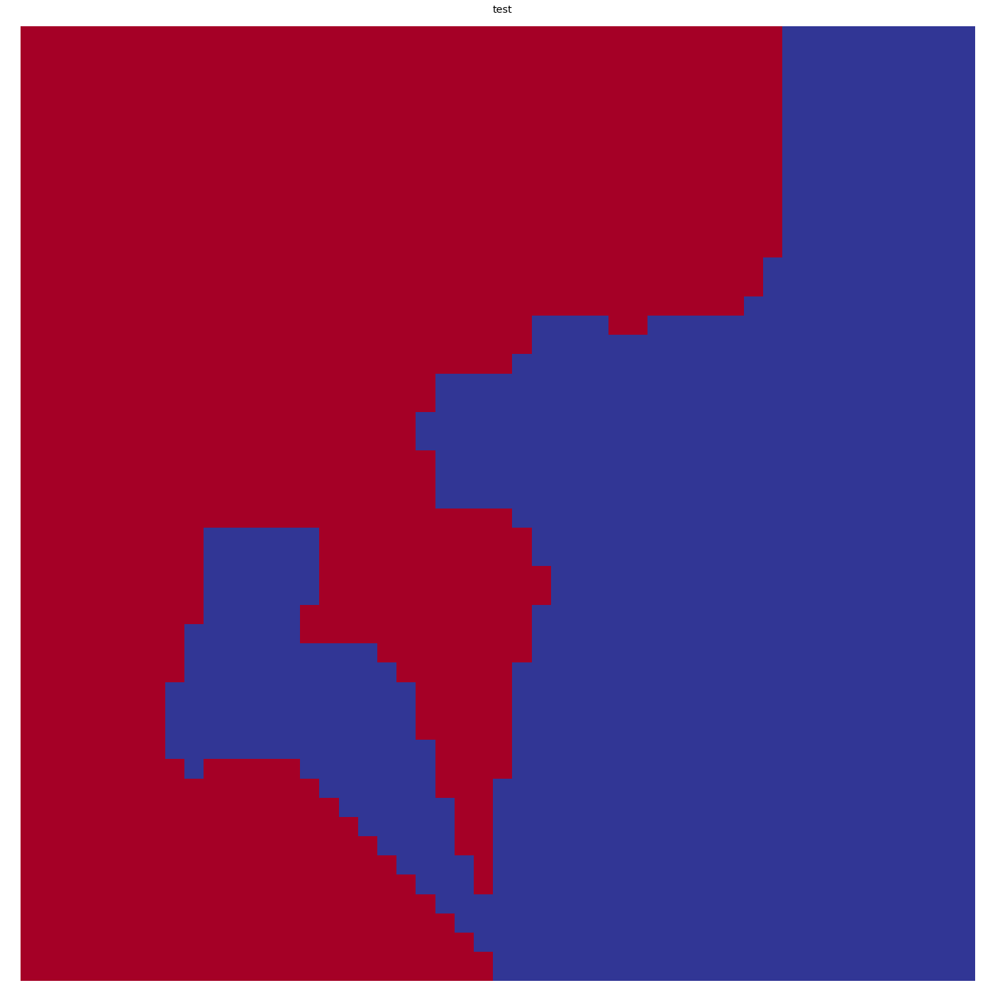

In [79]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

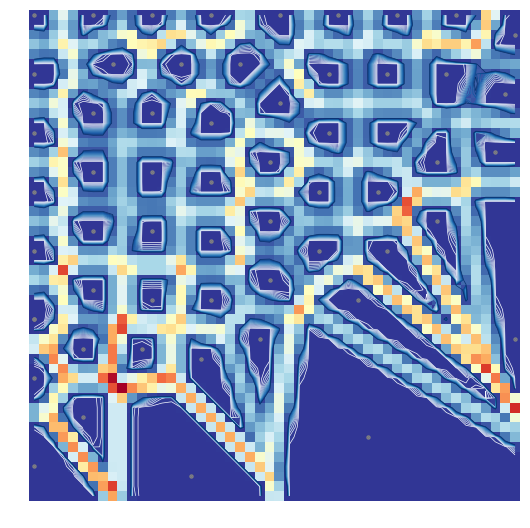

([], array([[9.29922019e-06, 1.69506532e-03, 3.42250255e-01, ...,
         6.65598176e-01, 1.33863579e-02, 4.48193906e-05],
        [1.02396037e-03, 2.16949536e-03, 2.74609562e-01, ...,
         3.07537065e-01, 1.49548012e-03, 4.56566913e-06],
        [2.06148537e-01, 1.66264379e-01, 4.37881569e-01, ...,
         7.22635818e-02, 2.04699057e-04, 1.97209800e-06],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]]))

In [80]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

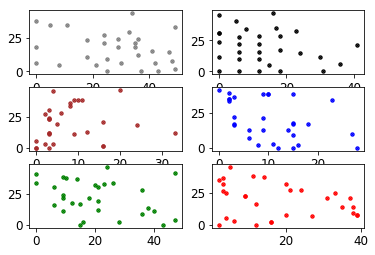

In [81]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


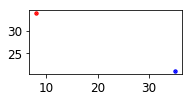

In [82]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 1000 Iterations 

In [83]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=1000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.006466042249231
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.049000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 1000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1 ---> elapsed time:  0.302000, quantization error: 1.179233

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 2 ---> elapsed time:  0.324000, quantization error: 0.960808

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 3 ---> elapsed time:  0.339000, quantization error: 0.856186

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 52 ---> elapsed time:  0.322000, quantization error: 0.788272

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 53 ---> elapsed time:  0.326000, quantization error: 0.787720

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 54 ---> elapsed time:  0.334000, quantization error: 0.787168

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 55 ---> elapsed time:  0.323000, quantization error: 0.786616

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 56 ---> elapsed time:  0.320000, quantization error: 0.786064

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 57 ---> elapsed time:  0.329000, quantization error: 0.785513

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 106 ---> elapsed time:  0.322000, quantization error: 0.758862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 107 ---> elapsed time:  0.317000, quantization error: 0.758296

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 108 ---> elapsed time:  0.344000, quantization error: 0.757729

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 109 ---> elapsed time:  0.320000, quantization error: 0.757163

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 110 ---> elapsed time:  0.319000, quantization error: 0.756596

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 111 ---> elapsed time:  0.331000, quantization error: 0.756030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 160 ---> elapsed time:  0.335000, quantization error: 0.726597

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 161 ---> elapsed time:  0.314000, quantization error: 0.726001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 162 ---> elapsed time:  0.318000, quantization error: 0.725447

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 163 ---> elapsed time:  0.325000, quantization error: 0.724849

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 164 ---> elapsed time:  0.327000, quantization error: 0.724250

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 165 ---> elapsed time:  0.332000, quantization error: 0.723652

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 214 ---> elapsed time:  0.316000, quantization error: 0.692112

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 215 ---> elapsed time:  0.332000, quantization error: 0.691495

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 216 ---> elapsed time:  0.357000, quantization error: 0.690734

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 217 ---> elapsed time:  0.314000, quantization error: 0.689893

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 218 ---> elapsed time:  0.343000, quantization error: 0.688901

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 219 ---> elapsed time:  0.326000, quantization error: 0.687883

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 268 ---> elapsed time:  0.320000, quantization error: 0.654950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 269 ---> elapsed time:  0.318000, quantization error: 0.654304

 find_bmu took: 0.117000 seconds
 update_codebook_voronoi took: 0.025000 seconds
 epoch: 270 ---> elapsed time:  0.333000, quantization error: 0.653657

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 271 ---> elapsed time:  0.318000, quantization error: 0.652877

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 272 ---> elapsed time:  0.320000, quantization error: 0.652226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.061000 seconds
 epoch: 273 ---> elapsed time:  0.351000, quantization error: 0.651575

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 322 ---> elapsed time:  0.328000, quantization error: 0.616611

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 323 ---> elapsed time:  0.317000, quantization error: 0.615943

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 324 ---> elapsed time:  0.318000, quantization error: 0.615273

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 325 ---> elapsed time:  0.325000, quantization error: 0.614767

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 326 ---> elapsed time:  0.315000, quantization error: 0.613891

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 327 ---> elapsed time:  0.319000, quantization error: 0.613179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 376 ---> elapsed time:  0.368000, quantization error: 0.575028

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 377 ---> elapsed time:  0.302000, quantization error: 0.574080

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 378 ---> elapsed time:  0.322000, quantization error: 0.573329

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 379 ---> elapsed time:  0.322000, quantization error: 0.572578

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 380 ---> elapsed time:  0.329000, quantization error: 0.571827

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 381 ---> elapsed time:  0.323000, quantization error: 0.571076

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 430 ---> elapsed time:  0.324000, quantization error: 0.529671

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 431 ---> elapsed time:  0.333000, quantization error: 0.528388

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 432 ---> elapsed time:  0.316000, quantization error: 0.527576

 find_bmu took: 0.117000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 epoch: 433 ---> elapsed time:  0.334000, quantization error: 0.526764

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 434 ---> elapsed time:  0.329000, quantization error: 0.525953

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 435 ---> elapsed time:  0.317000, quantization error: 0.525142

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 484 ---> elapsed time:  0.317000, quantization error: 0.480484

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 485 ---> elapsed time:  0.325000, quantization error: 0.479607

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 486 ---> elapsed time:  0.324000, quantization error: 0.478728

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 487 ---> elapsed time:  0.315000, quantization error: 0.478176

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 488 ---> elapsed time:  0.316000, quantization error: 0.477297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 489 ---> elapsed time:  0.333000, quantization error: 0.476418

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 538 ---> elapsed time:  0.335000, quantization error: 0.430276

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 539 ---> elapsed time:  0.316000, quantization error: 0.429370

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 540 ---> elapsed time:  0.319000, quantization error: 0.428465

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 541 ---> elapsed time:  0.330000, quantization error: 0.427553

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 542 ---> elapsed time:  0.312000, quantization error: 0.424475

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 543 ---> elapsed time:  0.319000, quantization error: 0.423677

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 592 ---> elapsed time:  0.315000, quantization error: 0.372303

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 593 ---> elapsed time:  0.328000, quantization error: 0.371295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 594 ---> elapsed time:  0.319000, quantization error: 0.370287

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 595 ---> elapsed time:  0.321000, quantization error: 0.369280

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 596 ---> elapsed time:  0.344000, quantization error: 0.368273

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 597 ---> elapsed time:  0.319000, quantization error: 0.367265

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 646 ---> elapsed time:  0.319000, quantization error: 0.314438

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 647 ---> elapsed time:  0.318000, quantization error: 0.310160

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 648 ---> elapsed time:  0.349000, quantization error: 0.304715

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 649 ---> elapsed time:  0.314000, quantization error: 0.301759

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 650 ---> elapsed time:  0.317000, quantization error: 0.299382

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 651 ---> elapsed time:  0.330000, quantization error: 0.298238

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 700 ---> elapsed time:  0.321000, quantization error: 0.233987

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 701 ---> elapsed time:  0.317000, quantization error: 0.232766

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 702 ---> elapsed time:  0.326000, quantization error: 0.231547

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 703 ---> elapsed time:  0.332000, quantization error: 0.230329

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 704 ---> elapsed time:  0.321000, quantization error: 0.229113

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 705 ---> elapsed time:  0.322000, quantization error: 0.227899

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 754 ---> elapsed time:  0.339000, quantization error: 0.163491

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 755 ---> elapsed time:  0.322000, quantization error: 0.162325

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 756 ---> elapsed time:  0.325000, quantization error: 0.161162

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 757 ---> elapsed time:  0.336000, quantization error: 0.160002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 758 ---> elapsed time:  0.318000, quantization error: 0.158845

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 759 ---> elapsed time:  0.326000, quantization error: 0.157692

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 808 ---> elapsed time:  0.334000, quantization error: 0.102755

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 809 ---> elapsed time:  0.320000, quantization error: 0.101746

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 810 ---> elapsed time:  0.318000, quantization error: 0.100741

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 811 ---> elapsed time:  0.335000, quantization error: 0.099742

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 812 ---> elapsed time:  0.323000, quantization error: 0.098747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 813 ---> elapsed time:  0.318000, quantization error: 0.097758

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 862 ---> elapsed time:  0.318000, quantization error: 0.052602

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 863 ---> elapsed time:  0.331000, quantization error: 0.051873

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 864 ---> elapsed time:  0.319000, quantization error: 0.051150

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 865 ---> elapsed time:  0.320000, quantization error: 0.050431

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 866 ---> elapsed time:  0.318000, quantization error: 0.049577

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 867 ---> elapsed time:  0.317000, quantization error: 0.048869

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 916 ---> elapsed time:  0.314000, quantization error: 0.020747

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 917 ---> elapsed time:  0.317000, quantization error: 0.020338

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 918 ---> elapsed time:  0.339000, quantization error: 0.019934

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 919 ---> elapsed time:  0.320000, quantization error: 0.019534

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 920 ---> elapsed time:  0.319000, quantization error: 0.018976

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 921 ---> elapsed time:  0.320000, quantization error: 0.018440

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 970 ---> elapsed time:  0.333000, quantization error: 0.004575

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 971 ---> elapsed time:  0.319000, quantization error: 0.004434

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 972 ---> elapsed time:  0.321000, quantization error: 0.004296

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 973 ---> elapsed time:  0.335000, quantization error: 0.004162

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 974 ---> elapsed time:  0.319000, quantization error: 0.004030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 975 ---> elapsed time:  0.319000, quantization error: 0.003902

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 23 ---> elapsed time:  0.317000, quantization error: 0.001329

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 24 ---> elapsed time:  0.317000, quantization error: 0.001324

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 25 ---> elapsed time:  0.332000, quantization error: 0.001320

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 26 ---> elapsed time:  0.327000, quantization error: 0.001315

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 27 ---> elapsed time:  0.327000, quantization error: 0.001311

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 28 ---> elapsed time:  0.324000, quantization error: 0.001306

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 29 ---> elapsed time:  0.317000,

 update_codebook_voronoi took: 0.033000 seconds
 epoch: 77 ---> elapsed time:  0.373000, quantization error: 0.001103

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 78 ---> elapsed time:  0.340000, quantization error: 0.001099

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 79 ---> elapsed time:  0.336000, quantization error: 0.001095

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 80 ---> elapsed time:  0.336000, quantization error: 0.001092

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 81 ---> elapsed time:  0.339000, quantization error: 0.001088

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 82 ---> elapsed time:  0.340000, quantization error: 0.001084

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 83 ---> elapsed time:  0.319000,

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 131 ---> elapsed time:  0.332000, quantization error: 0.000885

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 132 ---> elapsed time:  0.326000, quantization error: 0.000882

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 133 ---> elapsed time:  0.319000, quantization error: 0.000879

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 134 ---> elapsed time:  0.337000, quantization error: 0.000876

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 135 ---> elapsed time:  0.317000, quantization error: 0.000872

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 136 ---> elapsed time:  0.322000, quantization error: 0.000869

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 185 ---> elapsed time:  0.353000, quantization error: 0.000725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 186 ---> elapsed time:  0.319000, quantization error: 0.000722

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 187 ---> elapsed time:  0.327000, quantization error: 0.000719

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 188 ---> elapsed time:  0.329000, quantization error: 0.000717

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 189 ---> elapsed time:  0.319000, quantization error: 0.000714

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 190 ---> elapsed time:  0.319000, quantization error: 0.000711

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 239 ---> elapsed time:  0.318000, quantization error: 0.000589

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 240 ---> elapsed time:  0.338000, quantization error: 0.000587

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 241 ---> elapsed time:  0.321000, quantization error: 0.000584

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 242 ---> elapsed time:  0.316000, quantization error: 0.000582

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 243 ---> elapsed time:  0.347000, quantization error: 0.000580

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 244 ---> elapsed time:  0.320000, quantization error: 0.000578

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 293 ---> elapsed time:  0.318000, quantization error: 0.000375

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 294 ---> elapsed time:  0.327000, quantization error: 0.000373

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 295 ---> elapsed time:  0.324000, quantization error: 0.000372

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 296 ---> elapsed time:  0.319000, quantization error: 0.000370

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 297 ---> elapsed time:  0.319000, quantization error: 0.000369

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 298 ---> elapsed time:  0.345000, quantization error: 0.000367

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 347 ---> elapsed time:  0.319000, quantization error: 0.000297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 348 ---> elapsed time:  0.322000, quantization error: 0.000296

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 349 ---> elapsed time:  0.340000, quantization error: 0.000295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 350 ---> elapsed time:  0.322000, quantization error: 0.000294

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 351 ---> elapsed time:  0.317000, quantization error: 0.000292

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 352 ---> elapsed time:  0.337000, quantization error: 0.000291

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 401 ---> elapsed time:  0.335000, quantization error: 0.000232

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 402 ---> elapsed time:  0.326000, quantization error: 0.000231

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 403 ---> elapsed time:  0.335000, quantization error: 0.000230

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 404 ---> elapsed time:  0.350000, quantization error: 0.000229

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 405 ---> elapsed time:  0.321000, quantization error: 0.000228

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 406 ---> elapsed time:  0.317000, quantization error: 0.000227

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 455 ---> elapsed time:  0.348000, quantization error: 0.000179

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 456 ---> elapsed time:  0.323000, quantization error: 0.000178

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 457 ---> elapsed time:  0.332000, quantization error: 0.000177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 458 ---> elapsed time:  0.338000, quantization error: 0.000177

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 459 ---> elapsed time:  0.323000, quantization error: 0.000176

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 460 ---> elapsed time:  0.325000, quantization error: 0.000175

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 509 ---> elapsed time:  0.333000, quantization error: 0.000138

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 510 ---> elapsed time:  0.324000, quantization error: 0.000138

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 511 ---> elapsed time:  0.322000, quantization error: 0.000137

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 512 ---> elapsed time:  0.329000, quantization error: 0.000136

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 513 ---> elapsed time:  0.317000, quantization error: 0.000135

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 514 ---> elapsed time:  0.321000, quantization error: 0.000135

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 563 ---> elapsed time:  0.338000, quantization error: 0.000080

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 564 ---> elapsed time:  0.330000, quantization error: 0.000080

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 565 ---> elapsed time:  0.318000, quantization error: 0.000079

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 566 ---> elapsed time:  0.357000, quantization error: 0.000079

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 567 ---> elapsed time:  0.316000, quantization error: 0.000078

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 568 ---> elapsed time:  0.325000, quantization error: 0.000078

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 617 ---> elapsed time:  0.319000, quantization error: 0.000060

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 618 ---> elapsed time:  0.338000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 619 ---> elapsed time:  0.324000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 620 ---> elapsed time:  0.334000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 621 ---> elapsed time:  0.331000, quantization error: 0.000058

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 622 ---> elapsed time:  0.330000, quantization error: 0.000058

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 671 ---> elapsed time:  0.322000, quantization error: 0.000043

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 672 ---> elapsed time:  0.333000, quantization error: 0.000043

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 673 ---> elapsed time:  0.336000, quantization error: 0.000042

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 674 ---> elapsed time:  0.325000, quantization error: 0.000042

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 675 ---> elapsed time:  0.357000, quantization error: 0.000042

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 676 ---> elapsed time:  0.333000, quantization error: 0.000042

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 725 ---> elapsed time:  0.320000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 726 ---> elapsed time:  0.324000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 727 ---> elapsed time:  0.327000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 728 ---> elapsed time:  0.328000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 729 ---> elapsed time:  0.317000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 730 ---> elapsed time:  0.353000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 779 ---> elapsed time:  0.323000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 780 ---> elapsed time:  0.321000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 781 ---> elapsed time:  0.325000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 782 ---> elapsed time:  0.336000, quantization error: 0.000021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 783 ---> elapsed time:  0.318000, quantization error: 0.000021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 784 ---> elapsed time:  0.327000, quantization error: 0.000021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 833 ---> elapsed time:  0.329000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 834 ---> elapsed time:  0.322000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 835 ---> elapsed time:  0.331000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 836 ---> elapsed time:  0.320000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 837 ---> elapsed time:  0.347000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 838 ---> elapsed time:  0.335000, quantization error: 0.000015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 887 ---> elapsed time:  0.320000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 888 ---> elapsed time:  0.336000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 889 ---> elapsed time:  0.326000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 890 ---> elapsed time:  0.325000, quantization error: 0.000011

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 891 ---> elapsed time:  0.344000, quantization error: 0.000010

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 892 ---> elapsed time:  0.320000, quantization error: 0.000010

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 941 ---> elapsed time:  0.340000, quantization error: 0.000007

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 942 ---> elapsed time:  0.325000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 943 ---> elapsed time:  0.328000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 944 ---> elapsed time:  0.327000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 945 ---> elapsed time:  0.346000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 946 ---> elapsed time:  0.365000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 995 ---> elapsed time:  0.325000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 996 ---> elapsed time:  0.330000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 997 ---> elapsed time:  0.335000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 998 ---> elapsed time:  0.324000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 999 ---> elapsed time:  0.338000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1000 ---> elapsed time:  0.324000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds


 epoch: 1048 ---> elapsed time:  0.328000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1049 ---> elapsed time:  0.320000, quantization error: 0.000003

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1050 ---> elapsed time:  0.331000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1051 ---> elapsed time:  0.320000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1052 ---> elapsed time:  0.323000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1053 ---> elapsed time:  0.337000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1054 ---> elapsed time:  0.322000, quantization error: 0.000003

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1102 ---> elapsed time:  0.325000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1103 ---> elapsed time:  0.326000, quantization error: 0.000002

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1104 ---> elapsed time:  0.343000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1105 ---> elapsed time:  0.318000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1106 ---> elapsed time:  0.325000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1107 ---> elapsed time:  0.343000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 sec

 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1155 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1156 ---> elapsed time:  0.323000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1157 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1158 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1159 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1160 ---> elapsed time:  0.344000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1161 ---> elapsed ti

 epoch: 1208 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1209 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1210 ---> elapsed time:  0.353000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1211 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1212 ---> elapsed time:  0.324000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1213 ---> elapsed time:  0.355000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1214 ---> elapsed time:  0.351000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1262 ---> elapsed time:  0.342000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1263 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1264 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1265 ---> elapsed time:  0.324000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1266 ---> elapsed time:  0.347000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1267 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 sec

 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1315 ---> elapsed time:  0.323000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1316 ---> elapsed time:  0.324000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1317 ---> elapsed time:  0.359000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1318 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1319 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1320 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1321 ---> elapsed ti

 epoch: 1368 ---> elapsed time:  0.340000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1369 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1370 ---> elapsed time:  0.323000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1371 ---> elapsed time:  0.336000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1372 ---> elapsed time:  0.323000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1373 ---> elapsed time:  0.350000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1374 ---> elapsed time:  0.323000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1422 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1423 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1424 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1425 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1426 ---> elapsed time:  0.343000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1427 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1475 ---> elapsed time:  0.324000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1476 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1477 ---> elapsed time:  0.377000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1478 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1479 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1480 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1481 ---> elapsed ti

 epoch: 1528 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1529 ---> elapsed time:  0.345000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1530 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1531 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1532 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1533 ---> elapsed time:  0.333000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1534 ---> elapsed time:  0.340000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1582 ---> elapsed time:  0.346000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1583 ---> elapsed time:  0.341000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1584 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 1585 ---> elapsed time:  0.381000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1586 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1587 ---> elapsed time:  0.381000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1635 ---> elapsed time:  0.324000, quantization error: 0.000001

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1636 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1637 ---> elapsed time:  0.346000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1638 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1639 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1640 ---> elapsed time:  0.353000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1641 ---> elapsed ti

 epoch: 1688 ---> elapsed time:  0.340000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1689 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1690 ---> elapsed time:  0.335000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1691 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1692 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1693 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1694 ---> elapsed time:  0.327000, quantization error: 0.000001

 fi

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


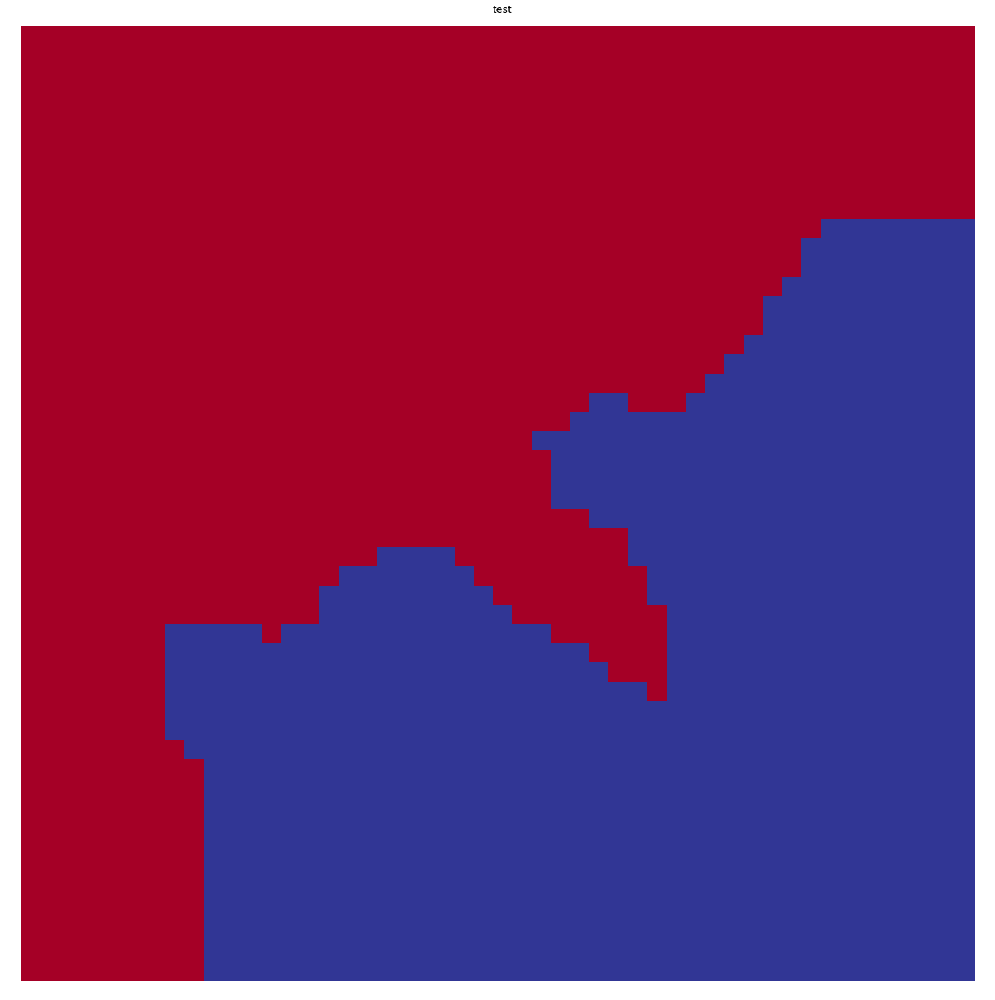

In [84]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

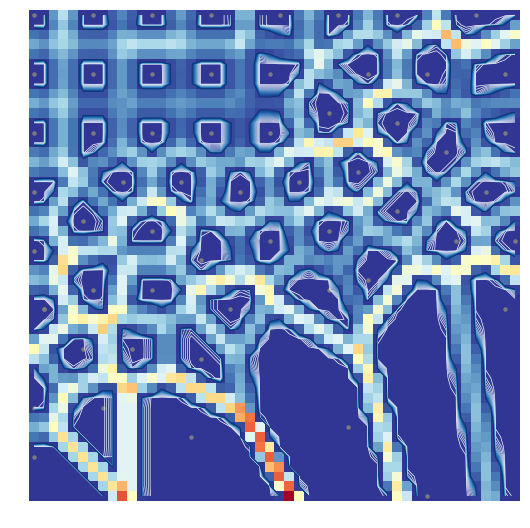

([], array([[9.29922019e-06, 1.69506532e-03, 3.42250255e-01, ...,
         3.42817478e-05, 2.52951505e-04, 2.44761776e-03],
        [1.02396037e-03, 2.16949536e-03, 2.74610395e-01, ...,
         1.08812209e-02, 7.22610430e-02, 3.72900559e-01],
        [2.06148537e-01, 1.66266285e-01, 4.37861017e-01, ...,
         5.92612444e-01, 8.69591926e-01, 1.02175640e+00],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         2.26238360e-01, 1.46560392e-03, 4.47213595e-06],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         3.01726545e-01, 3.95648213e-03, 1.21963109e-05],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         4.21731639e-01, 1.31387998e-02, 4.46753723e-05]]))

In [85]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

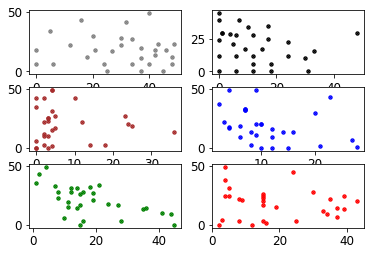

In [86]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


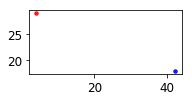

In [87]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

### 2000 Iterations 

In [88]:
som = sompy.SOMFactory.build(group_0_19_train, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som.train(n_job=1, verbose='debug', train_rough_len=2000)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 58 and data dimension is 7
      > map size is 50,50
      > array size in log10 scale is 6.006466042249231
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.058000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.750000, trainlen: 2000

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1 ---> elapsed time:  0.308000, quantization error: 1.179233

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 2 ---> elapsed time:  0.343000, quantization error: 0.960808

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 3 ---> elapsed time:  0.319000, quantization error: 0.856412

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 4 ---> e

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 52 ---> elapsed time:  0.319000, quantization error: 0.802136

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 53 ---> elapsed time:  0.317000, quantization error: 0.801861

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 54 ---> elapsed time:  0.350000, quantization error: 0.801585

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 55 ---> elapsed time:  0.320000, quantization error: 0.801310

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 56 ---> elapsed time:  0.322000, quantization error: 0.801034

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 57 ---> elapsed time:  0.358000, quantization error: 0.800759

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 106 ---> elapsed time:  0.319000, quantization error: 0.787182

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 107 ---> elapsed time:  0.323000, quantization error: 0.786906

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 108 ---> elapsed time:  0.327000, quantization error: 0.786630

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 109 ---> elapsed time:  0.318000, quantization error: 0.786354

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 110 ---> elapsed time:  0.321000, quantization error: 0.786078

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 111 ---> elapsed time:  0.353000, quantization error: 0.785802

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 160 ---> elapsed time:  0.347000, quantization error: 0.773036

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 161 ---> elapsed time:  0.342000, quantization error: 0.772754

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 162 ---> elapsed time:  0.334000, quantization error: 0.772471

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 163 ---> elapsed time:  0.322000, quantization error: 0.772188

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 164 ---> elapsed time:  0.344000, quantization error: 0.771906

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 165 ---> elapsed time:  0.320000, quantization error: 0.771623

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 214 ---> elapsed time:  0.324000, quantization error: 0.757928

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 215 ---> elapsed time:  0.348000, quantization error: 0.757645

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 216 ---> elapsed time:  0.321000, quantization error: 0.757363

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 217 ---> elapsed time:  0.324000, quantization error: 0.757080

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 218 ---> elapsed time:  0.326000, quantization error: 0.756798

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 219 ---> elapsed time:  0.320000, quantization error: 0.756516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 268 ---> elapsed time:  0.318000, quantization error: 0.742616

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 269 ---> elapsed time:  0.329000, quantization error: 0.742333

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 270 ---> elapsed time:  0.336000, quantization error: 0.742050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 271 ---> elapsed time:  0.317000, quantization error: 0.741767

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 272 ---> elapsed time:  0.320000, quantization error: 0.741484

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 273 ---> elapsed time:  0.327000, quantization error: 0.741201

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 322 ---> elapsed time:  0.321000, quantization error: 0.724941

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 323 ---> elapsed time:  0.321000, quantization error: 0.724646

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 324 ---> elapsed time:  0.340000, quantization error: 0.724351

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 325 ---> elapsed time:  0.327000, quantization error: 0.724056

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 326 ---> elapsed time:  0.322000, quantization error: 0.723761

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 327 ---> elapsed time:  0.337000, quantization error: 0.723467

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 376 ---> elapsed time:  0.333000, quantization error: 0.708130

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 377 ---> elapsed time:  0.319000, quantization error: 0.707831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 378 ---> elapsed time:  0.322000, quantization error: 0.707532

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 379 ---> elapsed time:  0.321000, quantization error: 0.707233

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 380 ---> elapsed time:  0.329000, quantization error: 0.706935

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 381 ---> elapsed time:  0.316000, quantization error: 0.706636

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 430 ---> elapsed time:  0.323000, quantization error: 0.690233

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 431 ---> elapsed time:  0.318000, quantization error: 0.689538

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 432 ---> elapsed time:  0.324000, quantization error: 0.688984

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 433 ---> elapsed time:  0.334000, quantization error: 0.688667

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 434 ---> elapsed time:  0.365000, quantization error: 0.688182

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 435 ---> elapsed time:  0.319000, quantization error: 0.687864

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 484 ---> elapsed time:  0.320000, quantization error: 0.672633

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 485 ---> elapsed time:  0.336000, quantization error: 0.672315

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 486 ---> elapsed time:  0.318000, quantization error: 0.671729

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.051000 seconds
 epoch: 487 ---> elapsed time:  0.367000, quantization error: 0.671411

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 488 ---> elapsed time:  0.320000, quantization error: 0.671093

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 489 ---> elapsed time:  0.319000, quantization error: 0.670775

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 538 ---> elapsed time:  0.325000, quantization error: 0.653745

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 539 ---> elapsed time:  0.360000, quantization error: 0.653291

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 540 ---> elapsed time:  0.322000, quantization error: 0.652965

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 541 ---> elapsed time:  0.319000, quantization error: 0.652639

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 542 ---> elapsed time:  0.336000, quantization error: 0.652314

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 543 ---> elapsed time:  0.322000, quantization error: 0.651988

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 592 ---> elapsed time:  0.322000, quantization error: 0.634355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 593 ---> elapsed time:  0.324000, quantization error: 0.634021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 594 ---> elapsed time:  0.322000, quantization error: 0.633688

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 595 ---> elapsed time:  0.329000, quantization error: 0.633355

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 596 ---> elapsed time:  0.345000, quantization error: 0.633021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 597 ---> elapsed time:  0.312000, quantization error: 0.632688

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 646 ---> elapsed time:  0.323000, quantization error: 0.615381

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 647 ---> elapsed time:  0.322000, quantization error: 0.615213

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 648 ---> elapsed time:  0.320000, quantization error: 0.614876

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 649 ---> elapsed time:  0.321000, quantization error: 0.614537

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 650 ---> elapsed time:  0.331000, quantization error: 0.614002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 651 ---> elapsed time:  0.318000, quantization error: 0.613631

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 700 ---> elapsed time:  0.323000, quantization error: 0.593677

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 701 ---> elapsed time:  0.321000, quantization error: 0.593318

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 702 ---> elapsed time:  0.330000, quantization error: 0.592959

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 703 ---> elapsed time:  0.319000, quantization error: 0.592601

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 704 ---> elapsed time:  0.329000, quantization error: 0.592242

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 705 ---> elapsed time:  0.328000, quantization error: 0.591883

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 754 ---> elapsed time:  0.328000, quantization error: 0.573470

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 755 ---> elapsed time:  0.318000, quantization error: 0.573095

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 756 ---> elapsed time:  0.326000, quantization error: 0.572719

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 757 ---> elapsed time:  0.328000, quantization error: 0.572344

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 758 ---> elapsed time:  0.321000, quantization error: 0.571969

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 759 ---> elapsed time:  0.332000, quantization error: 0.571594

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.050000 seconds
 epoch: 808 ---> elapsed time:  0.357000, quantization error: 0.550998

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 809 ---> elapsed time:  0.364000, quantization error: 0.550345

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 810 ---> elapsed time:  0.322000, quantization error: 0.549952

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 811 ---> elapsed time:  0.322000, quantization error: 0.549558

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 812 ---> elapsed time:  0.319000, quantization error: 0.549165

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 813 ---> elapsed time:  0.318000, quantization error: 0.548772

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 862 ---> elapsed time:  0.398000, quantization error: 0.527751

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 863 ---> elapsed time:  0.365000, quantization error: 0.527345

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 864 ---> elapsed time:  0.380000, quantization error: 0.526939

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 865 ---> elapsed time:  0.349000, quantization error: 0.526534

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 866 ---> elapsed time:  0.371000, quantization error: 0.526128

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 867 ---> elapsed time:  0.321000, quantization error: 0.525723

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 916 ---> elapsed time:  0.325000, quantization error: 0.503629

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 917 ---> elapsed time:  0.346000, quantization error: 0.503207

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 918 ---> elapsed time:  0.323000, quantization error: 0.502786

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 919 ---> elapsed time:  0.319000, quantization error: 0.502364

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 920 ---> elapsed time:  0.360000, quantization error: 0.500723

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 921 ---> elapsed time:  0.317000, quantization error: 0.500300

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 970 ---> elapsed time:  0.321000, quantization error: 0.478422

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 971 ---> elapsed time:  0.349000, quantization error: 0.477983

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 972 ---> elapsed time:  0.367000, quantization error: 0.477543

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 epoch: 973 ---> elapsed time:  0.332000, quantization error: 0.477104

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 974 ---> elapsed time:  0.328000, quantization error: 0.476665

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 975 ---> elapsed time:  0.318000, quantization error: 0.476226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.043000 seconds
 

 epoch: 1023 ---> elapsed time:  0.324000, quantization error: 0.454453

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1024 ---> elapsed time:  0.329000, quantization error: 0.454002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1025 ---> elapsed time:  0.343000, quantization error: 0.453552

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1026 ---> elapsed time:  0.328000, quantization error: 0.453102

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1027 ---> elapsed time:  0.316000, quantization error: 0.452652

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1028 ---> elapsed time:  0.347000, quantization error: 0.452201

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1029 ---> elapsed time:  0.319000, quantization error: 0.451751

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1077 ---> elapsed time:  0.324000, quantization error: 0.429161

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1078 ---> elapsed time:  0.324000, quantization error: 0.428709

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1079 ---> elapsed time:  0.340000, quantization error: 0.428257

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1080 ---> elapsed time:  0.328000, quantization error: 0.427801

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1081 ---> elapsed time:  0.319000, quantization error: 0.425189

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1082 ---> elapsed time:  0.326000, quantization error: 0.424863

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1130 ---> elapsed time:  0.319000, quantization error: 0.398830

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1131 ---> elapsed time:  0.328000, quantization error: 0.398341

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1132 ---> elapsed time:  0.323000, quantization error: 0.397852

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1133 ---> elapsed time:  0.320000, quantization error: 0.397363

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 1134 ---> elapsed time:  0.346000, quantization error: 0.396875

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1135 ---> elapsed time:  0.316000, quantization error: 0.396386

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1136 ---> elapsed ti

 epoch: 1183 ---> elapsed time:  0.329000, quantization error: 0.372097

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1184 ---> elapsed time:  0.324000, quantization error: 0.371593

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1185 ---> elapsed time:  0.333000, quantization error: 0.371089

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1186 ---> elapsed time:  0.320000, quantization error: 0.370586

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1187 ---> elapsed time:  0.317000, quantization error: 0.370082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1188 ---> elapsed time:  0.321000, quantization error: 0.369579

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1189 ---> elapsed time:  0.337000, quantization error: 0.369075

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1237 ---> elapsed time:  0.335000, quantization error: 0.344644

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1238 ---> elapsed time:  0.323000, quantization error: 0.344124

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1239 ---> elapsed time:  0.331000, quantization error: 0.343605

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1240 ---> elapsed time:  0.333000, quantization error: 0.343086

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1241 ---> elapsed time:  0.322000, quantization error: 0.342567

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.045000 seconds
 epoch: 1242 ---> elapsed time:  0.349000, quantization error: 0.342048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1290 ---> elapsed time:  0.320000, quantization error: 0.307325

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1291 ---> elapsed time:  0.362000, quantization error: 0.304989

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1292 ---> elapsed time:  0.322000, quantization error: 0.303188

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1293 ---> elapsed time:  0.323000, quantization error: 0.302615

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1294 ---> elapsed time:  0.352000, quantization error: 0.302043

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1295 ---> elapsed time:  0.325000, quantization error: 0.301470

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 1296 ---> elapsed ti

 epoch: 1343 ---> elapsed time:  0.325000, quantization error: 0.269863

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 1344 ---> elapsed time:  0.329000, quantization error: 0.269269

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1345 ---> elapsed time:  0.338000, quantization error: 0.268676

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1346 ---> elapsed time:  0.322000, quantization error: 0.268082

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1347 ---> elapsed time:  0.323000, quantization error: 0.267490

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1348 ---> elapsed time:  0.351000, quantization error: 0.266897

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1349 ---> elapsed time:  0.323000, quantization error: 0.266305

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1397 ---> elapsed time:  0.318000, quantization error: 0.235025

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1398 ---> elapsed time:  0.321000, quantization error: 0.234413

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1399 ---> elapsed time:  0.334000, quantization error: 0.233803

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1400 ---> elapsed time:  0.322000, quantization error: 0.233193

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1401 ---> elapsed time:  0.319000, quantization error: 0.232583

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1402 ---> elapsed time:  0.327000, quantization error: 0.231973

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1450 ---> elapsed time:  0.321000, quantization error: 0.201007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1451 ---> elapsed time:  0.346000, quantization error: 0.200413

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1452 ---> elapsed time:  0.328000, quantization error: 0.199819

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1453 ---> elapsed time:  0.329000, quantization error: 0.199226

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1454 ---> elapsed time:  0.341000, quantization error: 0.198492

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1455 ---> elapsed time:  0.325000, quantization error: 0.197898

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1456 ---> elapsed ti

 epoch: 1503 ---> elapsed time:  0.321000, quantization error: 0.165687

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1504 ---> elapsed time:  0.328000, quantization error: 0.165101

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1505 ---> elapsed time:  0.344000, quantization error: 0.164516

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1506 ---> elapsed time:  0.321000, quantization error: 0.163931

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1507 ---> elapsed time:  0.321000, quantization error: 0.163347

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1508 ---> elapsed time:  0.357000, quantization error: 0.162764

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1509 ---> elapsed time:  0.326000, quantization error: 0.162182

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1557 ---> elapsed time:  0.324000, quantization error: 0.134936

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1558 ---> elapsed time:  0.325000, quantization error: 0.134385

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1559 ---> elapsed time:  0.334000, quantization error: 0.133831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1560 ---> elapsed time:  0.326000, quantization error: 0.133186

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1561 ---> elapsed time:  0.319000, quantization error: 0.131993

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1562 ---> elapsed time:  0.342000, quantization error: 0.131436

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 sec

 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1610 ---> elapsed time:  0.339000, quantization error: 0.104883

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1611 ---> elapsed time:  0.321000, quantization error: 0.104369

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1612 ---> elapsed time:  0.327000, quantization error: 0.103855

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1613 ---> elapsed time:  0.326000, quantization error: 0.103343

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1614 ---> elapsed time:  0.330000, quantization error: 0.102831

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 1615 ---> elapsed time:  0.326000, quantization error: 0.102322

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1616 ---> elapsed ti

 epoch: 1663 ---> elapsed time:  0.322000, quantization error: 0.078336

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1664 ---> elapsed time:  0.334000, quantization error: 0.077887

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1665 ---> elapsed time:  0.338000, quantization error: 0.077439

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1666 ---> elapsed time:  0.327000, quantization error: 0.076992

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1667 ---> elapsed time:  0.325000, quantization error: 0.075967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1668 ---> elapsed time:  0.333000, quantization error: 0.075522

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1669 ---> elapsed time:  0.328000, quantization error: 0.075078

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1717 ---> elapsed time:  0.317000, quantization error: 0.053776

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1718 ---> elapsed time:  0.323000, quantization error: 0.053407

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1719 ---> elapsed time:  0.330000, quantization error: 0.053039

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1720 ---> elapsed time:  0.328000, quantization error: 0.052674

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1721 ---> elapsed time:  0.323000, quantization error: 0.052309

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1722 ---> elapsed time:  0.340000, quantization error: 0.051947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1770 ---> elapsed time:  0.349000, quantization error: 0.036012

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1771 ---> elapsed time:  0.316000, quantization error: 0.035719

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1772 ---> elapsed time:  0.327000, quantization error: 0.035428

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1773 ---> elapsed time:  0.335000, quantization error: 0.035138

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1774 ---> elapsed time:  0.339000, quantization error: 0.034850

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1775 ---> elapsed time:  0.317000, quantization error: 0.034564

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1776 ---> elapsed ti

 epoch: 1823 ---> elapsed time:  0.317000, quantization error: 0.022223

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.044000 seconds
 epoch: 1824 ---> elapsed time:  0.375000, quantization error: 0.022010

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1825 ---> elapsed time:  0.298000, quantization error: 0.021799

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1826 ---> elapsed time:  0.325000, quantization error: 0.021590

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1827 ---> elapsed time:  0.334000, quantization error: 0.021382

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1828 ---> elapsed time:  0.321000, quantization error: 0.021175

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1829 ---> elapsed time:  0.319000, quantization error: 0.020970

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1877 ---> elapsed time:  0.321000, quantization error: 0.012379

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1878 ---> elapsed time:  0.321000, quantization error: 0.012235

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1879 ---> elapsed time:  0.325000, quantization error: 0.012092

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1880 ---> elapsed time:  0.329000, quantization error: 0.011950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 1881 ---> elapsed time:  0.336000, quantization error: 0.011809

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1882 ---> elapsed time:  0.332000, quantization error: 0.011670

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1930 ---> elapsed time:  0.352000, quantization error: 0.005454

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1931 ---> elapsed time:  0.321000, quantization error: 0.005391

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1932 ---> elapsed time:  0.328000, quantization error: 0.005297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1933 ---> elapsed time:  0.330000, quantization error: 0.005255

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1934 ---> elapsed time:  0.327000, quantization error: 0.005145

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 1935 ---> elapsed time:  0.329000, quantization error: 0.005093

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1936 ---> elapsed ti

 epoch: 1983 ---> elapsed time:  0.339000, quantization error: 0.002297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1984 ---> elapsed time:  0.325000, quantization error: 0.002250

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1985 ---> elapsed time:  0.325000, quantization error: 0.002211

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.042000 seconds
 epoch: 1986 ---> elapsed time:  0.339000, quantization error: 0.002172

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1987 ---> elapsed time:  0.328000, quantization error: 0.002133

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1988 ---> elapsed time:  0.326000, quantization error: 0.002096

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1989 ---> elapsed time:  0.342000, quantization error: 0.002058

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 37 ---> elapsed time:  0.320000, quantization error: 0.001478

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 38 ---> elapsed time:  0.328000, quantization error: 0.001474

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 39 ---> elapsed time:  0.325000, quantization error: 0.001469

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 40 ---> elapsed time:  0.326000, quantization error: 0.001464

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 41 ---> elapsed time:  0.373000, quantization error: 0.001459

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 42 ---> elapsed time:  0.326000, quantization error: 0.001455

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 91 ---> elapsed time:  0.327000, quantization error: 0.001079

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 92 ---> elapsed time:  0.330000, quantization error: 0.001068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 93 ---> elapsed time:  0.316000, quantization error: 0.001064

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 94 ---> elapsed time:  0.325000, quantization error: 0.001061

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 95 ---> elapsed time:  0.341000, quantization error: 0.001057

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 96 ---> elapsed time:  0.322000, quantization error: 0.001054

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch:

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 145 ---> elapsed time:  0.322000, quantization error: 0.000889

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 146 ---> elapsed time:  0.336000, quantization error: 0.000886

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 147 ---> elapsed time:  0.322000, quantization error: 0.000883

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 148 ---> elapsed time:  0.324000, quantization error: 0.000880

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 149 ---> elapsed time:  0.324000, quantization error: 0.000877

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 150 ---> elapsed time:  0.330000, quantization error: 0.000874

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 199 ---> elapsed time:  0.340000, quantization error: 0.000586

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 200 ---> elapsed time:  0.324000, quantization error: 0.000584

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 201 ---> elapsed time:  0.358000, quantization error: 0.000582

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 202 ---> elapsed time:  0.324000, quantization error: 0.000579

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 203 ---> elapsed time:  0.331000, quantization error: 0.000572

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 204 ---> elapsed time:  0.330000, quantization error: 0.000560

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 253 ---> elapsed time:  0.325000, quantization error: 0.000339

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 254 ---> elapsed time:  0.326000, quantization error: 0.000337

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 255 ---> elapsed time:  0.339000, quantization error: 0.000336

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 256 ---> elapsed time:  0.323000, quantization error: 0.000334

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 257 ---> elapsed time:  0.321000, quantization error: 0.000333

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 258 ---> elapsed time:  0.336000, quantization error: 0.000331

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 307 ---> elapsed time:  0.326000, quantization error: 0.000267

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 308 ---> elapsed time:  0.344000, quantization error: 0.000265

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 309 ---> elapsed time:  0.357000, quantization error: 0.000264

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 310 ---> elapsed time:  0.362000, quantization error: 0.000263

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 311 ---> elapsed time:  0.372000, quantization error: 0.000262

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 312 ---> elapsed time:  0.365000, quantization error: 0.000261

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 361 ---> elapsed time:  0.329000, quantization error: 0.000208

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 362 ---> elapsed time:  0.324000, quantization error: 0.000207

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 363 ---> elapsed time:  0.344000, quantization error: 0.000206

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 364 ---> elapsed time:  0.330000, quantization error: 0.000205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 365 ---> elapsed time:  0.324000, quantization error: 0.000204

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 366 ---> elapsed time:  0.328000, quantization error: 0.000203

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 415 ---> elapsed time:  0.324000, quantization error: 0.000159

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 416 ---> elapsed time:  0.330000, quantization error: 0.000158

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 417 ---> elapsed time:  0.338000, quantization error: 0.000157

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 418 ---> elapsed time:  0.322000, quantization error: 0.000156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 419 ---> elapsed time:  0.324000, quantization error: 0.000156

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 420 ---> elapsed time:  0.353000, quantization error: 0.000155

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 469 ---> elapsed time:  0.330000, quantization error: 0.000121

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 470 ---> elapsed time:  0.332000, quantization error: 0.000121

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 471 ---> elapsed time:  0.328000, quantization error: 0.000120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 472 ---> elapsed time:  0.324000, quantization error: 0.000120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.054000 seconds
 epoch: 473 ---> elapsed time:  0.347000, quantization error: 0.000119

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 474 ---> elapsed time:  0.321000, quantization error: 0.000118

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 523 ---> elapsed time:  0.322000, quantization error: 0.000092

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 524 ---> elapsed time:  0.320000, quantization error: 0.000092

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 525 ---> elapsed time:  0.361000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 526 ---> elapsed time:  0.321000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 527 ---> elapsed time:  0.332000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 528 ---> elapsed time:  0.322000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 577 ---> elapsed time:  0.322000, quantization error: 0.000069

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 578 ---> elapsed time:  0.329000, quantization error: 0.000069

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 579 ---> elapsed time:  0.334000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 580 ---> elapsed time:  0.320000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.038000 seconds
 epoch: 581 ---> elapsed time:  0.331000, quantization error: 0.000068

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 582 ---> elapsed time:  0.332000, quantization error: 0.000067

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 631 ---> elapsed time:  0.329000, quantization error: 0.000051

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 632 ---> elapsed time:  0.338000, quantization error: 0.000051

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 633 ---> elapsed time:  0.350000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 634 ---> elapsed time:  0.319000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 635 ---> elapsed time:  0.331000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 636 ---> elapsed time:  0.328000, quantization error: 0.000050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 685 ---> elapsed time:  0.331000, quantization error: 0.000037

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 686 ---> elapsed time:  0.329000, quantization error: 0.000037

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 687 ---> elapsed time:  0.327000, quantization error: 0.000036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 688 ---> elapsed time:  0.326000, quantization error: 0.000036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 689 ---> elapsed time:  0.332000, quantization error: 0.000036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 690 ---> elapsed time:  0.332000, quantization error: 0.000036

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 739 ---> elapsed time:  0.333000, quantization error: 0.000027

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.040000 seconds
 epoch: 740 ---> elapsed time:  0.339000, quantization error: 0.000027

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 741 ---> elapsed time:  0.317000, quantization error: 0.000026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.047000 seconds
 epoch: 742 ---> elapsed time:  0.348000, quantization error: 0.000026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 743 ---> elapsed time:  0.346000, quantization error: 0.000026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 744 ---> elapsed time:  0.325000, quantization error: 0.000026

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.035000 seconds
 epoch: 793 ---> elapsed time:  0.335000, quantization error: 0.000019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 794 ---> elapsed time:  0.330000, quantization error: 0.000019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 795 ---> elapsed time:  0.324000, quantization error: 0.000019

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 796 ---> elapsed time:  0.328000, quantization error: 0.000019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 797 ---> elapsed time:  0.323000, quantization error: 0.000019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 798 ---> elapsed time:  0.327000, quantization error: 0.000019

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.037000 seconds
 epoch: 847 ---> elapsed time:  0.343000, quantization error: 0.000014

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 848 ---> elapsed time:  0.321000, quantization error: 0.000014

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 849 ---> elapsed time:  0.328000, quantization error: 0.000013

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 850 ---> elapsed time:  0.331000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 851 ---> elapsed time:  0.330000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 852 ---> elapsed time:  0.332000, quantization error: 0.000013

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 901 ---> elapsed time:  0.348000, quantization error: 0.000010

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 902 ---> elapsed time:  0.329000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 903 ---> elapsed time:  0.326000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 904 ---> elapsed time:  0.331000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 905 ---> elapsed time:  0.323000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 906 ---> elapsed time:  0.325000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 955 ---> elapsed time:  0.336000, quantization error: 0.000006

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 956 ---> elapsed time:  0.333000, quantization error: 0.000006

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 957 ---> elapsed time:  0.319000, quantization error: 0.000006

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 958 ---> elapsed time:  0.334000, quantization error: 0.000006

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 959 ---> elapsed time:  0.327000, quantization error: 0.000006

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 960 ---> elapsed time:  0.331000, quantization error: 0.000006

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 

 epoch: 1008 ---> elapsed time:  0.337000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1009 ---> elapsed time:  0.342000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1010 ---> elapsed time:  0.330000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1011 ---> elapsed time:  0.330000, quantization error: 0.000004

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1012 ---> elapsed time:  0.339000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1013 ---> elapsed time:  0.319000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1014 ---> elapsed time:  0.327000, quantization error: 0.000004

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1062 ---> elapsed time:  0.359000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1063 ---> elapsed time:  0.330000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1064 ---> elapsed time:  0.331000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1065 ---> elapsed time:  0.330000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1066 ---> elapsed time:  0.340000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1067 ---> elapsed time:  0.330000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1115 ---> elapsed time:  0.340000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1116 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1117 ---> elapsed time:  0.337000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1118 ---> elapsed time:  0.369000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1119 ---> elapsed time:  0.322000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1120 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1121 ---> elapsed ti

 epoch: 1168 ---> elapsed time:  0.360000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1169 ---> elapsed time:  0.322000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1170 ---> elapsed time:  0.337000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1171 ---> elapsed time:  0.344000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1172 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1173 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1174 ---> elapsed time:  0.375000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1222 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1223 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1224 ---> elapsed time:  0.346000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1225 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 1226 ---> elapsed time:  0.350000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1227 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1275 ---> elapsed time:  0.328000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1276 ---> elapsed time:  0.333000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1277 ---> elapsed time:  0.355000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1278 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1279 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1280 ---> elapsed time:  0.357000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1281 ---> elapsed ti

 epoch: 1328 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.065000 seconds
 epoch: 1329 ---> elapsed time:  0.371000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1330 ---> elapsed time:  0.359000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1331 ---> elapsed time:  0.335000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1332 ---> elapsed time:  0.345000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1333 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1334 ---> elapsed time:  0.338000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.046000 seconds
 epoch: 1382 ---> elapsed time:  0.413000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1383 ---> elapsed time:  0.389000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1384 ---> elapsed time:  0.372000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1385 ---> elapsed time:  0.335000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1386 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1387 ---> elapsed time:  0.354000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 sec

 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1435 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1436 ---> elapsed time:  0.368000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1437 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 1438 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1439 ---> elapsed time:  0.352000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1440 ---> elapsed time:  0.325000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1441 ---> elapsed ti

 epoch: 1488 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1489 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1490 ---> elapsed time:  0.336000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1491 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1492 ---> elapsed time:  0.358000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1493 ---> elapsed time:  0.338000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.041000 seconds
 epoch: 1494 ---> elapsed time:  0.356000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1542 ---> elapsed time:  0.336000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1543 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1544 ---> elapsed time:  0.372000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1545 ---> elapsed time:  0.326000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.039000 seconds
 epoch: 1546 ---> elapsed time:  0.339000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1547 ---> elapsed time:  0.349000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 sec

 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1595 ---> elapsed time:  0.331000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.034000 seconds
 epoch: 1596 ---> elapsed time:  0.351000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1597 ---> elapsed time:  0.334000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1598 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.036000 seconds
 epoch: 1599 ---> elapsed time:  0.352000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1600 ---> elapsed time:  0.343000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1601 ---> elapsed ti

 epoch: 1648 ---> elapsed time:  0.351000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1649 ---> elapsed time:  0.376000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1650 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1651 ---> elapsed time:  0.329000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1652 ---> elapsed time:  0.349000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1653 ---> elapsed time:  0.327000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1654 ---> elapsed time:  0.351000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1702 ---> elapsed time:  0.397000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1703 ---> elapsed time:  0.356000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.033000 seconds
 epoch: 1704 ---> elapsed time:  0.347000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1705 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1706 ---> elapsed time:  0.330000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.031000 seconds
 epoch: 1707 ---> elapsed time:  0.332000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.031000 sec

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


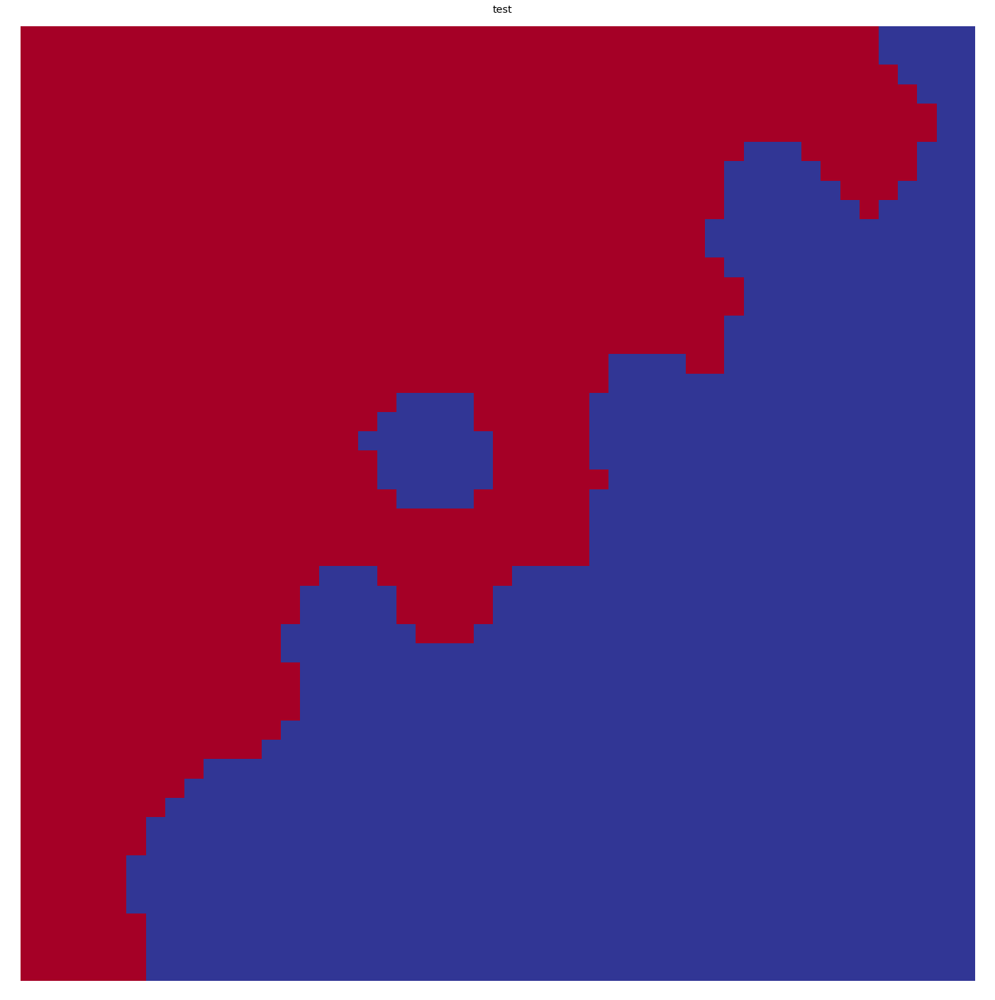

In [89]:
vis  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
labels = som.cluster(n_clusters=2)
vis.show(som, what='cluster')

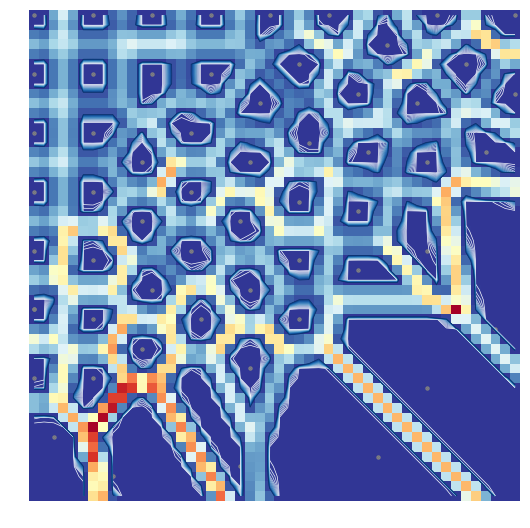

([], array([[9.29922019e-06, 1.69506532e-03, 3.42250255e-01, ...,
         2.30588474e-05, 5.00000000e-07, 0.00000000e+00],
        [1.02396037e-03, 2.16949536e-03, 2.74610395e-01, ...,
         1.22892979e-03, 2.26744120e-05, 7.50000000e-07],
        [2.06148537e-01, 1.66266285e-01, 4.37861017e-01, ...,
         1.53470304e-01, 3.45448917e-03, 5.75173758e-04],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         6.92820323e-07, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.56298752e-05, 6.92820323e-07, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.13048506e-03, 3.52016847e-05, 5.77350269e-07]]))

In [90]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

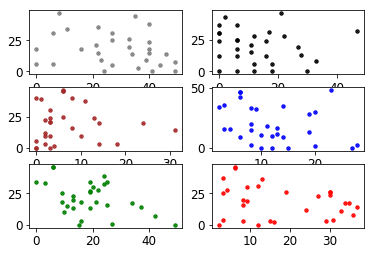

In [91]:
plot_data(som)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


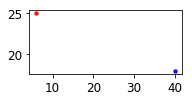

In [92]:
# TEST
plot_one_type(som, [test_0_10], 'blue')
plot_one_type(som, [test_10_19], 'red')

# Incompleto

## Clustering 2 groups 10 - 19 and 30 -39

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


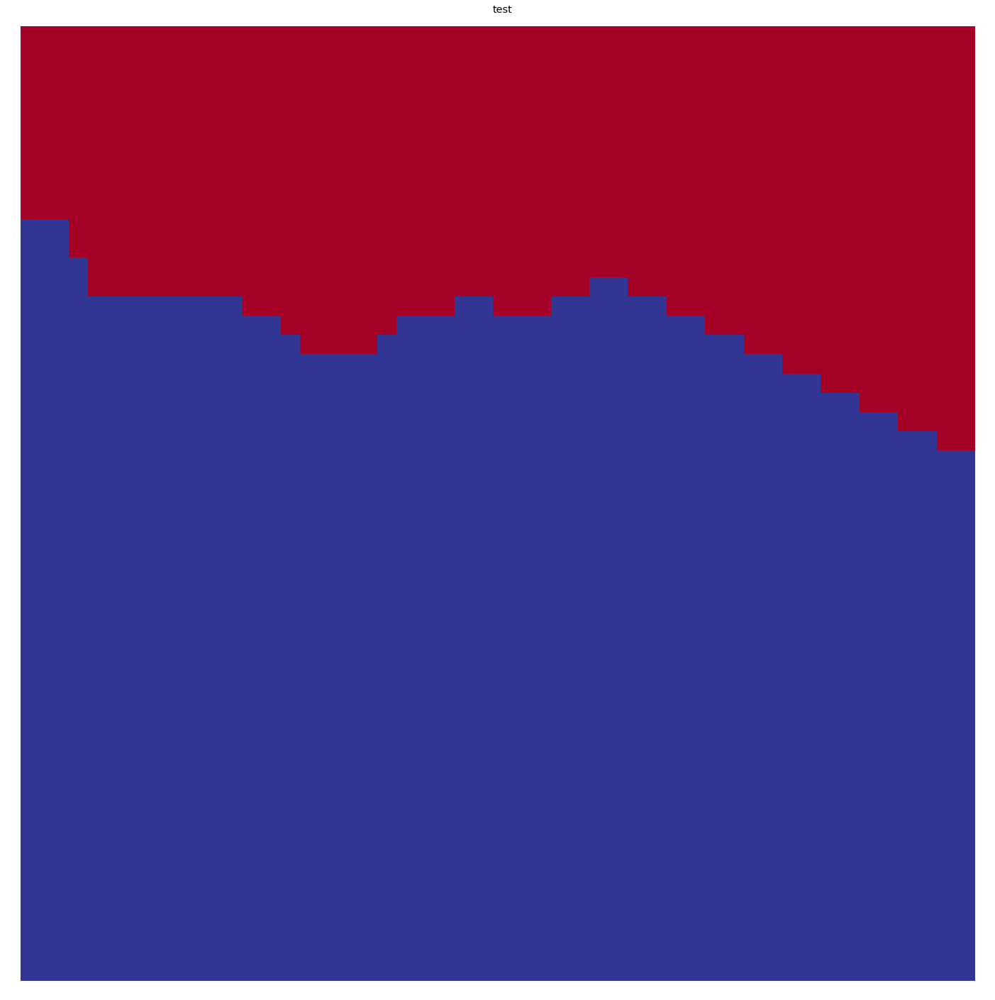

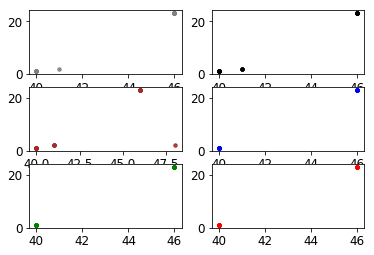

In [93]:
data = group_0_10 + group_30_39
new_som = sompy.SOMFactory.build(data, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='', train_rough_len=1000)

v  = sompy.mapview.View2DPacked(1, 1, 'test',text_size=12)  
new_som.cluster(n_clusters=2)
v.show(new_som, what='cluster')

plot_data(new_som)

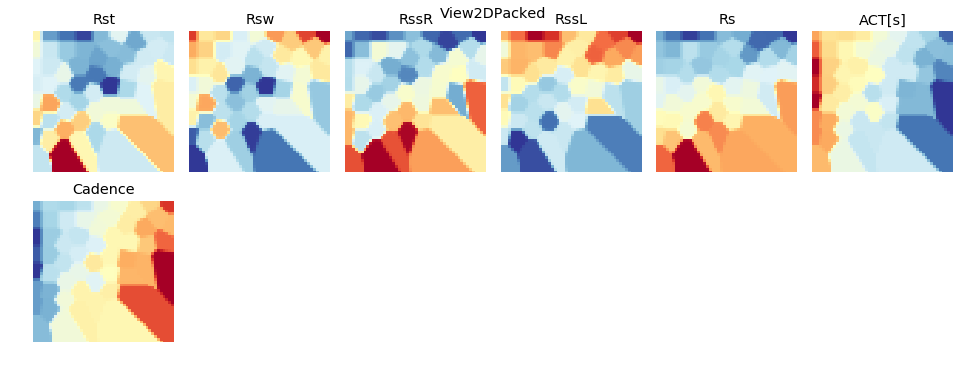

In [94]:
som.component_names = ['Rst', 'Rsw', 'RssR', 'RssL', 'Rs', 'ACT[s]', 'Cadence']
v  = sompy.mapview.View2DPacked(5, 5, 'View2DPacked',text_size=12)
v.show(som, what='codebook', cmap=None, col_sz=6) #which_dim='all' default
# v.save('2d_packed_test')

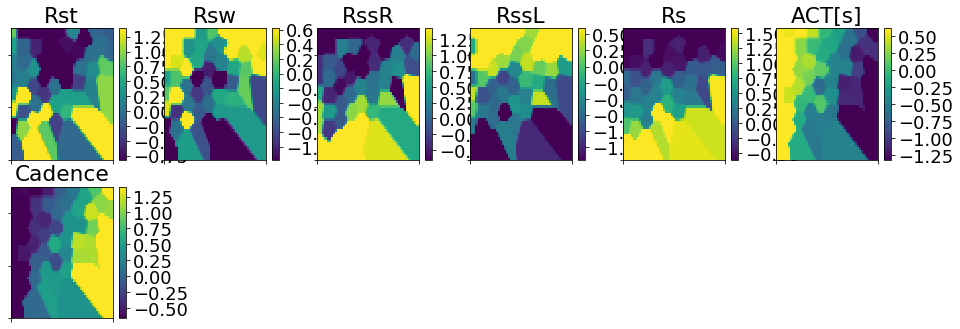

In [95]:
v  = sompy.mapview.View2D(5, 5, 'View2D',text_size=18)  
v.show(som, what='codebook', cmap=None, col_sz=6) #which_dim='all' default

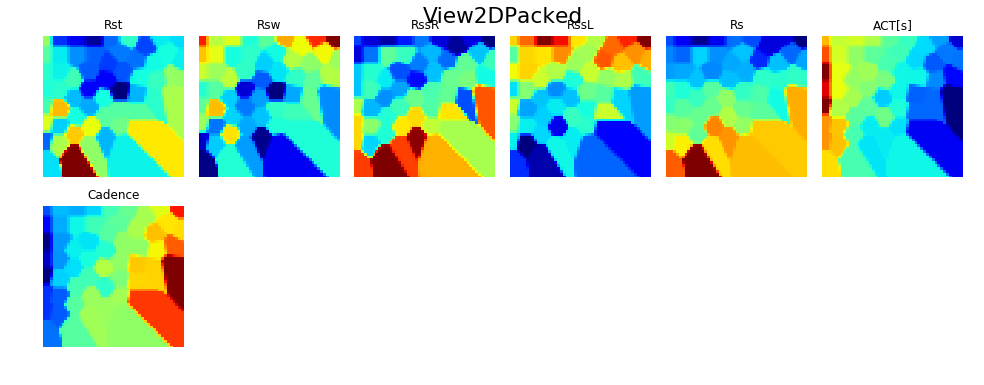

In [96]:
som.component_names = ['Rst', 'Rsw', 'RssR', 'RssL', 'Rs', 'ACT[s]', 'Cadence']
v = sompy.mapview.View2DPacked(50, 50, 'View2DPacked',text_size=10)  
v.show(som, what='codebook', which_dim='all', cmap='jet', col_sz=6)

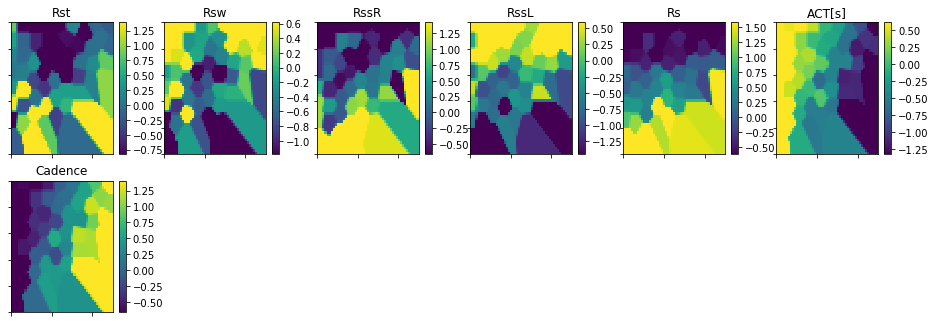

In [97]:
som.component_names = ['Rst', 'Rsw', 'RssR', 'RssL', 'Rs', 'ACT[s]', 'Cadence']
v = sompy.mapview.View2D(5, 5, 'test',text_size=10)  
v.show(som, what='codebook', which_dim='all', cmap='jet', col_sz=6) #which_dim='all' default

## SOM and KMEANS (will be replaced by CMEANS)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


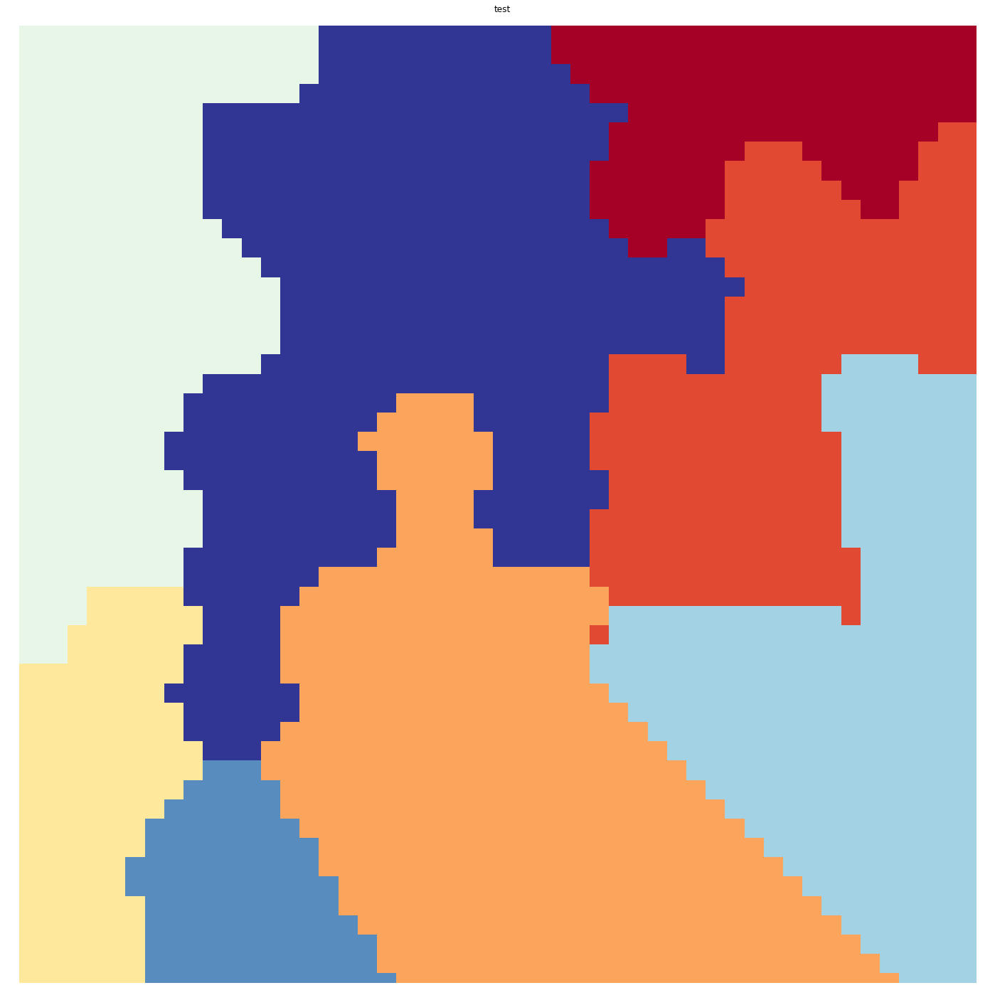

In [98]:
v  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
som.cluster()
v.show(som, what='cluster')

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


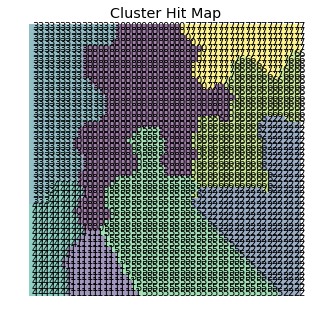

array([[   0,    0,    0],
       [   0,    1,    1],
       [   0,    2,    2],
       ...,
       [  49,   47, 2497],
       [  49,   48, 2498],
       [  49,   49, 2499]])

In [99]:
hitmap  = sompy.hitmap.HitMapView(5,5,"Cluster Hit Map",text_size=14)
hitmap.show(som)

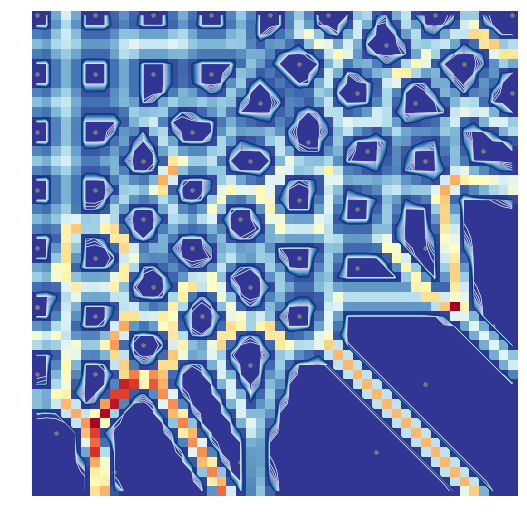

([], array([[9.29922019e-06, 1.69506532e-03, 3.42250255e-01, ...,
         2.30588474e-05, 5.00000000e-07, 0.00000000e+00],
        [1.02396037e-03, 2.16949536e-03, 2.74610395e-01, ...,
         1.22892979e-03, 2.26744120e-05, 7.50000000e-07],
        [2.06148537e-01, 1.66266285e-01, 4.37861017e-01, ...,
         1.53470304e-01, 3.45448917e-03, 5.75173758e-04],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         6.92820323e-07, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.56298752e-05, 6.92820323e-07, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.13048506e-03, 3.52016847e-05, 5.77350269e-07]]))

In [100]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(som)

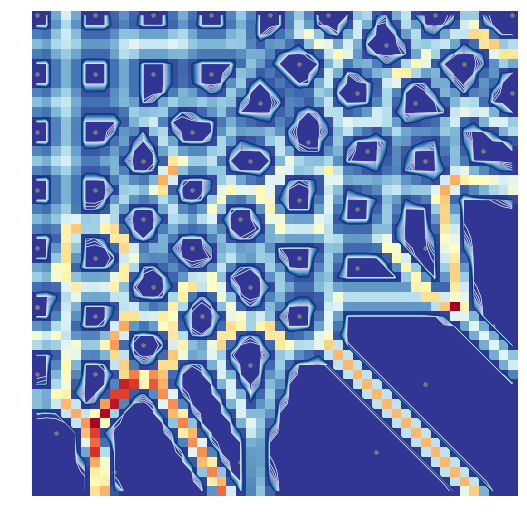

In [101]:
u  = sompy.umatrix.UMatrixView(100,100,"Unified Distance Matrix", show_axis=True, text_size=8, show_text=True)

#This is the Umat value
UMAT  = u.build_u_matrix(som, distance=1, row_normalized=False)

#Here you have Umatrix plus its render
UMAT = u.show(som, distance2=1, row_normalized=False, show_data=True, contooor=True, blob=False)

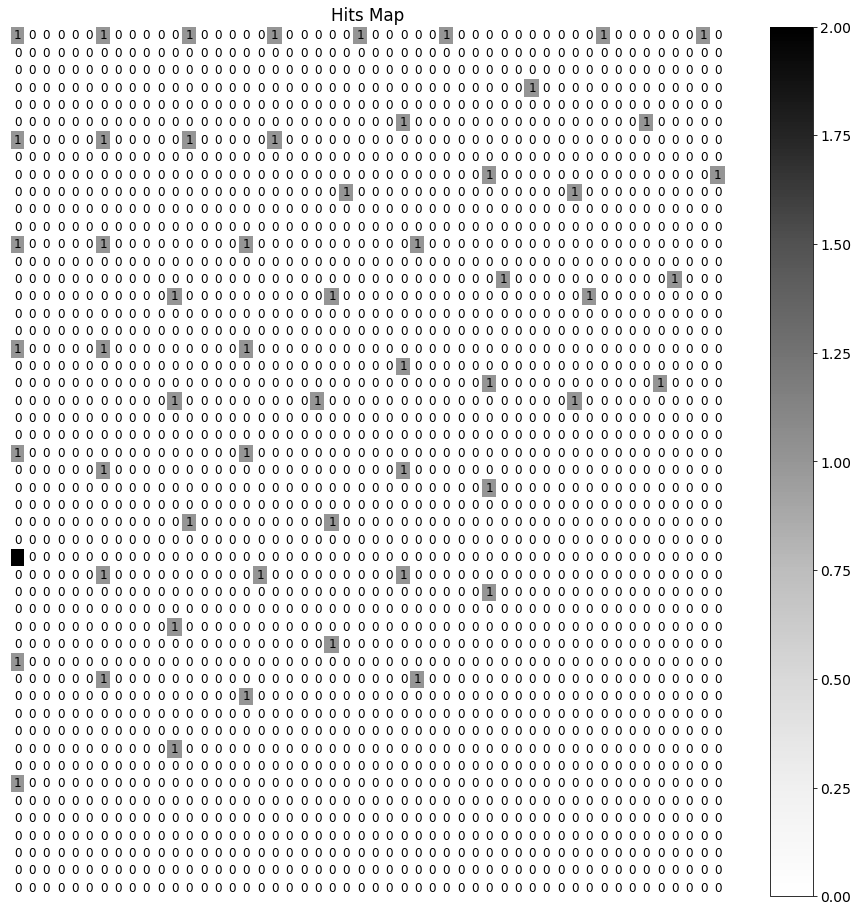

In [102]:
from sompy.visualization.bmuhits import BmuHitsView
bmuhits  = BmuHitsView(100,100,"Hits Map",text_size=14)
bmuhits.show(som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

In [103]:
data_location = '/home/sarai/Documents/UPE/tcc/hybrid-approach/5_gait_symmetry_ratios_and_2_kinematic_features_from_180_samples2.csv'
data = pd.read_csv(data_location)
data.head()
data = data.values

## 0 - 10

In [104]:
mapsize = [40,40]
new_som = sompy.SOMFactory.build(group_0_10, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 30 and data dimension is 7
      > map size is 40,40
      > array size in log10 scale is 5.526339277389844
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.062000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.250000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1 ---> elapsed time:  0.228000, quantization error: 1.069120

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 2 ---> elapsed time:  0.272000, quantization error: 0.632388

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 3 ---> elapsed time:  0.257000, quantization error: 0.505349

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 52 ---> elapsed time:  0.215000, quantization error: 0.415741

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 53 ---> elapsed time:  0.213000, quantization error: 0.414185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 54 ---> elapsed time:  0.218000, quantization error: 0.412630

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 55 ---> elapsed time:  0.214000, quantization error: 0.411076

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 56 ---> elapsed time:  0.217000, quantization error: 0.409523

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 57 ---> elapsed time:  0.215000, quantization error: 0.407972

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 58 ---> elapsed time:  0.219000,

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 106 ---> elapsed time:  0.214000, quantization error: 0.334346

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 107 ---> elapsed time:  0.213000, quantization error: 0.332730

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 108 ---> elapsed time:  0.218000, quantization error: 0.331115

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 109 ---> elapsed time:  0.213000, quantization error: 0.328637

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 110 ---> elapsed time:  0.214000, quantization error: 0.327021

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 111 ---> elapsed time:  0.213000, quantization error: 0.325382

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 160 ---> elapsed time:  0.218000, quantization error: 0.228884

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 161 ---> elapsed time:  0.211000, quantization error: 0.227219

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 162 ---> elapsed time:  0.216000, quantization error: 0.225558

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 163 ---> elapsed time:  0.213000, quantization error: 0.223901

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 164 ---> elapsed time:  0.214000, quantization error: 0.222248

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 165 ---> elapsed time:  0.214000, quantization error: 0.220599

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 214 ---> elapsed time:  0.215000, quantization error: 0.144123

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 215 ---> elapsed time:  0.220000, quantization error: 0.143714

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 216 ---> elapsed time:  0.211000, quantization error: 0.140426

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 217 ---> elapsed time:  0.213000, quantization error: 0.139103

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 218 ---> elapsed time:  0.213000, quantization error: 0.137230

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 219 ---> elapsed time:  0.205000, quantization error: 0.133318

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 268 ---> elapsed time:  0.215000, quantization error: 0.069531

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 269 ---> elapsed time:  0.214000, quantization error: 0.068428

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 270 ---> elapsed time:  0.219000, quantization error: 0.067336

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 271 ---> elapsed time:  0.215000, quantization error: 0.066254

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 272 ---> elapsed time:  0.208000, quantization error: 0.065183

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 273 ---> elapsed time:  0.228000, quantization error: 0.064123

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 322 ---> elapsed time:  0.219000, quantization error: 0.022679

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 323 ---> elapsed time:  0.224000, quantization error: 0.022111

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 324 ---> elapsed time:  0.221000, quantization error: 0.021554

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 325 ---> elapsed time:  0.213000, quantization error: 0.021007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 326 ---> elapsed time:  0.214000, quantization error: 0.020470

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 327 ---> elapsed time:  0.214000, quantization error: 0.019943

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 376 ---> elapsed time:  0.215000, quantization error: 0.003346

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 377 ---> elapsed time:  0.208000, quantization error: 0.003208

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 378 ---> elapsed time:  0.214000, quantization error: 0.003075

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 379 ---> elapsed time:  0.214000, quantization error: 0.002947

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 380 ---> elapsed time:  0.214000, quantization error: 0.002819

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 381 ---> elapsed time:  0.215000, quantization error: 0.002604

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 430 ---> elapsed time:  0.221000, quantization error: 0.000133

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 431 ---> elapsed time:  0.240000, quantization error: 0.000122

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 432 ---> elapsed time:  0.213000, quantization error: 0.000113

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 433 ---> elapsed time:  0.211000, quantization error: 0.000105

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 434 ---> elapsed time:  0.235000, quantization error: 0.000097

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 435 ---> elapsed time:  0.212000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 484 ---> elapsed time:  0.268000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 485 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 486 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 487 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 488 ---> elapsed time:  0.258000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 489 ---> elapsed time:  0.253000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 epoch: 37 ---> elapsed time:  0.241000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 38 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 39 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 40 ---> elapsed time:  0.239000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 41 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 42 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 43 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 92 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 93 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 94 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 95 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 96 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 97 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 145 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 146 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 147 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 148 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 149 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 150 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 199 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 200 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 201 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 202 ---> elapsed time:  0.245000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 203 ---> elapsed time:  0.208000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 204 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 253 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 254 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 255 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 256 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 257 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 258 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 307 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 308 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 309 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 310 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 311 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 312 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 361 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 362 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 363 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 364 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 365 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 366 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 415 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 416 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 417 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 418 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 419 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 420 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 469 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 470 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 471 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 472 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 473 ---> elapsed time:  0.253000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 474 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 523 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 524 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 525 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 526 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 527 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 528 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 577 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 578 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 579 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 580 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 581 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 582 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 631 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 632 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 633 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 634 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 635 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 636 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 685 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 686 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 687 ---> elapsed time:  0.239000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 688 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 689 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 690 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 739 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 740 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 741 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 742 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 743 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 744 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 793 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 794 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 795 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 796 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 797 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 798 ---> elapsed time:  0.193000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 847 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 848 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 849 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 850 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 851 ---> elapsed time:  0.240000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 852 ---> elapsed time:  0.245000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 901 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 902 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 903 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 904 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 905 ---> elapsed time:  0.256000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 906 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 955 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 956 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 957 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 958 ---> elapsed time:  0.234000, quantization error: 0.000001

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 959 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 960 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 epoch: 1008 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1009 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1010 ---> elapsed time:  0.252000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1011 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1012 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1013 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1014 ---> elapsed time:  0.211000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1062 ---> elapsed time:  0.230000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1063 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1064 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1065 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1066 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.118000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1067 ---> elapsed time:  0.238000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1115 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1116 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1117 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1118 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1119 ---> elapsed time:  0.230000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1120 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1121 ---> elapsed ti

 epoch: 1168 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1169 ---> elapsed time:  0.255000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1170 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1171 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1172 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1173 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1174 ---> elapsed time:  0.217000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1222 ---> elapsed time:  0.243000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1223 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1224 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1225 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1226 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1227 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1275 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1276 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1277 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1278 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1279 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1280 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1281 ---> elapsed ti

 epoch: 1328 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1329 ---> elapsed time:  0.247000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1330 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1331 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1332 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1333 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1334 ---> elapsed time:  0.217000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1382 ---> elapsed time:  0.246000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1383 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1384 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1385 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1386 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1387 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1435 ---> elapsed time:  0.238000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1436 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1437 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1438 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 1439 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1440 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1441 ---> elapsed ti

 epoch: 1488 ---> elapsed time:  0.262000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1489 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1490 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1491 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1492 ---> elapsed time:  0.242000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1493 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1494 ---> elapsed time:  0.218000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1542 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1543 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1544 ---> elapsed time:  0.230000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1545 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1546 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1547 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 sec

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1595 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1596 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1597 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1598 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1599 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1600 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 1601 ---> elapsed ti

 epoch: 1648 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1649 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1650 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1651 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1652 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 1653 ---> elapsed time:  0.244000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1654 ---> elapsed time:  0.219000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1702 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1703 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1704 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1705 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1706 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1707 ---> elapsed time:  0.254000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1755 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1756 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1757 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1758 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1759 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1760 ---> elapsed time:  0.234000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1761 ---> elapsed ti

 epoch: 1808 ---> elapsed time:  0.240000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1809 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1810 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1811 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1812 ---> elapsed time:  0.237000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1813 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1814 ---> elapsed time:  0.232000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1862 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1863 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1864 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1865 ---> elapsed time:  0.247000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1866 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1867 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 sec

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1915 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1916 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 1917 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1918 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1919 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1920 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1921 ---> elapsed ti

 epoch: 1968 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1969 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1970 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1971 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1972 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1973 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1974 ---> elapsed time:  0.216000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2022 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 2023 ---> elapsed time:  0.237000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2024 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2025 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2026 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2027 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 sec

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2075 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2076 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2077 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 2078 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 2079 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2080 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2081 ---> elapsed ti

 epoch: 2128 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2129 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2130 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 2131 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2132 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2133 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2134 ---> elapsed time:  0.217000, quantization error: 0.000001

 --

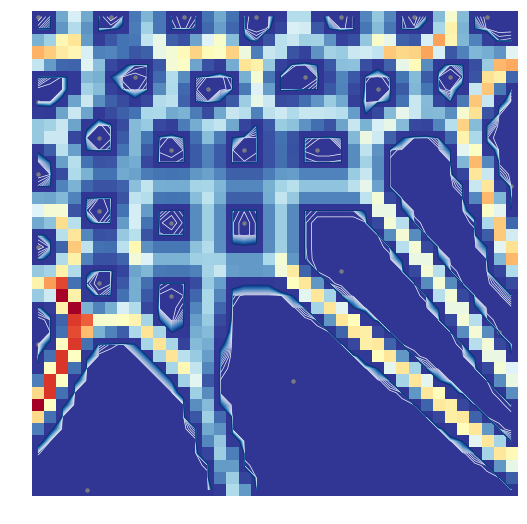

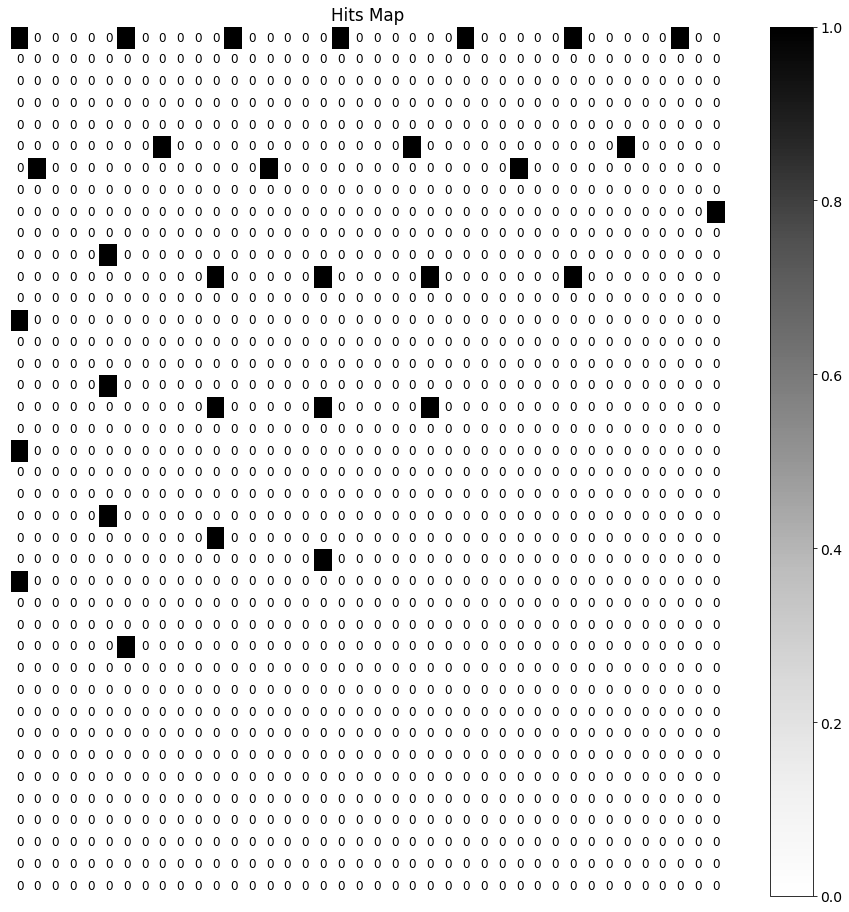

In [105]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(new_som)

from sompy.visualization.bmuhits import BmuHitsView
bmuhits  = BmuHitsView(50,50,"Hits Map",text_size=14)
bmuhits.show(new_som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

## 10 - 19

In [106]:
mapsize = [40,40]
new_som = sompy.SOMFactory.build(group_10_19, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 30 and data dimension is 7
      > map size is 40,40
      > array size in log10 scale is 5.526339277389844
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.034000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.250000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1 ---> elapsed time:  0.245000, quantization error: 1.125526

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 epoch: 2 ---> elapsed time:  0.230000, quantization error: 0.672188

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 3 ---> elapsed time:  0.215000, quantization error: 0.577098

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 52 ---> elapsed time:  0.220000, quantization error: 0.418114

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 53 ---> elapsed time:  0.223000, quantization error: 0.416393

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 54 ---> elapsed time:  0.216000, quantization error: 0.414672

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 55 ---> elapsed time:  0.229000, quantization error: 0.412950

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 56 ---> elapsed time:  0.225000, quantization error: 0.411218

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 57 ---> elapsed time:  0.217000, quantization error: 0.411870

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 58 ---> elapsed time:  0.214000,

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 106 ---> elapsed time:  0.212000, quantization error: 0.322629

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 107 ---> elapsed time:  0.216000, quantization error: 0.320871

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 108 ---> elapsed time:  0.221000, quantization error: 0.319113

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 109 ---> elapsed time:  0.219000, quantization error: 0.317350

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 110 ---> elapsed time:  0.216000, quantization error: 0.314227

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 111 ---> elapsed time:  0.213000, quantization error: 0.312428

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 160 ---> elapsed time:  0.218000, quantization error: 0.223444

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 161 ---> elapsed time:  0.216000, quantization error: 0.221616

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 162 ---> elapsed time:  0.230000, quantization error: 0.219792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 163 ---> elapsed time:  0.214000, quantization error: 0.217974

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 164 ---> elapsed time:  0.220000, quantization error: 0.216160

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 165 ---> elapsed time:  0.214000, quantization error: 0.214352

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 214 ---> elapsed time:  0.213000, quantization error: 0.127618

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 215 ---> elapsed time:  0.214000, quantization error: 0.126132

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 216 ---> elapsed time:  0.219000, quantization error: 0.124654

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 217 ---> elapsed time:  0.229000, quantization error: 0.123185

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 218 ---> elapsed time:  0.213000, quantization error: 0.121725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 219 ---> elapsed time:  0.209000, quantization error: 0.120273

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 268 ---> elapsed time:  0.219000, quantization error: 0.058926

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 269 ---> elapsed time:  0.214000, quantization error: 0.057890

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 270 ---> elapsed time:  0.221000, quantization error: 0.056866

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 271 ---> elapsed time:  0.214000, quantization error: 0.055853

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 272 ---> elapsed time:  0.216000, quantization error: 0.054850

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 273 ---> elapsed time:  0.213000, quantization error: 0.053859

 find_bmu took: 0.113000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 322 ---> elapsed time:  0.213000, quantization error: 0.018106

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 323 ---> elapsed time:  0.207000, quantization error: 0.017629

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.025000 seconds
 epoch: 324 ---> elapsed time:  0.231000, quantization error: 0.017161

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 325 ---> elapsed time:  0.217000, quantization error: 0.016703

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 326 ---> elapsed time:  0.211000, quantization error: 0.016253

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 327 ---> elapsed time:  0.220000, quantization error: 0.015810

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 376 ---> elapsed time:  0.217000, quantization error: 0.002357

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 377 ---> elapsed time:  0.214000, quantization error: 0.002251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 378 ---> elapsed time:  0.219000, quantization error: 0.002148

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 379 ---> elapsed time:  0.214000, quantization error: 0.002050

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 380 ---> elapsed time:  0.216000, quantization error: 0.001955

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 381 ---> elapsed time:  0.214000, quantization error: 0.001864

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 430 ---> elapsed time:  0.218000, quantization error: 0.000071

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 431 ---> elapsed time:  0.236000, quantization error: 0.000066

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 432 ---> elapsed time:  0.218000, quantization error: 0.000060

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 433 ---> elapsed time:  0.212000, quantization error: 0.000055

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 434 ---> elapsed time:  0.208000, quantization error: 0.000051

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 435 ---> elapsed time:  0.214000, quantization error: 0.000046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 484 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 485 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 486 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 487 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 488 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 489 ---> elapsed time:  0.256000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 epoch: 37 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 38 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 39 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 40 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 41 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 42 ---> elapsed time:  0.254000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 43 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 92 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 93 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 94 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 95 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 96 ---> elapsed time:  0.238000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 97 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0

 update_codebook_voronoi took: 0.015000 seconds
 epoch: 145 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 146 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 147 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 148 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 149 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 150 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 199 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 200 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 201 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.032000 seconds
 epoch: 202 ---> elapsed time:  0.243000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 203 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 204 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 253 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 254 ---> elapsed time:  0.207000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 255 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 256 ---> elapsed time:  0.266000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 257 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 258 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 307 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 308 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 309 ---> elapsed time:  0.260000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 310 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 311 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 312 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 361 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 362 ---> elapsed time:  0.240000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 363 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 364 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 365 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 366 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 415 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 416 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 417 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 418 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 419 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 420 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 469 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 470 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 471 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 472 ---> elapsed time:  0.243000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 473 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 474 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 523 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 524 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 525 ---> elapsed time:  0.238000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 526 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 527 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 528 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 577 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 578 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 579 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 580 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 581 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 582 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 631 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 632 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 633 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 634 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 635 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 636 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 685 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 686 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 687 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 688 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 689 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 690 ---> elapsed time:  0.246000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 739 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 740 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 741 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 742 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 743 ---> elapsed time:  0.241000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 744 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 793 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 794 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 795 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 796 ---> elapsed time:  0.237000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 797 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 798 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 847 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 848 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 849 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 850 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 851 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 852 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 901 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 902 ---> elapsed time:  0.240000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 903 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 904 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 905 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 906 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 955 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 956 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 957 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 958 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 959 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 960 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 epoch: 1008 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1009 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1010 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 1011 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1012 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1013 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1014 ---> elapsed time:  0.216000, quantization error: 0.000001

 fi

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1062 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1063 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1064 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1065 ---> elapsed time:  0.242000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1066 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1067 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.018000 seconds
 epoch: 1115 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1116 ---> elapsed time:  0.239000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1117 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 1118 ---> elapsed time:  0.266000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1119 ---> elapsed time:  0.272000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1120 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1121 ---> elapsed ti

 epoch: 1168 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1169 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.108000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1170 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1171 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1172 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1173 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1174 ---> elapsed time:  0.231000, quantization error: 0.000001

 fi

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1222 ---> elapsed time:  0.239000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1223 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1224 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1225 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1226 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1227 ---> elapsed time:  0.246000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1275 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1276 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1277 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1278 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1279 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1280 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1281 ---> elapsed ti

 epoch: 1328 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1329 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1330 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1331 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1332 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1333 ---> elapsed time:  0.263000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1334 ---> elapsed time:  0.217000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1382 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1383 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1384 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1385 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1386 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1387 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1435 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1436 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1437 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1438 ---> elapsed time:  0.237000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1439 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1440 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1441 ---> elapsed ti

 epoch: 1488 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1489 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1490 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1491 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1492 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1493 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1494 ---> elapsed time:  0.216000, quantization error: 0.000001

 fi

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1542 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1543 ---> elapsed time:  0.244000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1544 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1545 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1546 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1547 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1595 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1596 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1597 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1598 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1599 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1600 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1601 ---> elapsed ti

 epoch: 1648 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1649 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1650 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1651 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.025000 seconds
 epoch: 1652 ---> elapsed time:  0.247000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1653 ---> elapsed time:  0.253000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1654 ---> elapsed time:  0.215000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1702 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1703 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1704 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 1705 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1706 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1707 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1755 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1756 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1757 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 1758 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1759 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1760 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1761 ---> elapsed ti

 epoch: 1808 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1809 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1810 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1811 ---> elapsed time:  0.232000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1812 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1813 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1814 ---> elapsed time:  0.219000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1862 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 1863 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1864 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1865 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1866 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 1867 ---> elapsed time:  0.238000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1915 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1916 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1917 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1918 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1919 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.030000 seconds
 epoch: 1920 ---> elapsed time:  0.236000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1921 ---> elapsed ti

 epoch: 1968 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1969 ---> elapsed time:  0.256000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1970 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1971 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 1972 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1973 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1974 ---> elapsed time:  0.209000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2022 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2023 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.023000 seconds
 epoch: 2024 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 2025 ---> elapsed time:  0.256000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2026 ---> elapsed time:  0.272000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 2027 ---> elapsed time:  0.248000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2075 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2076 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 2077 ---> elapsed time:  0.251000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 2078 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 2079 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2080 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 2081 ---> elapsed ti

 epoch: 2128 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2129 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2130 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2131 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2132 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2133 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2134 ---> elapsed time:  0.219000, quantization error: 0.000001

 --

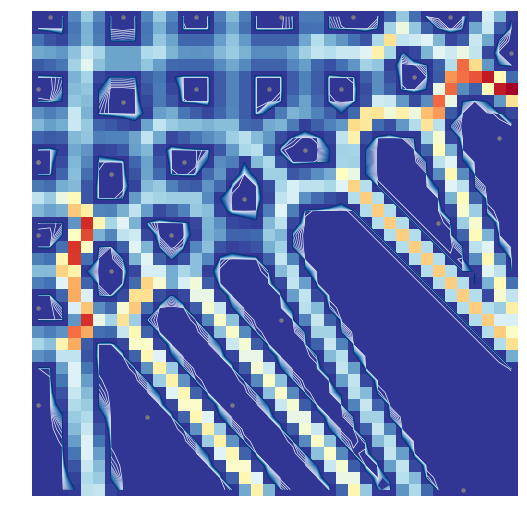

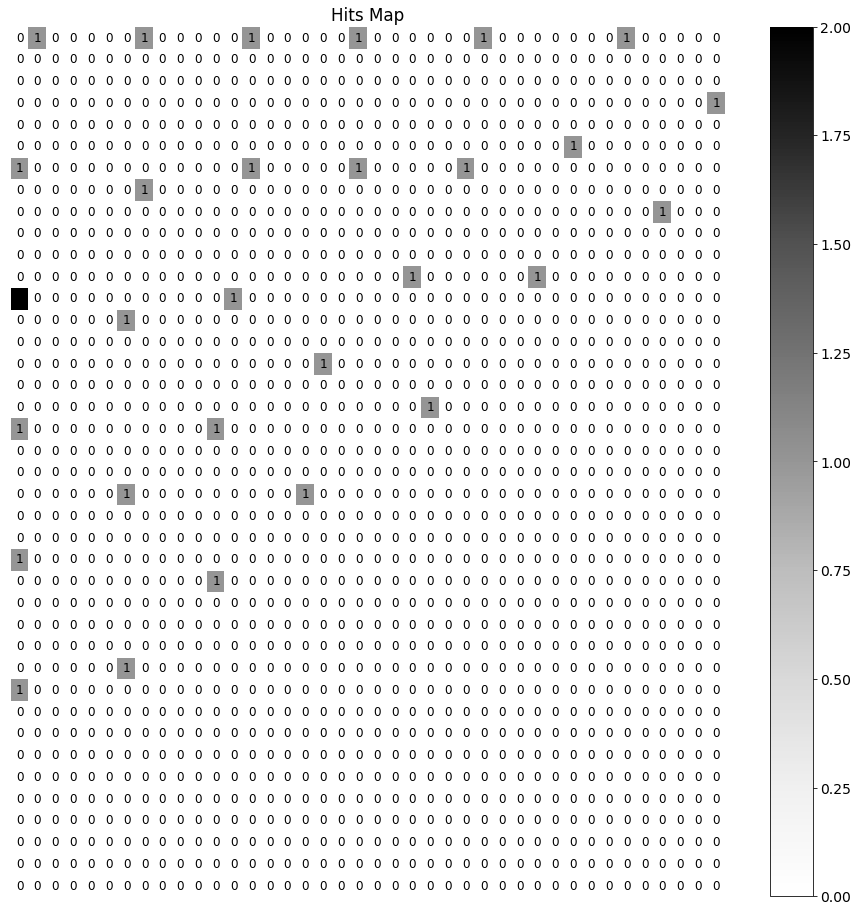

In [107]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(new_som)

from sompy.visualization.bmuhits import BmuHitsView
bmuhits  = BmuHitsView(50,50,"Hits Map",text_size=14)
bmuhits.show(new_som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

## 20 - 29

In [108]:
mapsize = [40,40]
new_som = sompy.SOMFactory.build(group_20_29, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 30 and data dimension is 7
      > map size is 40,40
      > array size in log10 scale is 5.526339277389844
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.036000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.250000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1 ---> elapsed time:  0.217000, quantization error: 1.120519

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 2 ---> elapsed time:  0.234000, quantization error: 0.748615

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 3 ---> elapsed time:  0.218000, quantization error: 0.596740

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 52 ---> elapsed time:  0.213000, quantization error: 0.436862

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 53 ---> elapsed time:  0.221000, quantization error: 0.435156

 find_bmu took: 0.111000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 54 ---> elapsed time:  0.227000, quantization error: 0.433452

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 55 ---> elapsed time:  0.212000, quantization error: 0.431749

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 56 ---> elapsed time:  0.213000, quantization error: 0.430048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 57 ---> elapsed time:  0.214000, quantization error: 0.428348

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 58 ---> elapsed time:  0.210000,

 update_codebook_voronoi took: 0.012000 seconds
 epoch: 106 ---> elapsed time:  0.216000, quantization error: 0.343509

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 107 ---> elapsed time:  0.224000, quantization error: 0.341792

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 108 ---> elapsed time:  0.241000, quantization error: 0.340078

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 109 ---> elapsed time:  0.215000, quantization error: 0.338363

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 110 ---> elapsed time:  0.213000, quantization error: 0.335967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 111 ---> elapsed time:  0.214000, quantization error: 0.331363

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 160 ---> elapsed time:  0.213000, quantization error: 0.244485

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 161 ---> elapsed time:  0.208000, quantization error: 0.242773

 find_bmu took: 0.118000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 162 ---> elapsed time:  0.238000, quantization error: 0.240967

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 163 ---> elapsed time:  0.213000, quantization error: 0.239214

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 164 ---> elapsed time:  0.214000, quantization error: 0.237466

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 165 ---> elapsed time:  0.213000, quantization error: 0.235725

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 214 ---> elapsed time:  0.216000, quantization error: 0.153514

 find_bmu took: 0.107000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 215 ---> elapsed time:  0.225000, quantization error: 0.152013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 216 ---> elapsed time:  0.219000, quantization error: 0.150521

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 217 ---> elapsed time:  0.214000, quantization error: 0.149037

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 218 ---> elapsed time:  0.213000, quantization error: 0.147561

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 219 ---> elapsed time:  0.212000, quantization error: 0.146094

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 268 ---> elapsed time:  0.212000, quantization error: 0.076879

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.027000 seconds
 epoch: 269 ---> elapsed time:  0.230000, quantization error: 0.075790

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 270 ---> elapsed time:  0.228000, quantization error: 0.074711

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 271 ---> elapsed time:  0.213000, quantization error: 0.073640

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 272 ---> elapsed time:  0.214000, quantization error: 0.072526

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 273 ---> elapsed time:  0.209000, quantization error: 0.070744

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 322 ---> elapsed time:  0.213000, quantization error: 0.027961

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 323 ---> elapsed time:  0.215000, quantization error: 0.027370

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 324 ---> elapsed time:  0.251000, quantization error: 0.026789

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 325 ---> elapsed time:  0.217000, quantization error: 0.026216

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 326 ---> elapsed time:  0.214000, quantization error: 0.025654

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 327 ---> elapsed time:  0.213000, quantization error: 0.025100

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 376 ---> elapsed time:  0.214000, quantization error: 0.004894

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 377 ---> elapsed time:  0.214000, quantization error: 0.004714

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 378 ---> elapsed time:  0.236000, quantization error: 0.004539

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 379 ---> elapsed time:  0.213000, quantization error: 0.004370

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 380 ---> elapsed time:  0.214000, quantization error: 0.004205

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 381 ---> elapsed time:  0.213000, quantization error: 0.004046

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 430 ---> elapsed time:  0.221000, quantization error: 0.000354

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 431 ---> elapsed time:  0.241000, quantization error: 0.000333

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 432 ---> elapsed time:  0.213000, quantization error: 0.000314

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 433 ---> elapsed time:  0.214000, quantization error: 0.000295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 434 ---> elapsed time:  0.214000, quantization error: 0.000277

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 435 ---> elapsed time:  0.230000, quantization error: 0.000261

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 484 ---> elapsed time:  0.230000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 485 ---> elapsed time:  0.212000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 486 ---> elapsed time:  0.214000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 487 ---> elapsed time:  0.214000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 488 ---> elapsed time:  0.213000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 489 ---> elapsed time:  0.213000, quantization error: 0.000002

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 epoch: 37 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 38 ---> elapsed time:  0.246000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 39 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 40 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 41 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 42 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 43 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 92 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 93 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 94 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 95 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 96 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 97 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0

 update_codebook_voronoi took: 0.014000 seconds
 epoch: 145 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 146 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 147 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 148 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 149 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 150 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 199 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 200 ---> elapsed time:  0.234000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 201 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 202 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 203 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.023000 seconds
 epoch: 204 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 253 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 254 ---> elapsed time:  0.242000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 255 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 256 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 257 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 258 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 307 ---> elapsed time:  0.230000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 308 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 309 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 310 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 311 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 312 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 361 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 362 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 363 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 364 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 365 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 366 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 415 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 416 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 417 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 418 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 419 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 420 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 469 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 470 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 471 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 472 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 473 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 474 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 523 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 524 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 525 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 526 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 527 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 528 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 577 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 578 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 579 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 580 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 581 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 582 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 631 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 632 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 633 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 634 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 635 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 636 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.011000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 685 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 686 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 687 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 688 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 689 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 690 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 739 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 740 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 741 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 742 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 743 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 744 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 793 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 794 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 795 ---> elapsed time:  0.234000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 796 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 797 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 798 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 847 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 848 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 849 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 850 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 851 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 852 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 901 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 902 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 903 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 904 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 905 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 906 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 955 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 956 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 957 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 958 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 959 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 960 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 epoch: 1008 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1009 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1010 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1011 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1012 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1013 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1014 ---> elapsed time:  0.215000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1062 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1063 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 1064 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1065 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1066 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1067 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1115 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1116 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1117 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1118 ---> elapsed time:  0.247000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1119 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1120 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1121 ---> elapsed ti

 epoch: 1168 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1169 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1170 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.109000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 1171 ---> elapsed time:  0.246000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1172 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1173 ---> elapsed time:  0.207000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1174 ---> elapsed time:  0.213000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1222 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1223 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1224 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1225 ---> elapsed time:  0.262000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1226 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1227 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1275 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1276 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1277 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1278 ---> elapsed time:  0.236000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 1279 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1280 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1281 ---> elapsed ti

 epoch: 1328 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1329 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1330 ---> elapsed time:  0.228000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1331 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1332 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1333 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1334 ---> elapsed time:  0.218000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1382 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1383 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1384 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1385 ---> elapsed time:  0.229000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1386 ---> elapsed time:  0.207000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1387 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1435 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1436 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1437 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1438 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1439 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1440 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1441 ---> elapsed ti

 epoch: 1488 ---> elapsed time:  0.245000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1489 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1490 ---> elapsed time:  0.213000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1491 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1492 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1493 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1494 ---> elapsed time:  0.212000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1542 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1543 ---> elapsed time:  0.211000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1544 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1545 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1546 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1547 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1595 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1596 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1597 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1598 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1599 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1600 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1601 ---> elapsed ti

 epoch: 1648 ---> elapsed time:  0.212000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1649 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 epoch: 1650 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1651 ---> elapsed time:  0.226000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1652 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 1653 ---> elapsed time:  0.223000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1654 ---> elapsed time:  0.217000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1702 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1703 ---> elapsed time:  0.227000, quantization error: 0.000001

 find_bmu took: 0.115000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1704 ---> elapsed time:  0.235000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1705 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1706 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1707 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1755 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 1756 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1757 ---> elapsed time:  0.234000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1758 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1759 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1760 ---> elapsed time:  0.214000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 epoch: 1761 ---> elapsed ti

 epoch: 1808 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1809 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1810 ---> elapsed time:  0.230000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1811 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1812 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1813 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1814 ---> elapsed time:  0.223000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1862 ---> elapsed time:  0.209000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1863 ---> elapsed time:  0.252000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1864 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1865 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1866 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 1867 ---> elapsed time:  0.231000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1915 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1916 ---> elapsed time:  0.233000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1917 ---> elapsed time:  0.210000, quantization error: 0.000001

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1918 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1919 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.106000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1920 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 1921 ---> elapsed ti

 epoch: 1968 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1969 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1970 ---> elapsed time:  0.222000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 1971 ---> elapsed time:  0.215000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1972 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 1973 ---> elapsed time:  0.224000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1974 ---> elapsed time:  0.216000, quantization error: 0.000001

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 2022 ---> elapsed time:  0.240000, quantization error: 0.000001

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2023 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2024 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2025 ---> elapsed time:  0.217000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 2026 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2027 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 sec

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2075 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2076 ---> elapsed time:  0.216000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2077 ---> elapsed time:  0.221000, quantization error: 0.000001

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 2078 ---> elapsed time:  0.218000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2079 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 2080 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2081 ---> elapsed ti

 epoch: 2128 ---> elapsed time:  0.225000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2129 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2130 ---> elapsed time:  0.219000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 2131 ---> elapsed time:  0.244000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2132 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 2133 ---> elapsed time:  0.220000, quantization error: 0.000001

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 2134 ---> elapsed time:  0.220000, quantization error: 0.000001

 --

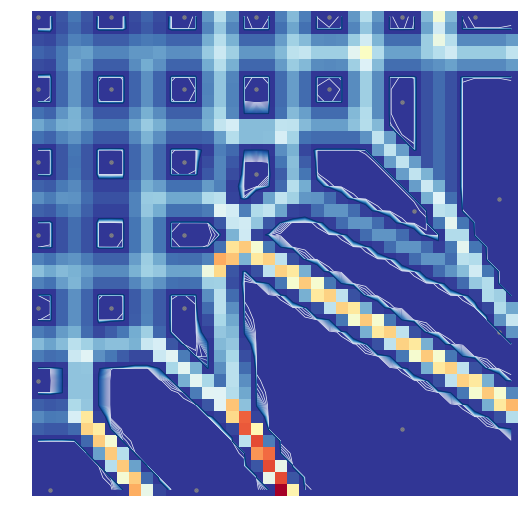

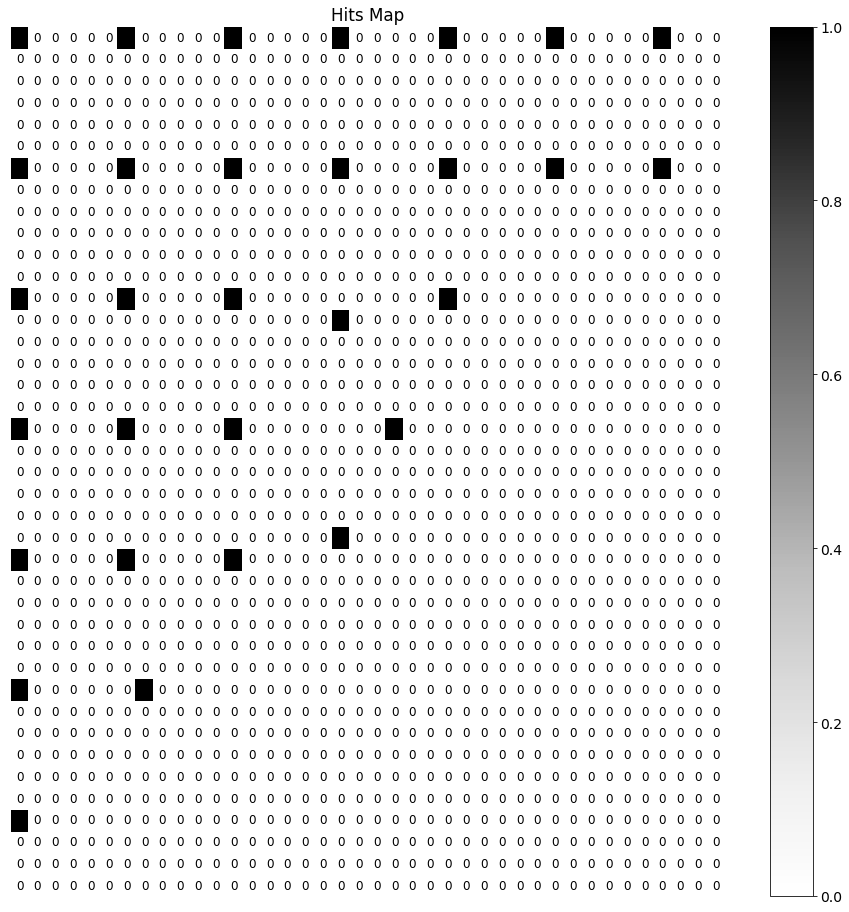

In [109]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(new_som)

from sompy.visualization.bmuhits import BmuHitsView
bmuhits  = BmuHitsView(50,50,"Hits Map",text_size=14)
bmuhits.show(new_som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

In [110]:
# SOM with 0 - 19
group_0_19 = data[:60]
mapsize = [40,40]
new_som = sompy.SOMFactory.build(group_0_19, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='debug', train_rough_len=500)

 Training...
--------------------------------------------------------------
 details: 
      > data len is 60 and data dimension is 7
      > map size is 40,40
      > array size in log10 scale is 5.827369273053825
      > number of jobs in parallel: 1
 -------------------------------------------------------------

 pca_linear_initialization took: 0.044000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.250000, trainlen: 500

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 1 ---> elapsed time:  0.218000, quantization error: 1.191263

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 epoch: 2 ---> elapsed time:  0.231000, quantization error: 0.888858

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 3 ---> elapsed time:  0.255000, quantization error: 0.775328

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 4 ---> el

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 52 ---> elapsed time:  0.248000, quantization error: 0.684859

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 53 ---> elapsed time:  0.213000, quantization error: 0.683985

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 54 ---> elapsed time:  0.213000, quantization error: 0.682705

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 55 ---> elapsed time:  0.214000, quantization error: 0.681584

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 56 ---> elapsed time:  0.217000, quantization error: 0.680463

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 57 ---> elapsed time:  0.214000, quantization error: 0.679343

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 58 ---> elapsed time:  0.214000,

 update_codebook_voronoi took: 0.012000 seconds
 epoch: 106 ---> elapsed time:  0.213000, quantization error: 0.622674

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 107 ---> elapsed time:  0.213000, quantization error: 0.620760

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 108 ---> elapsed time:  0.218000, quantization error: 0.618467

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 109 ---> elapsed time:  0.214000, quantization error: 0.617969

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 110 ---> elapsed time:  0.211000, quantization error: 0.616721

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 111 ---> elapsed time:  0.209000, quantization error: 0.615472

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 112 ---> elapsed time:  0.

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 160 ---> elapsed time:  0.221000, quantization error: 0.542684

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 161 ---> elapsed time:  0.213000, quantization error: 0.541808

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 162 ---> elapsed time:  0.212000, quantization error: 0.540390

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 163 ---> elapsed time:  0.214000, quantization error: 0.538706

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 164 ---> elapsed time:  0.221000, quantization error: 0.537285

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 165 ---> elapsed time:  0.209000, quantization error: 0.535864

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 214 ---> elapsed time:  0.219000, quantization error: 0.458015

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 215 ---> elapsed time:  0.210000, quantization error: 0.455358

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 216 ---> elapsed time:  0.215000, quantization error: 0.454283

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 217 ---> elapsed time:  0.219000, quantization error: 0.452590

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 218 ---> elapsed time:  0.214000, quantization error: 0.450895

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 219 ---> elapsed time:  0.214000, quantization error: 0.449200

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.017000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 268 ---> elapsed time:  0.218000, quantization error: 0.355547

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 269 ---> elapsed time:  0.213000, quantization error: 0.353641

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 270 ---> elapsed time:  0.213000, quantization error: 0.351735

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 271 ---> elapsed time:  0.214000, quantization error: 0.349828

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 272 ---> elapsed time:  0.216000, quantization error: 0.347911

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 273 ---> elapsed time:  0.213000, quantization error: 0.345462

 find_bmu took: 0.103000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 322 ---> elapsed time:  0.216000, quantization error: 0.232895

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 323 ---> elapsed time:  0.213000, quantization error: 0.230704

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 324 ---> elapsed time:  0.247000, quantization error: 0.228517

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 325 ---> elapsed time:  0.215000, quantization error: 0.226333

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 326 ---> elapsed time:  0.213000, quantization error: 0.223366

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.020000 seconds
 epoch: 327 ---> elapsed time:  0.221000, quantization error: 0.221274

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 376 ---> elapsed time:  0.231000, quantization error: 0.111643

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 377 ---> elapsed time:  0.211000, quantization error: 0.109337

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 378 ---> elapsed time:  0.213000, quantization error: 0.107013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 379 ---> elapsed time:  0.216000, quantization error: 0.104842

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 380 ---> elapsed time:  0.218000, quantization error: 0.102733

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 381 ---> elapsed time:  0.216000, quantization error: 0.100209

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 430 ---> elapsed time:  0.227000, quantization error: 0.027550

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 431 ---> elapsed time:  0.239000, quantization error: 0.026478

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 432 ---> elapsed time:  0.219000, quantization error: 0.025571

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 433 ---> elapsed time:  0.219000, quantization error: 0.024684

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.021000 seconds
 epoch: 434 ---> elapsed time:  0.248000, quantization error: 0.023819

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 435 ---> elapsed time:  0.215000, quantization error: 0.022975

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 484 ---> elapsed time:  0.217000, quantization error: 0.001448

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 485 ---> elapsed time:  0.214000, quantization error: 0.001342

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 486 ---> elapsed time:  0.210000, quantization error: 0.001242

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 487 ---> elapsed time:  0.218000, quantization error: 0.001148

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 488 ---> elapsed time:  0.233000, quantization error: 0.001060

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.028000 seconds
 epoch: 489 ---> elapsed time:  0.230000, quantization error: 0.000978

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 epoch: 37 ---> elapsed time:  0.214000, quantization error: 0.000298

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 38 ---> elapsed time:  0.213000, quantization error: 0.000297

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 39 ---> elapsed time:  0.212000, quantization error: 0.000296

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.029000 seconds
 epoch: 40 ---> elapsed time:  0.231000, quantization error: 0.000295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 41 ---> elapsed time:  0.231000, quantization error: 0.000295

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 42 ---> elapsed time:  0.216000, quantization error: 0.000294

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 43 ---> elapsed time:  0.213000, quantization error: 0.000293

 find_bmu took: 0

 epoch: 91 ---> elapsed time:  0.215000, quantization error: 0.000251

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 92 ---> elapsed time:  0.220000, quantization error: 0.000250

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 93 ---> elapsed time:  0.215000, quantization error: 0.000249

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 94 ---> elapsed time:  0.237000, quantization error: 0.000249

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 95 ---> elapsed time:  0.218000, quantization error: 0.000248

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 96 ---> elapsed time:  0.218000, quantization error: 0.000247

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 97 ---> elapsed time:  0.216000, quantization error: 0.000246

 find_bmu took: 0

 update_codebook_voronoi took: 0.013000 seconds
 epoch: 145 ---> elapsed time:  0.217000, quantization error: 0.000210

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 146 ---> elapsed time:  0.212000, quantization error: 0.000210

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 147 ---> elapsed time:  0.232000, quantization error: 0.000209

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 148 ---> elapsed time:  0.220000, quantization error: 0.000208

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 149 ---> elapsed time:  0.217000, quantization error: 0.000208

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 150 ---> elapsed time:  0.216000, quantization error: 0.000207

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 151 ---> elapsed time:  0.

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 199 ---> elapsed time:  0.214000, quantization error: 0.000175

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 200 ---> elapsed time:  0.234000, quantization error: 0.000175

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 201 ---> elapsed time:  0.215000, quantization error: 0.000174

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 202 ---> elapsed time:  0.220000, quantization error: 0.000173

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 203 ---> elapsed time:  0.214000, quantization error: 0.000173

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 204 ---> elapsed time:  0.218000, quantization error: 0.000172

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 253 ---> elapsed time:  0.214000, quantization error: 0.000145

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 254 ---> elapsed time:  0.213000, quantization error: 0.000145

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 255 ---> elapsed time:  0.220000, quantization error: 0.000144

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 256 ---> elapsed time:  0.221000, quantization error: 0.000144

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 257 ---> elapsed time:  0.218000, quantization error: 0.000143

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 258 ---> elapsed time:  0.216000, quantization error: 0.000143

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 307 ---> elapsed time:  0.218000, quantization error: 0.000117

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 308 ---> elapsed time:  0.214000, quantization error: 0.000117

 find_bmu took: 0.116000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 309 ---> elapsed time:  0.230000, quantization error: 0.000116

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 310 ---> elapsed time:  0.213000, quantization error: 0.000116

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 311 ---> elapsed time:  0.218000, quantization error: 0.000115

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 312 ---> elapsed time:  0.219000, quantization error: 0.000115

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 361 ---> elapsed time:  0.215000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 362 ---> elapsed time:  0.216000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 363 ---> elapsed time:  0.233000, quantization error: 0.000091

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.016000 seconds
 epoch: 364 ---> elapsed time:  0.219000, quantization error: 0.000090

 find_bmu took: 0.104000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 365 ---> elapsed time:  0.218000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 366 ---> elapsed time:  0.220000, quantization error: 0.000090

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.019000 seconds
 epoch: 415 ---> elapsed time:  0.222000, quantization error: 0.000074

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 416 ---> elapsed time:  0.236000, quantization error: 0.000074

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 417 ---> elapsed time:  0.215000, quantization error: 0.000074

 find_bmu took: 0.102000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 418 ---> elapsed time:  0.216000, quantization error: 0.000073

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 419 ---> elapsed time:  0.216000, quantization error: 0.000073

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 420 ---> elapsed time:  0.217000, quantization error: 0.000073

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 469 ---> elapsed time:  0.216000, quantization error: 0.000060

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 470 ---> elapsed time:  0.216000, quantization error: 0.000060

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 471 ---> elapsed time:  0.215000, quantization error: 0.000060

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 472 ---> elapsed time:  0.228000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 473 ---> elapsed time:  0.216000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 474 ---> elapsed time:  0.211000, quantization error: 0.000059

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 523 ---> elapsed time:  0.219000, quantization error: 0.000048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 524 ---> elapsed time:  0.217000, quantization error: 0.000048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 525 ---> elapsed time:  0.220000, quantization error: 0.000048

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 526 ---> elapsed time:  0.225000, quantization error: 0.000048

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 527 ---> elapsed time:  0.246000, quantization error: 0.000047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 528 ---> elapsed time:  0.225000, quantization error: 0.000047

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 577 ---> elapsed time:  0.216000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.022000 seconds
 epoch: 578 ---> elapsed time:  0.232000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 579 ---> elapsed time:  0.212000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 580 ---> elapsed time:  0.220000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 581 ---> elapsed time:  0.216000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 582 ---> elapsed time:  0.216000, quantization error: 0.000038

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 631 ---> elapsed time:  0.214000, quantization error: 0.000031

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 632 ---> elapsed time:  0.222000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 633 ---> elapsed time:  0.252000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 634 ---> elapsed time:  0.215000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 635 ---> elapsed time:  0.215000, quantization error: 0.000030

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 636 ---> elapsed time:  0.219000, quantization error: 0.000030

 find_bmu took: 0.110000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 685 ---> elapsed time:  0.214000, quantization error: 0.000023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 686 ---> elapsed time:  0.226000, quantization error: 0.000023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 687 ---> elapsed time:  0.218000, quantization error: 0.000023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 688 ---> elapsed time:  0.223000, quantization error: 0.000023

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 689 ---> elapsed time:  0.218000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 690 ---> elapsed time:  0.224000, quantization error: 0.000022

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.024000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 739 ---> elapsed time:  0.214000, quantization error: 0.000018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 740 ---> elapsed time:  0.219000, quantization error: 0.000018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 741 ---> elapsed time:  0.214000, quantization error: 0.000018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 742 ---> elapsed time:  0.219000, quantization error: 0.000018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 743 ---> elapsed time:  0.211000, quantization error: 0.000018

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 744 ---> elapsed time:  0.243000, quantization error: 0.000017

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 793 ---> elapsed time:  0.216000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 794 ---> elapsed time:  0.215000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.018000 seconds
 epoch: 795 ---> elapsed time:  0.221000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 796 ---> elapsed time:  0.221000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 797 ---> elapsed time:  0.257000, quantization error: 0.000013

 find_bmu took: 0.105000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 798 ---> elapsed time:  0.223000, quantization error: 0.000013

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 847 ---> elapsed time:  0.214000, quantization error: 0.000010

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 848 ---> elapsed time:  0.219000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 849 ---> elapsed time:  0.214000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 850 ---> elapsed time:  0.266000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 851 ---> elapsed time:  0.216000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.014000 seconds
 epoch: 852 ---> elapsed time:  0.221000, quantization error: 0.000009

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 901 ---> elapsed time:  0.215000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.015000 seconds
 epoch: 902 ---> elapsed time:  0.254000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 903 ---> elapsed time:  0.218000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 904 ---> elapsed time:  0.221000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 905 ---> elapsed time:  0.222000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.012000 seconds
 epoch: 906 ---> elapsed time:  0.211000, quantization error: 0.000007

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 955 ---> elapsed time:  0.218000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 956 ---> elapsed time:  0.221000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 957 ---> elapsed time:  0.219000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 958 ---> elapsed time:  0.220000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 959 ---> elapsed time:  0.221000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 960 ---> elapsed time:  0.226000, quantization error: 0.000005

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 

 epoch: 1008 ---> elapsed time:  0.222000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1009 ---> elapsed time:  0.216000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1010 ---> elapsed time:  0.224000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1011 ---> elapsed time:  0.217000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1012 ---> elapsed time:  0.225000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1013 ---> elapsed time:  0.216000, quantization error: 0.000004

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1014 ---> elapsed time:  0.229000, quantization error: 0.000004

 fi

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1062 ---> elapsed time:  0.212000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1063 ---> elapsed time:  0.223000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1064 ---> elapsed time:  0.223000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1065 ---> elapsed time:  0.219000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.026000 seconds
 epoch: 1066 ---> elapsed time:  0.233000, quantization error: 0.000003

 find_bmu took: 0.101000 seconds
 update_codebook_voronoi took: 0.013000 seconds
 epoch: 1067 ---> elapsed time:  0.215000, quantization error: 0.000003

 --------------------------------------------------------------
 Final quant

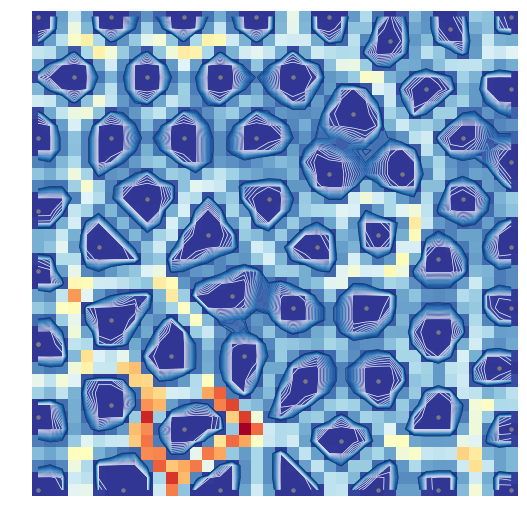

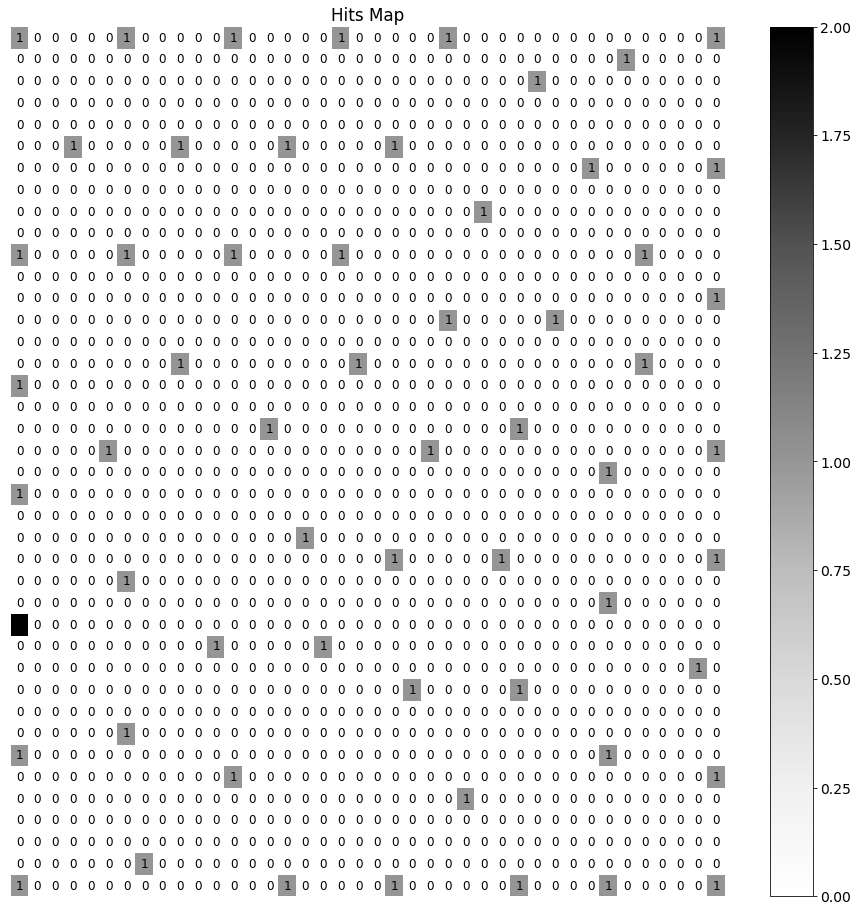

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


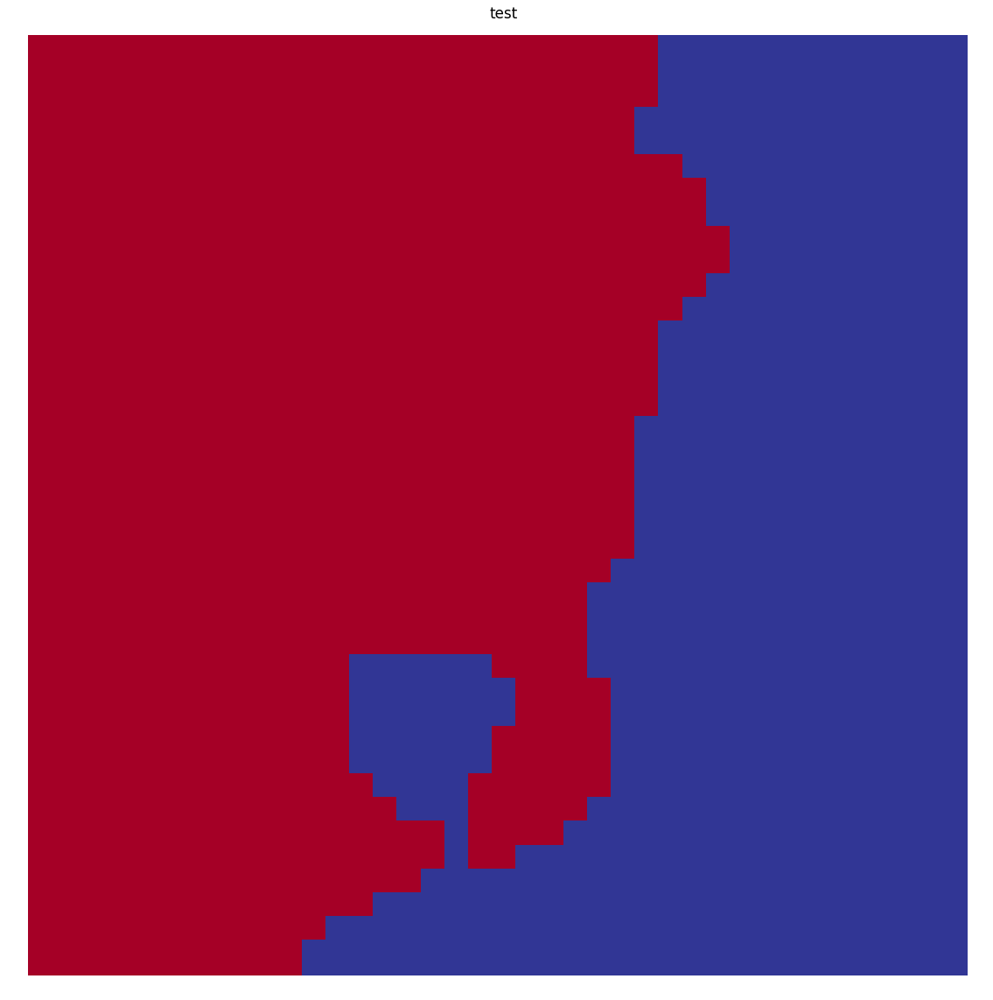

In [111]:
umat = sompy.umatrix.UMatrixView(50, 50, 'umatrix', show_axis=True, text_size=8, show_text=True)
umat.show(new_som)

from sompy.visualization.bmuhits import BmuHitsView
bmuhits  = BmuHitsView(50,50,"Hits Map",text_size=14)
bmuhits.show(new_som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

v  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
new_som.cluster(n_clusters=2)
v.show(new_som, what='cluster')

New map_size [6, 6]


/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


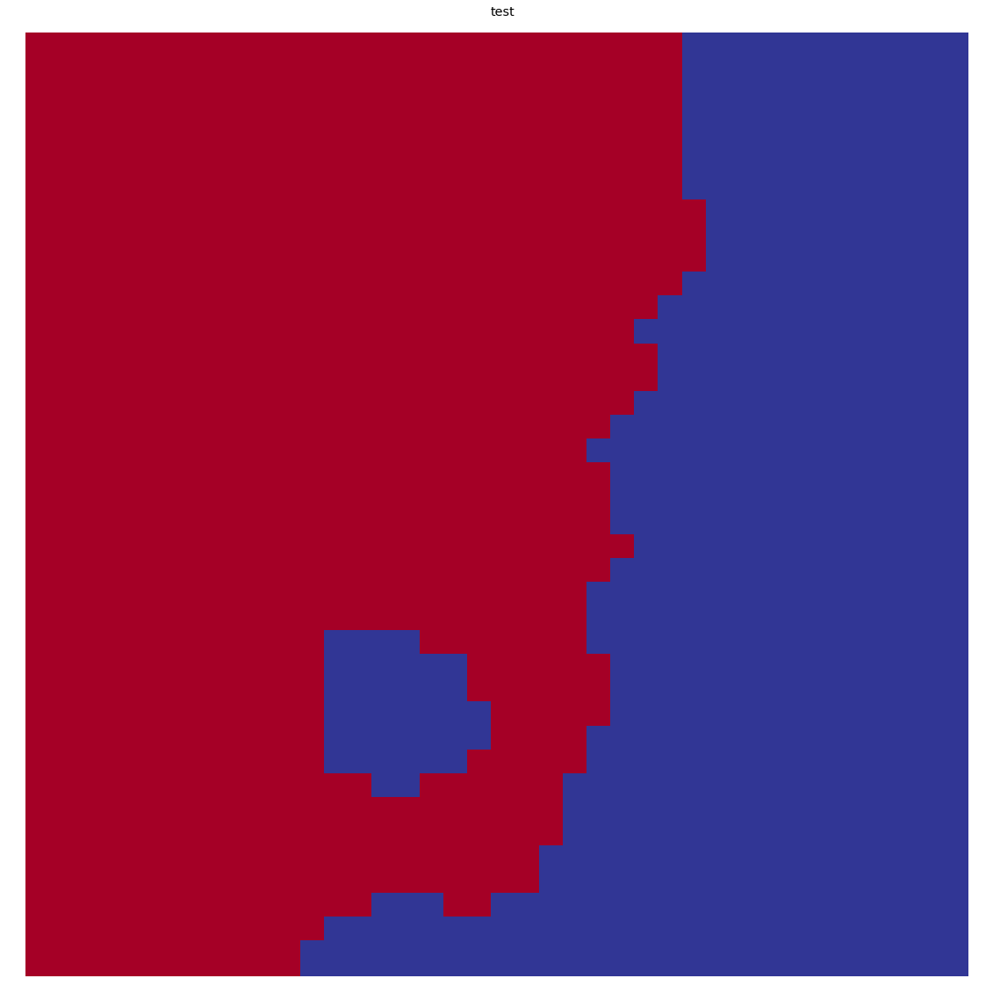

In [112]:
map_size = new_som.calculate_map_size('rect')
print("New map_size {}".format(map_size))


group_0_19 = data[:60]
new_som = sompy.SOMFactory.build(group_0_19, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
new_som.train(n_job=1, verbose='', train_rough_len=1000)

v  = sompy.mapview.View2DPacked(1, 1, 'test',text_size=12)  
new_som.cluster(n_clusters=2)
v.show(new_som, what='cluster')

## Scikit-cmeans

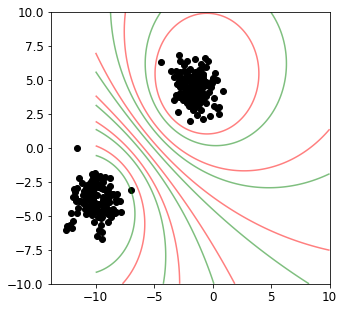

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from skcmeans.algorithms import Probabilistic
from sklearn.datasets import make_blobs


plt.figure(figsize=(5, 5)).add_subplot(aspect='equal')
n_clusters = 2

data, labels = make_blobs(n_samples=300, centers=n_clusters, random_state=1)

clusterer = Probabilistic(n_clusters=n_clusters, n_init=20)
clusterer.fit(data)
xx, yy = np.array(np.meshgrid(np.linspace(-10, 10, 1000), np.linspace(-10, 10, 1000)))
z = np.rollaxis(clusterer.calculate_memberships(np.c_[xx.ravel(), yy.ravel()]).reshape(*xx.shape, -1), 2, 0)
colors = 'rgbyco'
for membership, color in zip(z, colors):
    plt.contour(xx, yy, membership, colors=color, alpha=0.5)
plt.scatter(data[:, 0], data[:, 1], c='k')
plt.show()

In [114]:
print(labels)
print(data)

[1 1 0 0 0 0 1 0 0 1 1 1 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 1 1 1 1 0 1
 0 1 0 0 1 0 0 1 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 0 0 0 1
 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 1 1 1 0 1 1 1 0 1 0 1 1 0 0 0 1 0 1
 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 0 1 0 1 0 1
 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 1 1 1 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0 1
 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 1 0 1 1 1 0 1 0 1 0
 0 1 1 0 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0
 0 1 1 1]
[[-1.10195984e+01 -3.15882031e+00]
 [-9.31371118e+00 -4.30675853e+00]
 [-2.87930430e+00  6.85585852e+00]
 [-1.61589091e+00  4.18017563e+00]
 [-1.46126019e+00  4.52549851e+00]
 [-1.13009458e+00  4.54419108e+00]
 [-1.01336898e+01 -4.75061833e+00]
 [-7.58703957e-01  3.72276201e+00]
 [-2.30647659e+00  5.30797676e+00]
 [-1.04205695e+01 -3.86688414e+00]
 [-1.02566954e+01 -3.76405535e+00]
 [-8.

In [115]:
data

array([[-1.10195984e+01, -3.15882031e+00],
       [-9.31371118e+00, -4.30675853e+00],
       [-2.87930430e+00,  6.85585852e+00],
       [-1.61589091e+00,  4.18017563e+00],
       [-1.46126019e+00,  4.52549851e+00],
       [-1.13009458e+00,  4.54419108e+00],
       [-1.01336898e+01, -4.75061833e+00],
       [-7.58703957e-01,  3.72276201e+00],
       [-2.30647659e+00,  5.30797676e+00],
       [-1.04205695e+01, -3.86688414e+00],
       [-1.02566954e+01, -3.76405535e+00],
       [-8.61139824e+00, -3.40521896e+00],
       [-1.00754365e-01,  4.51589257e+00],
       [-1.09947323e+01, -4.06014253e+00],
       [-1.11054250e+01, -3.97106687e+00],
       [-1.41076074e+00,  4.10984872e+00],
       [-2.99151157e+00,  2.64580131e+00],
       [-1.25041532e+01, -6.06751247e+00],
       [-1.34052081e+00,  4.15711949e+00],
       [-1.01077040e+01, -3.94479960e+00],
       [ 1.50975008e-01,  3.10076295e+00],
       [-1.01659113e+01, -4.12752889e+00],
       [-5.27930518e-01,  5.92630669e+00],
       [-1.

In [116]:
group_0_19 = data[1:60]
len(group_0_19)
test = data[0]

In [117]:
mapsize = [40,40]
som_classify_0_19 = sompy.SOMFactory.build(group_0_19, mapsize, mask=None, mapshape='planar', lattice='rect', normalization='var', initialization='pca', neighborhood='gaussian', training='batch', name='sompy')  # this will use the default parameters, but i can change the initialization and neighborhood methods
som_classify_0_19.train(n_job=1, verbose='', train_rough_len=500)

/home/sarai/.virtualenvs/hybrid-approach/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


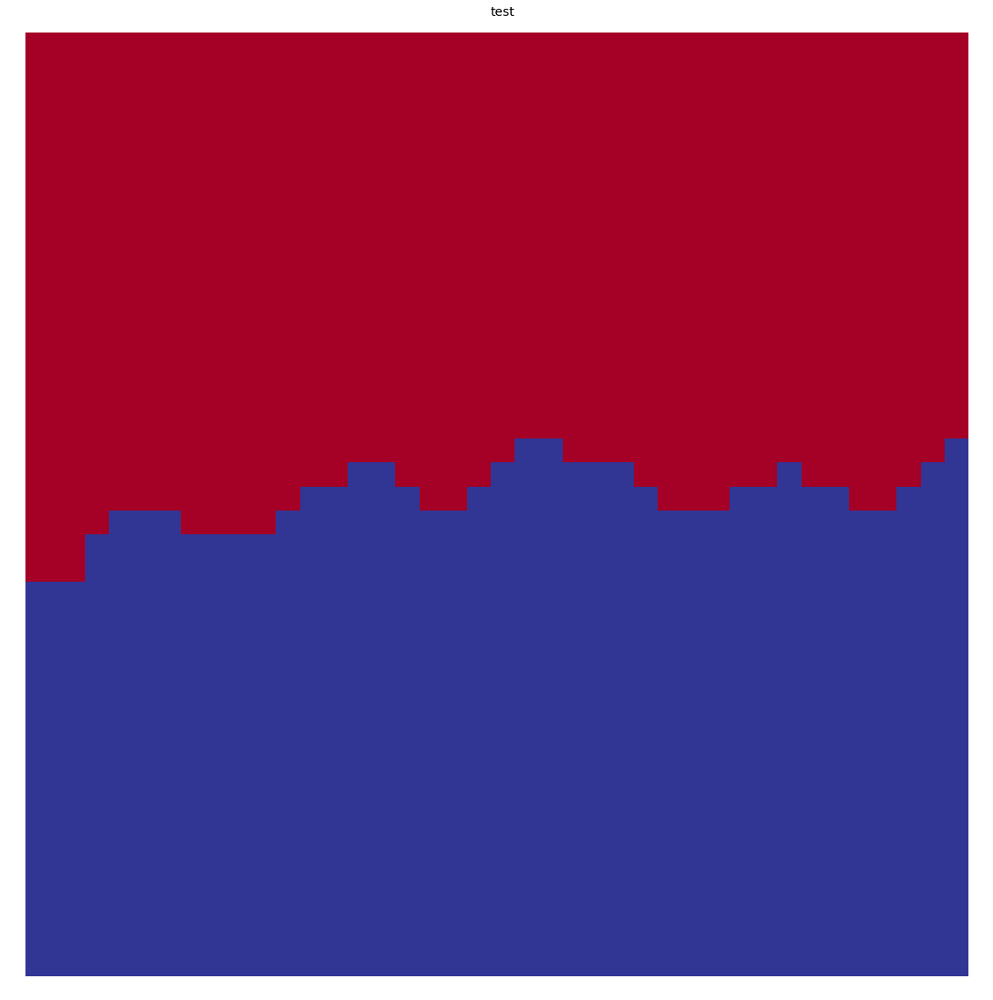

In [118]:
v  = sompy.mapview.View2DPacked(5, 5, 'test',text_size=12)  
som_classify_0_19.cluster(n_clusters=2)
v.show(som_classify_0_19, what='cluster')

In [119]:
som_classify_0_19.predict(group_0_19, k=2)

ValueError: query data dimension must match training data dimension